<!-- O plano e fazer a extracao exclusiva da elite. Quero reaproveitar o que peguei de todos e juntar com o que ja tenho da elite.

Depois, vou pegar o grupo de pessoas da elite que nao foram contempladas e dividir nos grupos de “precisa contemplar” e “incontemplaveis” (aqueles que ja deram erro porque nao existem ou porque ha zero tweets nas datas propostas). 

✅✅✅

-->

In [1]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

### Tweets

#### Classificacao

In [2]:
# tweets elite

# tweets (geral)
tweets = pd.read_csv('user_tweets.csv')
tweets = tweets.drop_duplicates().dropna()

# tweets (elite)
tweets_elite = pd.read_csv('user_tweets_elite.csv').drop(columns=['author_id'])
tweets_elite.columns = ['user_id', 'text', 'created_at', 'id', 'author_id']
tweets_elite = tweets_elite.drop_duplicates().dropna()

# tweets (elite com erro)
tweets_erro = pd.read_csv('user_tweets_fail_elite.csv').drop(columns=['author_id'])
tweets_erro.columns = ['user_id', 'pagination_token', 'text', 'created_at', 'id', 'author_id']
tweets_erro = tweets_erro.drop_duplicates().dropna().drop(columns=['pagination_token'])

# elite ids
elite_ids = pd.read_csv('../../AWS/elite_id.csv')['id'].to_list()

# tweets de influencers
tweets_elite = pd.concat([tweets[tweets.user_id.isin(elite_ids)],
                                tweets_elite[tweets_elite.user_id.isin(elite_ids)], 
                                tweets_erro[tweets_erro.user_id.isin(elite_ids)]]).drop_duplicates().dropna()
tweets_elite = tweets_elite[tweets_elite['user_id'].isin(elite_ids)]
tweets_elite.head()

,user_id,text,created_at,id,author_id
63,276929286,Novo episódio do Podcast “Prisioneiros do Rock...,2020-10-03T21:33:48.000Z,1.312506e+18,276929286.0
185,353508332,"Acabou de publicar uma foto em Alto Alegre, Sa...",2020-10-28T10:42:51.000Z,1.321402e+18,353508332.0
186,353508332,"Acabou de publicar uma foto em Alto Alegre, Sa...",2020-10-16T10:02:22.000Z,1.317043e+18,353508332.0
187,353508332,Tudo posso naquele que me fortalece !!!\n#tbt ...,2020-10-15T10:01:47.000Z,1.316681e+18,353508332.0
188,353508332,#especial https://t.co/dr31yPounV,2020-10-12T14:06:38.000Z,1.315655e+18,353508332.0


In [3]:
# Total tweets
len(tweets_elite)

38985

In [4]:
# preprocessamento tweets

import re
import unidecode
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Inicializa os recursos de NLP
stop_words_add = ['sobre', 'gente', 'aqui', 'hoje', 'voce', 'vc', 'ne', 
                  'pessoas', 'pra', 'ai', 'bom', 'fazer', 'dia', 
                  'ano', 'vai', 'nada', 'ter', 'vou', 'ate', 'ta', 
                  'ja', 'pq', 'assim', 'nao', 'tudo', 'sao', 'acho', 'tbm', 'sei']
stop_words = set(stopwords.words('portuguese') + stop_words_add)
lemmatizer = WordNetLemmatizer()

# Preprocessamento
def preprocess_tweet(tweet):
    tweet = re.sub(r'\bk+\b', '', tweet)
    tweet = re.sub(r'\bhaha+\b', '', tweet)
    tweet = re.sub(r'\s+', ' ', tweet).strip()
    tweet = re.sub(r'http\S+|@\S+|RT', '', tweet)
    tweet = re.sub(r'\W', ' ', tweet)
    tweet = tweet.lower()
    tweet = unidecode.unidecode(tweet)
    tokens = [word for word in tweet.split() if word not in stop_words]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return ' '.join(tokens)

tweets_elite['processed_tweet'] = tweets_elite['text'].astype(str).apply(preprocess_tweet)

[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/mindera/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
# keywords selecionados por chatgpt entre os tweets existentes

import re
import unidecode

all_words = set([item for sublist in [value.split(' ') 
                      for value in tweets_elite['processed_tweet'].tolist()]
                      for item in sublist])

feminism_keywords = set([
    'assedio', 'violencia', 'mulherismo', 'feminismo', 'mulher', 
    'mulheres', 'patriarcado', 'machismo', 'misoginos', 'misoginia', 'feminicidio', 
    'transfobia', 'travesti', 'estupro', 'abuso', 'sexismo', 'trans ', 
    'feminista', 'lgbtqi', 'lgbtttia', 'lgbti', 
    'bissexual', 'lesbica', 'transgenero', 'intersex', 'igualdade de genero', 'prostituicao',
    'abortista', 'abortistas', 'reprodutiva', 'autonomia', 'emancipacao', 'genero', 
    'salario', 'maternidade', 'reprodutivos', 'direitos da mulher', 
    'lgbt', 'sexismo', 'sexista', 'aborto', 'igualdade salarial', 
    'discriminacao', 'genero', 'estereotipo de genero', 
    'domestica', 'sexual', 'direito das mulheres', 'misoginia',
    'feminicidio', 'violencia', 'assedio', 'mulherismo', 'feminismo', 'igualdade', 
    'transgenero', 'aborto', 'machismo', 'misoginia', 'transfobia', 'feminista', 
    'direitos da mulher', 'lgbtqia', 'sexismo', 'abuso', 'estupro', 
    'misogino', 'patriarcado', 'travesti', 'abortista', 'igualdade salarial', 
    'direitos reprodutivos', 'prostituicao', 'emancipacao', 'discriminacao de genero', 
    'desigualdade de genero', 'violencia domestica', 'trans ', 'abortistas', 
    'homofobico', 'abuso sexual', 'direito das mulheres', 'marielle', 'mulheres', 
    'reprodutiva', 'marital', 'lgbtxyz', 'lgbtfobico',
    'violencia', 'mulher', 'igualdade', 'assedio', 'marital', 'feminismo', 'feminista',
    'machismo', 'trans ', 'transfobia', 'feminicidio', 'misoginos', 'abusivo', 'estupro', 'estupr'
    'feminista', 'mulherismo', 'travestis', 'travesty', 'abort', 'direitos', 'prostituicao', 
    'sexo', 'sexualidade', 'machista', 'misoginia', 'misogino', 'feminista', 'feminina', 
    'femininas', 'prostituta', 'aborto', 'misogina', 'violento', 'violencia', 'feminicida',
    'assedio', 'violencia', 'igualdade', 'mulherismo', 'feminicidio', 'mulheres', 
    'aborto', 'marital', 'abortista', 'trans ', 'transfobia', 'machismo', 'misoginia',
    'feminista', 'feminismo', 'feministas', 'patriarcado', 'transgenero', 'transgeneros',
    'travesti', 'travestis', 'genero', 'sexismo', 'sexista', 'sexistas', 'igualdade', 
    'abuso', 'abusivo',
    'abusos', 'estupro', 'estuprador', 'estupradores', 'transgeneridade', 'violacao', 
    'violações', 'empoderamento', 'direitos', 'reprodutivos', 'reprodutiva', 
    'reprodutivo', 'assediador', 'assediadores', 'discriminacao', 'discriminacao', 'feminina', 
    'femininas', 'masculinidade', 'masculinidades', 'feminazi', 'feminazis', 'opressao', 
    'oprimida', 'oprimidas', 'igualitaria', 'igualitario', 'igualitarias', 'igualitarios'
])

def preprocess_word(word):
    word = re.sub(r'\bk+\b', '', word)
    word = re.sub(r'\bhaha+\b', '', word)
    word = re.sub(r'\s+', ' ', word).strip()
    word = re.sub(r'http\S+|@\S+|#\S+|RT', '', word)
    word = re.sub(r'\W', ' ', word)
    word = word.lower()
    word = unidecode.unidecode(word)
    return word

feminism_keywords = [preprocess_word(fk) 
                     for fk in feminism_keywords
                     if fk in all_words]

def encontrar_palavras(texto, palavras):
    return [palavra for palavra in palavras if palavra in texto]

tweets_elite['feminist_words'] = tweets_elite['processed_tweet'].apply(lambda x: encontrar_palavras(x, feminism_keywords))
tweets_elite['feminist_related'] = tweets_elite['feminist_words'].apply(lambda x: len(x) > 0)

tweets_elite.head()

,user_id,text,created_at,id,author_id,processed_tweet,feminist_words,feminist_related
63,276929286,Novo episódio do Podcast “Prisioneiros do Rock...,2020-10-03T21:33:48.000Z,1.312506e+18,276929286.0,novo episodio podcast prisioneiros rock tres d...,[],False
185,353508332,"Acabou de publicar uma foto em Alto Alegre, Sa...",2020-10-28T10:42:51.000Z,1.321402e+18,353508332.0,acabou publicar foto alto alegre paulo,[],False
186,353508332,"Acabou de publicar uma foto em Alto Alegre, Sa...",2020-10-16T10:02:22.000Z,1.317043e+18,353508332.0,acabou publicar foto alto alegre paulo,[],False
187,353508332,Tudo posso naquele que me fortalece !!!\n#tbt ...,2020-10-15T10:01:47.000Z,1.316681e+18,353508332.0,posso naquele fortalece tbt foto top especial ...,[],False
188,353508332,#especial https://t.co/dr31yPounV,2020-10-12T14:06:38.000Z,1.315655e+18,353508332.0,especial,[],False


In [6]:
# tweets manualmente classificados

tweets_manual = pd.read_csv('tweets_classified_manual_test.csv').drop(columns=['Unnamed: 0', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14'])
tweets_manual.rename({'classificacoes' : 'classificacoes_manual', 
                      'feminism_related' : 'feminism_related_manual',
                      'is_offensive' : 'is_offensive_manual', 
                      'offensive_with' : 'offensive_with_manual', 
                      'is_compliment' : 'is_compliment_manual', 
                      'compliment_for' : 'compliment_for_manual'}, axis=1, inplace=True)

tweets_manual['processed_tweet'] = tweets_manual['text'].astype(str).apply(preprocess_tweet)
tweets_manual['feminist_words'] = tweets_manual['processed_tweet'].apply(lambda x: encontrar_palavras(x, feminism_keywords))
tweets_manual['feminist_related'] = tweets_manual['feminist_words'].apply(lambda x: len(x) > 0)
tweets_manual['random'] = 1
tweets_manual.head()

,user_id,created_at,text,classificacoes_manual,feminism_related_manual,is_offensive_manual,offensive_with_manual,is_compliment_manual,compliment_for_manual,processed_tweet,feminist_words,feminist_related,random
0,16011054,2020-10-06T13:09:36.000Z,"RT @paperflower: Olá, queridíssimas mulheres d...","mulher, emprego",True,False,NaN,False,NaN,ola queridissimas mulheres tech desta rede vag...,"[mulher, mulheres]",True,1
1,16011054,2020-10-02T22:10:24.000Z,Cadê umas mulheres front pra vir pra equipe &l...,"mulher, emprego",True,False,NaN,False,NaN,cade uma mulheres front vir equipe lt 3 candid...,"[mulher, mulheres]",True,1
2,951468085445386240,2020-12-29T18:06:28.000Z,RT @luu_viegas: Essa rede é de AFETO. \nAINDA...,"mulher, jurídico, rede",True,False,NaN,False,NaN,rede afeto aindaa digam rede afeto saiu protet...,[mulher],True,1
3,951468085445386240,2020-12-29T11:36:06.000Z,RT @ehkoda: Alô alô graças a deus faltam 16 di...,"trans, financiamento",True,False,NaN,False,NaN,alo alo gracas deus faltam 16 dia acabar finan...,[],False,1
4,951468085445386240,2020-12-22T20:19:20.000Z,RT @transpreta: URGENTE AJUDEM A COMPARTILHAR ...,"trans, desaparecida",False,False,NaN,False,NaN,urgente ajudem compailhar irma travesti rio ja...,[travesti],True,1


In [7]:
# tweets a classificar (gpt)

pd.concat([tweets_elite[['user_id', 'created_at', 'text', 'feminist_related', 'feminist_words']],
          tweets_manual[['user_id', 'created_at', 'text', 'feminist_related', 'feminist_words']]]).sort_values('created_at').dropna().to_csv('elite_gpt.csv')


prompt = """
O arquivo influencers_gpt.csv contém os tweets que desejo estudar. Ele tem as seguintes colunas:
user_id - o usuário do Twitter que criou o tweet
created_at -	o momento em que o tweet foi criado
text -	o texto do tweet
feminist_related - se o tweet tem alguma das palavras chave que estao na lista "topicos_possiveis"
feminist_words - quais palavras da lista topicos_possiveis estao no tweet

Seu objetivo é criar as seguintes colunas para esse arquivo:

classificacoes - aqui, você deve classificar quais tópicos que o tweet (coluna text) aborda. Os tópicos possíveis estão na lista topicos_possiveis. A ideia e que voce possa fazer uma analise mais profunda e complexa que apenas verificar se a palavra que escolhi em "topicos possiveis". Por exemplo, "aborto" e um topico possivel, mas talvez o tweet aborde isto de outra maneira, como "interrupcao da gravidez". Seu papel e verificar os casos que a simples analise de keywords nao funciona;

feminism_related_gpt	- aqui, você deve dizer se o tweet (coluna text) tem alguma relação com agenda feminista, questões femininas ou críticas, elogios ou opiniões sobre feminismo. A ideia novamente e tentar verificar casos mais complexos, em que a simples analise de keywords nao foi suficiente;

is_offensive - aqui, você deve dizer se o tweet (coluna text) tem um conteúdo ofensivo (true or false);

offensive_with -	 aqui, caso o tweet (coluna text) seja ofensivo, você deve dizer contra quem ele é ofensivo;

is_compliment -	aqui, você deve sizer se o tweet (coluna text) contém um elogio (true or false);

compliment_for - aqui, caso o tweet (coluna text) contenha um alogio, diga quem ele elogia

topicos_possiveis = ['aborto', 'abuso', 'adocao', 'agressao', 'amizade', 'amor', 'antifeminista', 'aparencia', 'arma', 'arte', 'assedio', 'bissexualidade', 'bolsonaro', 'classe', 'comportamento', 'crianca', 'cuidado', 'democracia', 'denuncia', 'dilma', 'direitos', 'direitos humanos', 'direitos lgbt', 'direitos negros', 'direitos reprodutivos', 'direitos trabalhistas', 'discriminacao', 'economia', 'educacao', 'eleicoes', 'elogio', 'elogio mulher', 'elogio mulher negra', 'emprego', 'esporte', 'esquerda', 'estupro', 'estupro marital', 'fake news', 'familia', 'feminicidio', 'feminismo negro', 'feminismo radical', 'feminista', 'financas', 'fraude', 'genero', 'gordofobia', 'homofobia', 'identidade de genero', 'ideologia de genero', 'igualdade', 'igualdade de direitos', 'igualdade de genero', 'igualdade racial', 'impeachment', 'judeus', 'lesbica', 'lgbt', 'liberdade', 'liberdade de expressao', 'liberdade feminina', 'liberdade individual', 'lideranca', 'lideranca feminina', 'lideranca feminina negra', 'livro', 'machismo', 'marielle', 'marxismo', 'maternidade', 'meio ambiente', 'meme', 'midia', 'militancia', 'misoginia', 'mulher', 'mulher indigena', 'mulher negra', 'negro', 'novela', 'ofensa', 'ofensa esquerda', 'ofensa feminista', 'ofensa lgbt', 'ofensa mulher', 'opressao', 'pandemia', 'patriarcado', 'politica', 'politicas publicas', 'privilegio', 'prostituicao', 'racismo', 'reality show', 'relacionamento', 'relacionamento abusivo', 'relacoes sociais', 'religiao', 'representatividade', 'salario', 'saude', 'sexualidade', 'stem', 'tradicao', 'trafico de drogas', 'trafico de pessoas', 'trans', 'transfobia', 'transporte', 'vacina', 'violencia', 'violencia contra mulher', 'violencia contra mulher trans', 'violencia domestica', 'violencia obstetrica', 'violencia policial', 'violencia sexual']

Gere o arquivo influencers_gpt_updated.csv com as colunas pedidas e deixe-o disponível para download.


O arquivo Classified_General_Tweets_GPT - Manual - Treino.csv contem um exemplo desse trabalho feito manualmente por mim.
"""

In [8]:
# tweets classificados (gpt)

tweets_elite_gpt = pd.read_csv('elite_gpt_updated.csv').drop(columns=['Unnamed: 0', 'feminist_words'])
tweets_elite_gpt.rename({'feminist_related': 'feminism_related_keywords'}, axis=1, inplace=True)
tweets_elite_gpt.head()

,user_id,created_at,text,feminism_related_keywords,classificacoes,feminism_related_gpt,is_offensive,offensive_with,is_compliment,compliment_for
0,939095372,2020-10-01T00:00:16.000Z,Alguém me diz quem foi que inventou a matemáti...,False,NaN,False,False,NaN,False,NaN
1,331096839,2020-10-01T00:00:44.000Z,@CezarItayran Você de ter nascido.. Mito 2022 ...,False,NaN,False,False,NaN,False,NaN
2,88486547,2020-10-01T00:00:54.000Z,Comprei o livro ontem e já to quase na metade 😍😂,False,livro,False,False,NaN,False,NaN
3,331096839,2020-10-01T00:02:03.000Z,@mariviannax Que merda hemm !!! https://t.co/8...,False,NaN,False,False,NaN,False,NaN
4,1243979812789723136,2020-10-01T00:03:49.000Z,RT @DouglasGarcia: Cauê Macris tentou dar o go...,False,NaN,False,False,NaN,False,NaN


In [9]:
# tweets classificados (influencers + manual)
# nao esquecer de retirar manual para analise

tweets_classificados = tweets_elite_gpt.merge(tweets_manual[['user_id', 'created_at', 'text', 
                                                                   'classificacoes_manual', 'feminism_related_manual', 
                                                                    'is_offensive_manual', 'offensive_with_manual', 
                                                                    'is_compliment_manual', 'compliment_for_manual',
                                                                    'feminist_words', 'random']],
                             how = 'left',
                             on=['user_id', 'created_at', 'text'])


tweets_classificados = tweets_classificados[['user_id', 'created_at', 'text',                      
                                            'is_offensive_manual', 'offensive_with_manual',
                                            'is_offensive', 'offensive_with',                                            
                                            'is_compliment_manual', 'compliment_for_manual', 
                                            'is_compliment', 'compliment_for',                                             
                                            'feminism_related_manual', 'feminism_related_keywords', 'feminism_related_gpt', 
                                            'classificacoes', 'classificacoes_manual',                                            
                                            'feminist_words', 
                                            'random']]

tweets_classificados.head()

,user_id,created_at,text,is_offensive_manual,offensive_with_manual,is_offensive,offensive_with,is_compliment_manual,compliment_for_manual,is_compliment,compliment_for,feminism_related_manual,feminism_related_keywords,feminism_related_gpt,classificacoes,classificacoes_manual,feminist_words,random
0,939095372,2020-10-01T00:00:16.000Z,Alguém me diz quem foi que inventou a matemáti...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN
1,331096839,2020-10-01T00:00:44.000Z,@CezarItayran Você de ter nascido.. Mito 2022 ...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN
2,88486547,2020-10-01T00:00:54.000Z,Comprei o livro ontem e já to quase na metade 😍😂,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,livro,NaN,NaN,NaN
3,331096839,2020-10-01T00:02:03.000Z,@mariviannax Que merda hemm !!! https://t.co/8...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN
4,1243979812789723136,2020-10-01T00:03:49.000Z,RT @DouglasGarcia: Cauê Macris tentou dar o go...,NaN,NaN,False,NaN,NaN,NaN,False,NaN,NaN,False,False,NaN,NaN,NaN,NaN


In [10]:
# metricas

tweets_classificados_metricas = tweets_classificados[tweets_classificados.random == 1].copy()

In [11]:
# calculo das metricas: feminism_related, is_offensive, is_compliment
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score

# feminism_related, is_offensive, is_compliment
# Acurácia, Matriz de Confusão, Precisão, Revocação e F1-Score

def analisar_classificacao(df, coluna_manual, coluna_gpt):
    matriz_confusao = confusion_matrix(df[coluna_manual], df[coluna_gpt])
    TN, FP, FN, TP = matriz_confusao.ravel()

    acuracia = accuracy_score(df[coluna_manual], df[coluna_gpt])
    precisao = precision_score(df[coluna_manual], df[coluna_gpt])
    sensibilidade = recall_score(df[coluna_manual], df[coluna_gpt])
    f1 = f1_score(df[coluna_manual], df[coluna_gpt])
    especificidade = TN / (TN + FP)

    # Taxa de Falsos Positivos
    fpr = FP / (FP + TN)

    # Taxa de Falsos Negativos
    fnr = FN / (FN + TP)

    # Balanced Accuracy
    balanced_accuracy = (sensibilidade + especificidade) / 2

    # Índice Kappa de Cohen
    # kappa = cohen_kappa_score(df[coluna_manual], df[coluna_gpt])

    return {
        "matriz_confusao": matriz_confusao,
        "acuracia": round(acuracia*100, 2),
        "precisao": round(precisao*100, 2),
        "revocacao": round(sensibilidade*100, 2),
        "f1_score": round(f1*100, 2),
        "especificidade": round(especificidade*100, 2),
        "taxa_falsos_positivos": round(fpr*100, 2),
        "taxa_falsos_negativos": round(fnr*100, 2),
        "balanced_accuracy": round(balanced_accuracy*100, 2),
        # "kappa": kappa
    }


tweets_classificados_metricas['feminism_related_manual'] = tweets_classificados_metricas['feminism_related_manual'].astype(bool)
tweets_classificados_metricas['is_offensive_manual'] = tweets_classificados_metricas['is_offensive_manual'].astype(bool)
tweets_classificados_metricas['is_compliment_manual'] = tweets_classificados_metricas['is_compliment_manual'].astype(bool)

metricas_feminism = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminism_related_gpt')
metricas_feminism_keywords = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminism_related_keywords')

metricas_offenses = analisar_classificacao(tweets_classificados_metricas, 'is_offensive_manual', 'is_offensive')
metricas_compliments = analisar_classificacao(tweets_classificados_metricas, 'is_compliment_manual', 'is_compliment')

In [12]:
# Metricas: feminism_related (manual x gpt)
metricas_feminism

{'matriz_confusao': array([[ 98,  74],
        [146, 151]]),
 'acuracia': 53.09,
 'precisao': 67.11,
 'revocacao': 50.84,
 'f1_score': 57.85,
 'especificidade': 56.98,
 'taxa_falsos_positivos': 43.02,
 'taxa_falsos_negativos': 49.16,
 'balanced_accuracy': 53.91}

In [13]:
# Metricas: feminism_related (manual x keywords)
metricas_feminism_keywords

{'matriz_confusao': array([[ 41, 131],
        [ 14, 283]]),
 'acuracia': 69.08,
 'precisao': 68.36,
 'revocacao': 95.29,
 'f1_score': 79.61,
 'especificidade': 23.84,
 'taxa_falsos_positivos': 76.16,
 'taxa_falsos_negativos': 4.71,
 'balanced_accuracy': 59.56}

GPT tem muitos falsos negativos e muitos falsos positivos.

O método de keywords tem poucos falsos negativos e muitos falsos positivos. Isso significa que se ele diz que não é, provavelmente não é mesmo, mas acabamos com mais tweets classificados como de interesse sem ser.

Vamos analisar as keywords usadas - dividiremos os tweets de teste em dois - validação e teste.
Tentaremos localizar o problema com a validação (50%) e testaremos nossa hipótese nos tweets que restarem (50%).

In [14]:
# separacao validacao e teste

import numpy as np

np.random.seed(42)
tweets_classificados_metricas['validacao'] = np.random.choice([0, 1], size=len(tweets_classificados_metricas))

tweets_classificados_metricas.validacao.value_counts()

validacao
1    241
0    228
Name: count, dtype: int64

In [15]:
# analise keywords (% de problemas)

from collections import Counter

sublists = tweets_classificados_metricas[(tweets_classificados_metricas['validacao'] == 1) & 
                                         (tweets_classificados_metricas['feminism_related_manual'] == False) & 
                                         (tweets_classificados_metricas['feminism_related_keywords'] == True)].feminist_words.to_list()
all_termos_misleading = [word for sublist in sublists for word in sublist]

count_termos_misleading = dict(Counter(all_termos_misleading))

{k: round((v/len(all_termos_misleading))*100, 1) for k, v in count_termos_misleading.items()}

{'abusivo': 1.4,
 'mulher': 30.6,
 'sexo': 8.3,
 'violacao': 1.4,
 'direitos': 25.0,
 'violencia': 8.3,
 'assediador': 2.8,
 'autonomia': 1.4,
 'mulheres': 2.8,
 'igualdade': 2.8,
 'genero': 2.8,
 'abuso': 1.4,
 'homofobico': 1.4,
 'salario': 6.9,
 'travesti': 2.8}

'mulher', 'sexo', 'direitos', 'violencia' e 'salario' parecem os maiores problemas. Vamos ver como a analise de keywords se comporta sem essas duas.

In [16]:
# novas metricas
new_feminism_keywords = [keyword for keyword in feminism_keywords if keyword not in ['mulher', 'sexo', 'direitos', 'violencia', 'salario']]

tweets_classificados_metricas['processed_tweet'] = tweets_classificados_metricas['text'].astype(str).apply(preprocess_tweet)

tweets_classificados_metricas['feminist_words_new'] = tweets_classificados_metricas['processed_tweet'].apply(lambda x: encontrar_palavras(x, new_feminism_keywords))
tweets_classificados_metricas['feminist_related_keywords_new'] = tweets_classificados_metricas['feminist_words_new'].apply(lambda x: len(x) > 0)

metricas_feminism_keywords_new = analisar_classificacao(tweets_classificados_metricas, 'feminism_related_manual', 'feminist_related_keywords_new')
metricas_feminism_keywords_new

{'matriz_confusao': array([[143,  29],
        [ 73, 224]]),
 'acuracia': 78.25,
 'precisao': 88.54,
 'revocacao': 75.42,
 'f1_score': 81.45,
 'especificidade': 83.14,
 'taxa_falsos_positivos': 16.86,
 'taxa_falsos_negativos': 24.58,
 'balanced_accuracy': 79.28}

Melhoramos muito! Agora apenas temos 17% de falsos positivos e 25% de falsos negativos.<br>
Vamos usar as **keywords** para fazer analise do que é feminista ou não.

In [17]:
# aplicando novas metricas ao conjunto completo

tweets_classificados['processed_tweet'] = tweets_classificados['text'].astype(str).apply(preprocess_tweet)

tweets_classificados['feminist_words_new'] = tweets_classificados['processed_tweet'].apply(lambda x: encontrar_palavras(x, new_feminism_keywords))
tweets_classificados['feminist_related_keywords_new'] = tweets_classificados['feminist_words_new'].apply(lambda x: len(x) > 0)
tweets_classificados['feminist_related_new'] = tweets_classificados['feminist_related_keywords_new']

In [18]:
# Metricas: is_offensive
metricas_offenses

{'matriz_confusao': array([[402,   2],
        [ 65,   0]]),
 'acuracia': 85.71,
 'precisao': 0.0,
 'revocacao': 0.0,
 'f1_score': 0.0,
 'especificidade': 99.5,
 'taxa_falsos_positivos': 0.5,
 'taxa_falsos_negativos': 100.0,
 'balanced_accuracy': 49.75}

Muitos falsos negativos - pegamos muito menos ofensas que deveríamos. 

Vamos tentar algumas abordagens diferentes.

In [19]:
# separacao em tweets de treino, validacao e teste
text_teste = tweets_manual.text.unique().tolist()

tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
print('Total de tweets manualmente classificados: ', len(tweets_treino))

tweets_teste = tweets_treino[tweets_treino.text.isin(text_teste)].copy()

tweets_treino = tweets_treino[~tweets_treino.text.isin(text_teste)]
print('Total de tweets manualmente classificados, excluindo validação e teste: ', len(tweets_treino))

tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)
tweets_teste['processed_tweet'] = tweets_teste['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_offensive']].copy()
test_df = tweets_classificados_metricas[['processed_tweet', 'is_offensive']].copy()

Total de tweets manualmente classificados:  1059
Total de tweets manualmente classificados, excluindo validação e teste:  747


In [20]:
# GPT (para classificar)

tweets_treino[['processed_tweet', 'is_offensive']].to_csv('offensive_trials_train.csv')
tweets_teste[['processed_tweet']].to_csv('offensive_trials_test.csv')

In [21]:
# GPT (classificado)

tweets_teste_gpt = pd.read_csv('offensive_trials_test_updated.csv')
tweets_teste_gpt.rename({'is_offensive': 'is_offensive_gpt'}, axis=1, inplace=True)

tweets_teste_gpt = tweets_teste_gpt.merge(tweets_teste[['processed_tweet', 'is_offensive']],
                                          on='processed_tweet',
                                          how='inner').drop_duplicates(subset='processed_tweet')

tweets_teste_gpt.head()

,processed_tweet,is_offensive_gpt,is_offensive
0,janaina paschoal desculpa esfarrapada manifest...,False,False
2,existe igualdade negro brancos desigualdade ef...,False,False
4,todos acordos dividas cruzeiro estao sendo jog...,False,False
6,problema partir abril 2021 vence acordo teto s...,False,False
8,engracado classificacao etaria filmes colocam ...,False,False


In [22]:
# Metricas

metricas_offenses_gpt = analisar_classificacao(tweets_teste_gpt, 'is_offensive', 'is_offensive_gpt')
metricas_offenses_gpt

{'matriz_confusao': array([[252,   0],
        [ 43,   0]]),
 'acuracia': 85.42,
 'precisao': 0.0,
 'revocacao': 0.0,
 'f1_score': 0.0,
 'especificidade': 100.0,
 'taxa_falsos_positivos': 0.0,
 'taxa_falsos_negativos': 100.0,
 'balanced_accuracy': 50.0}

GPT nao parece o metodo mais adequado. Vamos tentar outras abordagens.

In [23]:
# XGBoost

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import SMOTE

# Carregar os dados
tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_offensive']].copy().drop_duplicates(subset='processed_tweet')

# Pré-processamento básico
# Removendo a coluna desnecessária e convertendo o texto para minúsculas
train_df['processed_tweet'] = train_df['processed_tweet'].str.lower().str.strip()

# Separando os dados em features e target
X = train_df['processed_tweet']
y = train_df['is_offensive']

# Transformação dos textos em vetores numéricos usando TF-IDF
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)

# Separação dos dados em treino e teste
X_train, X_val, y_train, y_val = train_test_split(X_tfidf, y, test_size=0.2, random_state=42, stratify=y)

# Aplicar SMOTE para balancear o conjunto de treinamento
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Configuração do modelo XGBoost
# Calcular o scale_pos_weight
num_false = sum(y_train == False)
num_true = sum(y_train == True)
scale_pos_weight = num_false / num_true

# Configurar o modelo XGBoost com scale_pos_weight ajustado
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    max_depth=6,
    n_estimators=100,
    learning_rate=0.1,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Treinamento

# Com SMOTE
xgb_model.fit(X_train_res, y_train_res)

# SEM SMOTE
# xgb_model.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [24]:
# Fazendo previsões no conjunto de validação
y_pred = xgb_model.predict(X_val)

# pred indireto

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_val)[:, 1]

# Ajustar o threshold
threshold = 0.57104
y_pred_adjusted = (y_pred_proba > threshold).astype(int)

# 9. Avaliando o modelo

# direto
# accuracy = accuracy_score(y_val, y_pred)
# report = classification_report(y_val, y_pred)
# conf_matrix = confusion_matrix(y_val, y_pred)

# indireto
accuracy = accuracy_score(y_val, y_pred_adjusted)
report = classification_report(y_val, y_pred_adjusted)
conf_matrix = confusion_matrix(y_val, y_pred_adjusted)

print(f'Acurácia: {accuracy * 100:.2f}%')
print('Relatório de Classificação:')
print(report)
print('Matriz de Confusão:')
print(conf_matrix)


Acurácia: 81.95%
Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.91      0.88      0.90       181
        True       0.29      0.38      0.33        24

    accuracy                           0.82       205
   macro avg       0.60      0.63      0.61       205
weighted avg       0.84      0.82      0.83       205

Matriz de Confusão:
[[159  22]
 [ 15   9]]


In [25]:
# quais textos sao considerados ofensivos?

# pd.set_option('display.max_rows', 1000)
# pd.set_option('display.max_colwidth', 1000)

# test = pd.DataFrame(data={'X': vectorizer.inverse_transform(X_val),
#                           'y': y_pred_adjusted,
#                           'y_real': y_val})

# print(len(test[(test['y'] == 1) & (test['y_real'] == 0)]))

# test[(test['y'] == 1) & (test['y_real'] == 0)] # Falso Positivo

In [26]:
# Aplicar o modelo treinado no conjunto de testes
test_df = tweets_teste.copy().drop(columns=['Unnamed: 0']).drop_duplicates(subset='text')
test_df['processed_tweet'] = test_df['processed_tweet'].str.lower().str.strip()

X_test = vectorizer.transform(test_df['processed_tweet'])
# test_df['is_offensive_xgboost'] = xgb_model.predict(X_test)

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Ajustar o threshold
threshold = 0.57104
test_df['is_offensive_xgboost'] = (y_pred_proba > threshold).astype(int)

metricas_offenses_xgboost = analisar_classificacao(test_df, 'is_offensive', 'is_offensive_xgboost')
metricas_offenses_xgboost

{'matriz_confusao': array([[237,  17],
        [ 12,  31]]),
 'acuracia': 90.24,
 'precisao': 64.58,
 'revocacao': 72.09,
 'f1_score': 68.13,
 'especificidade': 93.31,
 'taxa_falsos_positivos': 6.69,
 'taxa_falsos_negativos': 27.91,
 'balanced_accuracy': 82.7}

Acho que encontramos nosso modelo! **XGBoost** sera.
Vamos aplicar ele para todos os dados.

In [30]:
# Aplicar o modelo treinado no conjunto total
X_total = vectorizer.transform(tweets_classificados['processed_tweet'])

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_total)[:, 1]

# Ajustar o threshold
threshold = 0.57104
tweets_classificados['is_offensive_new'] = (y_pred_proba > threshold).astype(int)

In [ ]:
# Metricas: is_compliment
metricas_compliments

{'matriz_confusao': array([[433,   9],
        [ 24,   3]]),
 'acuracia': 92.96,
 'precisao': 25.0,
 'revocacao': 11.11,
 'f1_score': 15.38,
 'especificidade': 97.96,
 'taxa_falsos_positivos': 2.04,
 'taxa_falsos_negativos': 88.89,
 'balanced_accuracy': 54.54}

O caso do is_compliment parece bem semelhante ao is_offensive, com GPT não funcionando muito bem. Tentaremos com **XGBoost**.

In [32]:
# XGBoost

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import SMOTE

# Carregar os dados
tweets_treino = pd.read_csv('tweets_classified_manual_total.csv')
tweets_treino['processed_tweet'] = tweets_treino['text'].astype(str).apply(preprocess_tweet)

train_df = tweets_treino[['processed_tweet', 'is_compliment']].copy().drop_duplicates(subset='processed_tweet')

# Pré-processamento básico
# Removendo a coluna desnecessária e convertendo o texto para minúsculas
train_df['processed_tweet'] = train_df['processed_tweet'].str.lower().str.strip()

# Separando os dados em features e target
X = train_df['processed_tweet']
y = train_df['is_compliment']

# Transformação dos textos em vetores numéricos usando TF-IDF
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_tfidf = vectorizer.fit_transform(X)

# Separação dos dados em treino e teste
X_train, X_val, y_train, y_val = train_test_split(X_tfidf, y, test_size=0.2, random_state=42, stratify=y)

# Aplicar SMOTE para balancear o conjunto de treinamento
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Configuração do modelo XGBoost
# Calcular o scale_pos_weight
num_false = sum(y_train == False)
num_true = sum(y_train == True)
scale_pos_weight = num_false / num_true

# Configurar o modelo XGBoost com scale_pos_weight ajustado
xgb_model = xgb.XGBClassifier(
    objective='binary:logistic',
    max_depth=6,
    n_estimators=100,
    learning_rate=0.1,
    scale_pos_weight=scale_pos_weight,
    use_label_encoder=False,
    eval_metric='logloss'
)

# Treinamento

# Com SMOTE
xgb_model.fit(X_train_res, y_train_res)

# SEM SMOTE
# xgb_model.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=100,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [71]:
# Fazendo previsões no conjunto de validação
y_pred = xgb_model.predict(X_val)

# pred indireto

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_val)[:, 1]

# Ajustar o threshold
threshold = 0.703
y_pred_adjusted = (y_pred_proba > threshold).astype(int)

# 9. Avaliando o modelo

# direto
# accuracy = accuracy_score(y_val, y_pred)
# report = classification_report(y_val, y_pred)
# conf_matrix = confusion_matrix(y_val, y_pred)

# indireto
accuracy = accuracy_score(y_val, y_pred_adjusted)
report = classification_report(y_val, y_pred_adjusted)
conf_matrix = confusion_matrix(y_val, y_pred_adjusted)

print(f'Acurácia: {accuracy * 100:.2f}%')
print('Relatório de Classificação:')
print(report)
print('Matriz de Confusão:')
print(conf_matrix)


Acurácia: 90.73%
Relatório de Classificação:
              precision    recall  f1-score   support

       False       0.97      0.93      0.95       195
        True       0.24      0.40      0.30        10

    accuracy                           0.91       205
   macro avg       0.60      0.67      0.62       205
weighted avg       0.93      0.91      0.92       205

Matriz de Confusão:
[[182  13]
 [  6   4]]


In [74]:
# # quais textos sao considerados elogiosos?

# pd.set_option('display.max_rows', 1000)
# pd.set_option('display.max_colwidth', 1000)

# test = pd.DataFrame(data={'X': vectorizer.inverse_transform(X_val),
#                           'y': y_pred_adjusted,
#                           'y_real': y_val})

# print(len(test[(test['y'] == 1) & (test['y_real'] == 0)]))

# test[(test['y'] == 1) & (test['y_real'] == 0)] # Falso Positivo

In [75]:
# Aplicar o modelo treinado no conjunto de testes
test_df = tweets_teste.copy().drop(columns=['Unnamed: 0']).drop_duplicates(subset='text')
test_df['processed_tweet'] = test_df['processed_tweet'].str.lower().str.strip()

X_test = vectorizer.transform(test_df['processed_tweet'])
# test_df['is_offensive_xgboost'] = xgb_model.predict(X_test)

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_test)[:, 1]

# Ajustar o threshold
threshold = 0.703
test_df['is_compliment_xgboost'] = (y_pred_proba > threshold).astype(int)

metricas_offenses_xgboost = analisar_classificacao(test_df, 'is_compliment', 'is_compliment_xgboost')
metricas_offenses_xgboost

{'matriz_confusao': array([[265,  12],
        [  0,  20]]),
 'acuracia': 95.96,
 'precisao': 62.5,
 'revocacao': 100.0,
 'f1_score': 76.92,
 'especificidade': 95.67,
 'taxa_falsos_positivos': 4.33,
 'taxa_falsos_negativos': 0.0,
 'balanced_accuracy': 97.83}

Otimas metricas :) Vamos aplicar para todos os dados.

In [76]:
# Aplicar o modelo treinado no conjunto total
X_total = vectorizer.transform(tweets_classificados['processed_tweet'])

# Obter probabilidades de predição
y_pred_proba = xgb_model.predict_proba(X_total)[:, 1]

# Ajustar o threshold
threshold = 0.703
tweets_classificados['is_compliment_new'] = (y_pred_proba > threshold).astype(int)

In [87]:
# Quantidade de Ofensas e Elogios

print('Quantidade de tweets: ', tweets_classificados.is_offensive_new.count())
print()
print('Quantidade de tweets feministas: ' + str(tweets_classificados.feminist_related_keywords_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.feminist_related_keywords_new.value_counts()[1]/tweets_classificados.feminist_related_keywords_new.count() * 100, 2)) + '%)')
print()
print('Quantidade de tweets ofensivos: ' + str(tweets_classificados.is_offensive_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.is_offensive_new.value_counts()[1]/tweets_classificados.is_offensive_new.count() * 100, 2)) + '%)')
print()
print('Quantidade de tweets elogiosos: ' + str(tweets_classificados.is_compliment_new.value_counts()[1]) + ' (' + str(round(tweets_classificados.is_compliment_new.value_counts()[1]/tweets_classificados.is_offensive_new.count() * 100, 2)) + '%)')


Quantidade de tweets:  39288

Quantidade de tweets feministas: 1012 (2.58%)

Quantidade de tweets ofensivos: 2851 (7.26%)

Quantidade de tweets elogiosos: 170 (0.43%)


Nao faremos aqui a metrica das classificacoes porque ja fizemos com os influencers. Vamos apenas usar diretamente o mesmo método que usamos no lado de lá: as **keywords**.

In [93]:
# Isolando as informações necessárias para análise

tweets_classificados[['user_id', 'created_at', 'text', 
                      'feminist_related_keywords_new', 'feminist_words_new',
                      'is_offensive_new', 'offensive_with',
                      'is_compliment_new', 'compliment_for']].fillna('').to_csv('elite_tweets_to_manual_analysis.csv')

In [1]:
# Final db >> Rodar updates a partir daqui - REVISADO

import pandas as pd
import re
import emoji

tweets_classificados_final = pd.read_csv('elite_tweets_to_manual_analysis_update.csv').drop(columns = ['Unnamed: 0'])

# add hashtags column
def extract_hashtags(text):
    return re.findall(r'#\w+', text)

# add @'s column
def extract_mentions(text):
    return re.findall(r'@\w+', text)

# add emojis column
def extract_emojis(text):
    return ''.join(list(set(c for c in text if emoji.is_emoji(c))))

# Aplicando as funções para criar novas colunas no DataFrame
tweets_classificados_final['hashtags'] = tweets_classificados_final['text'].apply(extract_hashtags)
tweets_classificados_final['mentions'] = tweets_classificados_final['text'].apply(extract_mentions)
tweets_classificados_final['emojis'] = tweets_classificados_final['text'].apply(extract_emojis)

tweets_classificados_final.head()

,user_id,created_at,text,feminist_related_keywords_new,feminist_words_new,is_offensive_new,offensive_with,is_compliment_new,compliment_for,hashtags,mentions,emojis
0,939095372,2020-10-01T00:00:16.000Z,Alguém me diz quem foi que inventou a matemáti...,False,[],0,NaN,0,NaN,[],[],
1,331096839,2020-10-01T00:00:44.000Z,@CezarItayran Você de ter nascido.. Mito 2022 ...,False,[],0,NaN,0,NaN,[],[@CezarItayran],
2,88486547,2020-10-01T00:00:54.000Z,Comprei o livro ontem e já to quase na metade 😍😂,False,[],0,NaN,0,NaN,[],[],😍😂
3,331096839,2020-10-01T00:02:03.000Z,@mariviannax Que merda hemm !!! https://t.co/8...,False,[],0,NaN,0,NaN,[],[@mariviannax],
4,1243979812789723136,2020-10-01T00:03:49.000Z,RT @DouglasGarcia: Cauê Macris tentou dar o go...,False,[],0,NaN,0,NaN,[],[@DouglasGarcia],


In [2]:
# elite info

elite_infos = pd.read_csv('../../AWS/users_ideology.csv').drop(columns=['Unnamed: 0'])
elite_infos = elite_infos[['id', 'created_at_or_timestamp', 'last_tweet', 'statuses_or_tweets', 'followers', 'following_count', 'location']]
elite_infos.rename({'created_at_or_timestamp' : 'account_creation_date',
                     'last_tweet' : 'last_tweet_date',
                     'statuses_or_tweets' : 'tweets_count',
                     'followers' : 'followers_count'
                    }, axis=1, inplace=True)

classificacoes = pd.read_csv('../../Codigos_TCC/all_infos_we_have.csv'
                            ).drop(columns=['Unnamed: 0'])

classificacoes['soma_influencers'] = classificacoes[classificacoes.columns[1:-8]].sum(axis=1)

classificacoes = classificacoes.merge(elite_infos,
                                      how='inner',
                                      on='id')

elite = classificacoes[classificacoes.elite == True].copy()
elite['ideology_rate'] = elite['ideology_elite_2021']

elite = elite[['id', 'ideology_rate', 'soma_influencers', 'soma_influencers_fem', 'soma_influencers_anti', 'account_creation_date', 'last_tweet_date', 'tweets_count', 'followers_count', 'following_count', 'location']]

elite.head()

,id,ideology_rate,soma_influencers,soma_influencers_fem,soma_influencers_anti,account_creation_date,last_tweet_date,tweets_count,followers_count,following_count,location
56,276929286,-0.922849,20,20,0,2011-04-04,2020-12-30,5033,458,1111,Brasília
109,353508332,0.019078,17,2,14,2011-08-12,2020-12-22,2212,1823,1778,"Alto Alegre, Brasil"
288,464967698,-0.023361,14,0,11,2012-01-15,2020-01-08,111,22,114,"Rio de Janeiro, Brazil"
292,80116090,0.384234,12,0,12,2009-10-05,2020-12-27,348,24,120,Brasil
360,805788006,-0.103255,15,0,12,2012-09-06,2020-12-17,908,105,484,"Rio de Janeiro, Brazil"


In [3]:
# Agora adicionamos detalhes da elite ao db

elite['user_id'] = elite['id']

# classificacoes
elite.loc[elite['ideology_rate'] >= 1.5, 'ideology_classification'] = 'antifeminista extrema'
elite.loc[(elite['ideology_rate'] >= 1) & (elite['ideology_rate'] < 1.5), 'ideology_classification'] = 'antifeminista moderada'
elite.loc[(elite['ideology_rate'] >= 0.5) & (elite['ideology_rate'] < 1), 'ideology_classification'] = 'antifeminista centro'
elite.loc[(elite['ideology_rate'] > -0.5) & (elite['ideology_rate'] < 0.5), 'ideology_classification'] = 'centro'
elite.loc[(elite['ideology_rate'] <= -0.5) & (elite['ideology_rate'] > -1), 'ideology_classification'] = 'feminista centro'
elite.loc[(elite['ideology_rate'] <= -1) & (elite['ideology_rate'] > -1.5), 'ideology_classification'] = 'feminista moderada'
elite.loc[elite['ideology_rate'] <= -1.5, 'ideology_classification'] = 'feminista extrema'

# classificacao geral
elite.loc[elite['ideology_rate'] >= 0.5, 'ideology_classification_gen'] = 'antifeminista'
elite.loc[elite['ideology_rate'] <= -0.5, 'ideology_classification_gen'] = 'feminista'
elite.ideology_classification_gen.fillna('centro', inplace=True)

# elite_infos.to_csv('elite_info_final.csv')

elite_info = pd.read_csv('elite_info_final.csv')

elite_infos = elite[['user_id', 'location', 
                     'ideology_rate', 'ideology_classification', 'ideology_classification_gen', 
                     'account_creation_date', 'last_tweet_date', 'tweets_count', 'followers_count', 'following_count',
                     'soma_influencers', 'soma_influencers_fem', 'soma_influencers_anti']]

tweets_classificados_final['user_id'] = tweets_classificados_final['user_id'].str.replace('8,70939E+17', '-1').astype(int)
df = tweets_classificados_final.merge(elite_infos,
                                      on='user_id',
                                      how='inner')

df.head()


/tmp/ipykernel_668758/3836101360.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  elite.ideology_classification_gen.fillna('centro', inplace=True)


,user_id,created_at,text,feminist_related_keywords_new,feminist_words_new,is_offensive_new,offensive_with,is_compliment_new,compliment_for,hashtags,...,ideology_classification,ideology_classification_gen,account_creation_date,last_tweet_date,tweets_count,followers_count,following_count,soma_influencers,soma_influencers_fem,soma_influencers_anti
0,939095372,2020-10-01T00:00:16.000Z,Alguém me diz quem foi que inventou a matemáti...,False,[],0,NaN,0,NaN,[],...,feminista extrema,feminista,2012-11-10,2020-12-21,5058,175,374,11,10,0
1,331096839,2020-10-01T00:00:44.000Z,@CezarItayran Você de ter nascido.. Mito 2022 ...,False,[],0,NaN,0,NaN,[],...,centro,centro,2011-07-07,2020-12-28,4818,103,459,17,0,14
2,88486547,2020-10-01T00:00:54.000Z,Comprei o livro ontem e já to quase na metade 😍😂,False,[],0,NaN,0,NaN,[],...,feminista extrema,feminista,2009-11-08,2020-12-04,21736,296,1669,19,16,1
3,331096839,2020-10-01T00:02:03.000Z,@mariviannax Que merda hemm !!! https://t.co/8...,False,[],0,NaN,0,NaN,[],...,centro,centro,2011-07-07,2020-12-28,4818,103,459,17,0,14
4,1243979812789723136,2020-10-01T00:03:49.000Z,RT @DouglasGarcia: Cauê Macris tentou dar o go...,False,[],0,NaN,0,NaN,[],...,antifeminista moderada,antifeminista,2020-03-28,2020-11-21,1170,88,140,27,0,24


In [4]:
# last rename

df.columns = ['user_id', 'tweet_created_at', 'tweet_text', 
              'tweet_feminist_related', 'tweet_feminist_words', 
              'tweet_is_offensive', 'tweet_offensive_with',
              'tweet_is_compliment', 'tweet_compliment_for', 
              'tweet_hashtags', 'tweet_mentions', 'tweet_emojis',
              'user_location', 
              'user_ideology_rate', 'user_ideology_classification', 'user_ideology_classification_gen', 
              'user_creation_date', 'user_last_tweet_date', 'user_tweets_count', 
              'user_followers_count', 'user_following_count',
              'user_soma_influencers', 'user_soma_influencers_fem', 'user_soma_influencers_antifem']

#### Analises

In [5]:
# usuários por fatia
df.groupby('user_ideology_classification').user_id.nunique()

user_ideology_classification
antifeminista centro       60
antifeminista extrema      31
antifeminista moderada     32
centro                    342
feminista centro           52
feminista extrema         101
feminista moderada         42
Name: user_id, dtype: int64

In [6]:
# tweets por fatia
df.groupby('user_ideology_classification').tweet_text.count()

user_ideology_classification
antifeminista centro       2883
antifeminista extrema      1636
antifeminista moderada     2937
centro                    13549
feminista centro           3448
feminista extrema         12011
feminista moderada         2809
Name: tweet_text, dtype: int64

In [7]:
# tweets feministas por fatia
df_feminism = df[df['tweet_feminist_related'] == True]

df_feminism.groupby('user_ideology_classification').tweet_text.count()

user_ideology_classification
antifeminista centro       56
antifeminista extrema      44
antifeminista moderada     76
centro                    136
feminista centro           81
feminista extrema         502
feminista moderada        114
Name: tweet_text, dtype: int64

In [8]:
import plotly.graph_objects as go
import pandas as pd

# Supondo que df e df_feminism já estão definidos com seus dados

# Agrupando e contando os tweets por faixa de segmentação
tweets_por_faixa = df.groupby('user_ideology_classification').tweet_text.count()
tweets_interesse_por_faixa = df_feminism.groupby('user_ideology_classification').tweet_text.count()

# Renomeando as faixas de segmentação conforme o dicionário fornecido
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

tweets_por_faixa = tweets_por_faixa.rename(index=rename_map)
tweets_interesse_por_faixa = tweets_interesse_por_faixa.rename(index=rename_map)

# Criando o gráfico com Plotly
fig = go.Figure()

# Adicionando as barras azuis (quantidade de tweets por faixa)
fig.add_trace(go.Bar(
    x=tweets_por_faixa.index,
    y=tweets_por_faixa.values,
    name='Quantidade de Tweets',
    marker_color='blue',
    text=tweets_por_faixa.values,
    textposition='auto'  # Exibe os valores dentro das barras
))

# Adicionando as linhas douradas (quantidade de tweets de interesse por faixa)
fig.add_trace(go.Scatter(
    x=tweets_interesse_por_faixa.index,
    y=tweets_interesse_por_faixa.values,
    name='Tweets de Interesse',
    mode='lines+markers+text',  # Adiciona valores aos pontos
    line=dict(color='gold'),
    text=tweets_interesse_por_faixa.values,
    textposition='top center',  # Posiciona os valores acima dos pontos
    textfont=dict(color='gold')
))

# Configurando o layout do gráfico
fig.update_layout(
    title='Quantidade de Tweets por Faixa de Segmentação',
    xaxis_title='Faixa de Segmentação',
    yaxis_title='Quantidade de Tweets',
    barmode='group'
)

# Exibindo o gráfico
fig.show()


In [9]:
# ofensivos
df_feminism[df_feminism['tweet_is_offensive'] == True].groupby('user_ideology_classification').tweet_text.count()

user_ideology_classification
antifeminista centro       9
antifeminista extrema     11
antifeminista moderada    12
centro                    21
feminista centro          11
feminista extrema         21
feminista moderada         7
Name: tweet_text, dtype: int64

In [10]:
# elogiosos
df_feminism[df_feminism['tweet_is_compliment'] == True].groupby('user_ideology_classification').tweet_text.count()

user_ideology_classification
antifeminista centro      1
antifeminista extrema     2
feminista extrema        13
feminista moderada        1
Name: tweet_text, dtype: int64

In [11]:
df_feminism[df_feminism['tweet_is_compliment'] == True].groupby('user_ideology_classification').tweet_text.count()

user_ideology_classification
antifeminista centro      1
antifeminista extrema     2
feminista extrema        13
feminista moderada        1
Name: tweet_text, dtype: int64

In [12]:
import plotly.graph_objects as go
import pandas as pd

# Supondo que df e df_feminism já estão definidos com seus dados

# Agrupando e contando os tweets por faixa de segmentação
tweets_por_faixa = df_feminism.groupby('user_ideology_classification').tweet_text.count()
tweets_interesse_por_faixa1 = df_feminism[df_feminism['tweet_is_offensive'] == True].groupby('user_ideology_classification').tweet_text.count()
tweets_interesse_por_faixa2 = df_feminism[df_feminism['tweet_is_compliment'] == True].groupby('user_ideology_classification').tweet_text.count()

# Renomeando as faixas de segmentação conforme o dicionário fornecido
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

tweets_por_faixa = tweets_por_faixa.rename(index=rename_map)
tweets_interesse_por_faixa1 = tweets_interesse_por_faixa1.rename(index=rename_map)
tweets_interesse_por_faixa2 = tweets_interesse_por_faixa2.rename(index=rename_map)

# Criando o gráfico com Plotly
fig = go.Figure()

# Adicionando as barras azuis (quantidade de tweets por faixa)
fig.add_trace(go.Bar(
    x=tweets_por_faixa.index,
    y=tweets_por_faixa.values,
    name='Tweets de Interesse',
    marker_color='blue',
    text=tweets_por_faixa.values,
    textposition='auto'  # Exibe os valores dentro das barras
))

# Adicionando as linhas douradas (quantidade de tweets de interesse por faixa)
fig.add_trace(go.Scatter(
    x=tweets_interesse_por_faixa1.index,
    y=tweets_interesse_por_faixa1.values,
    name='Tweets Ofensivos',
    mode='lines+markers+text',  # Adiciona valores aos pontos
    line=dict(color='gold'),
    text=tweets_interesse_por_faixa1.values,
    textposition='top center',  # Posiciona os valores acima dos pontos
    textfont=dict(color='gold')
))

# Adicionando as linhas douradas (quantidade de tweets de interesse por faixa)
fig.add_trace(go.Scatter(
    x=tweets_interesse_por_faixa2.index,
    y=tweets_interesse_por_faixa2.values,
    name='Tweets Elogiosos',
    mode='lines+markers+text',  # Adiciona valores aos pontos
    line=dict(color='green'),
    text=tweets_interesse_por_faixa2.values,
    textposition='bottom center',  # Posiciona os valores acima dos pontos
    textfont=dict(color='green')
))

# Configurando o layout do gráfico
fig.update_layout(
    title='Quantidade de Tweets por Faixa de Segmentação',
    xaxis_title='Faixa de Segmentação',
    yaxis_title='Quantidade de Tweets',
    barmode='group',
    width=1200,
    height=800
)

# Exibindo o gráfico
fig.show()


In [13]:
import plotly.graph_objects as go
import pandas as pd

# Supondo que df e df_feminism já estão definidos com seus dados

# Agrupando e contando os tweets por faixa de segmentação
tweets_por_faixa = df_feminism.groupby('user_ideology_classification').tweet_text.count()
tweets_interesse_por_faixa1 = df_feminism[df_feminism['tweet_is_offensive'] == True].groupby('user_ideology_classification').tweet_text.count()
tweets_interesse_por_faixa2 = df_feminism[df_feminism['tweet_is_compliment'] == True].groupby('user_ideology_classification').tweet_text.count()

# Renomeando as faixas de segmentação conforme o dicionário fornecido
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

pessoas_por_faixa = df_feminism.groupby('user_ideology_classification').user_id.nunique()

# Aplicando a renomeação das faixas de segmentação
pessoas_por_faixa = pessoas_por_faixa.rename(index=rename_map)

# Criando o gráfico com Plotly
fig = go.Figure()

# Adicionando as barras azuis (quantidade de tweets por faixa)
fig.add_trace(go.Bar(
    x=pessoas_por_faixa.index,
    y=pessoas_por_faixa.values,
    name='Tweets de Interesse',
    marker_color='blue',
    text=pessoas_por_faixa.values,
    textposition='auto'  # Exibe os valores dentro das barras
))

# Configurando o layout do gráfico
fig.update_layout(
    title='Quantidade de Cidadãos por Faixa de Segmentação',
    xaxis_title='Faixa de Segmentação',
    yaxis_title='Quantidade de Cidadãos',
    barmode='group',
    width=1200,
    height=400
)

# Exibindo o gráfico
fig.show()


In [14]:
df_feminism.tweet_text.nunique()

890

In [15]:
df_feminism[df_feminism['tweet_is_offensive'] == True].user_id.nunique()

54

#### usuarios por faixa e comparacao entre faixas


#### Tolerância

In [16]:
# Filtrando apenas os tweets relacionados ao feminismo
ordem_classificacoes = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Criar um mapeamento de classificações para valores numéricos
classificacao_map = {classificacao: i for i, classificacao in enumerate(ordem_classificacoes)}

# Adicionar uma coluna de "ranking" ao DataFrame com base no mapeamento
df_feminism['ranking'] = df_feminism['user_ideology_classification'].map(classificacao_map)

# Ordenar o DataFrame pela coluna de "ranking"
df_feminism = df_feminism.sort_values(by='ranking').drop(columns=['ranking'])



/tmp/ipykernel_668758/1327002638.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Contagem de tweets ofensivos por faixa ideológica
offensive_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_offensive'].sum()

# Contagem total de tweets por faixa ideológica
total_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_offensive'].count()

# Proporção de tweets ofensivos por faixa ideológica
offensive_proportion = round(offensive_counts / total_counts * 100, 2)

# Contagem de tweets elogiosos por faixa ideológica
compliment_counts = df_feminism.groupby('user_ideology_classification')['tweet_is_compliment'].sum()

# Proporção de elogios por faixa ideológica
compliment_proportion = round(compliment_counts / total_counts * 100, 2)

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Renomeando as faixas ideológicas
offensive_proportion = offensive_proportion.rename(index=rename_map)
compliment_proportion = compliment_proportion.rename(index=rename_map)

# Lista com a ordem desejada das classificações ideológicas após renomeação
ordem_classificacoes = list(rename_map.values())

# Reorganizando os DataFrames de proporção de acordo com a nova ordem desejada
offensive_proportion = offensive_proportion.reindex(ordem_classificacoes).fillna(0)
compliment_proportion = compliment_proportion.reindex(ordem_classificacoes).fillna(0)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Tweets Ofensivos", "Proporção de Tweets Elogiosos"))

# Gráfico de linha para porcentagem de tweets ofensivos
fig.add_trace(go.Scatter(
    x=offensive_proportion.index,
    y=offensive_proportion.values,
    mode='lines+markers+text',
    name='Ofensivo',
    line=dict(color='blue'),
    text=offensive_proportion.values,
    textposition='top center'  # Posiciona os valores acima dos marcadores
), row=1, col=1)

# Gráfico de linha para porcentagem de tweets elogiosos
fig.add_trace(go.Scatter(
    x=compliment_proportion.index,
    y=compliment_proportion.values,
    mode='lines+markers+text',
    name='Elogios',
    line=dict(color='blue'),
    text=compliment_proportion.values,
    textposition='top center'  # Posiciona os valores acima dos marcadores
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Proporção de Tweets Ofensivos e Elogiosos por Faixa Ideológica",
    template='plotly_white',
    showlegend=False,  # Remove a legenda para manter o gráfico mais limpo
    width=1200
)

# Atualizando os títulos dos eixos y para cada subplot e definindo o intervalo de 0 a 20
fig.update_yaxes(title_text="Proporção de Tweets Ofensivos (%)", range=[-1, 30], row=1, col=1)
fig.update_yaxes(title_text="Proporção de Tweets Elogiosos (%)", range=[-1, 30], row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=ordem_classificacoes, row=1, col=1)
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=ordem_classificacoes, row=1, col=2)

fig.show()


In [18]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Lista com a ordem desejada das classificações ideológicas após renomeação
ordem_classificacoes = list(rename_map.values())

# Contando o número total de usuários únicos por faixa ideológica
total_users = df_feminism.groupby('user_ideology_classification')['user_id'].nunique()

# Contando o número de usuários únicos que fizeram tweets ofensivos por faixa ideológica
offensive_users = df_feminism[df_feminism['tweet_is_offensive'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Contando o número de usuários únicos que fizeram tweets elogiosos por faixa ideológica
compliment_users = df_feminism[df_feminism['tweet_is_compliment'] == 1].groupby('user_ideology_classification')['user_id'].nunique()

# Calculando a proporção de usuários ofensivos e elogiosos em relação ao total de usuários
offensive_user_proportion = (round(offensive_users / total_users * 100, 2)).rename(index=rename_map).reindex(ordem_classificacoes).fillna(0)
compliment_user_proportion = (round(compliment_users / total_users * 100, 2)).rename(index=rename_map).reindex(ordem_classificacoes).fillna(0)

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Usuários Ofensivos", "Proporção de Usuários Elogiosos"))

# Gráfico de linha para proporção de usuários ofensivos
fig.add_trace(go.Scatter(
    x=offensive_user_proportion.index,
    y=offensive_user_proportion.values,
    mode='lines+markers+text',
    name='Usuários Ofensivos',
    line=dict(color='blue'),
    text=offensive_user_proportion.values,
    textposition='top center'
), row=1, col=1)

# Gráfico de linha para proporção de usuários elogiosos
fig.add_trace(go.Scatter(
    x=compliment_user_proportion.index,
    y=compliment_user_proportion.values,
    mode='lines+markers+text',
    name='Usuários Elogiosos',
    line=dict(color='blue'),
    text=compliment_user_proportion.values,
    textposition='top center'
), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Proporção de Usuários Ofensivos e Elogiosos por Faixa Ideológica",
    template='plotly_white',
    showlegend=False,  # Remove a legenda para manter o gráfico mais limpo
    width=1200
)

# Atualizando os títulos dos eixos y para cada subplot e definindo o intervalo de -1 a 45
fig.update_yaxes(title_text="Proporção de Usuários Ofensivos (%)", range=[-1, 45], row=1, col=1)
fig.update_yaxes(title_text="Proporção de Usuários Elogiosos (%)", range=[-1, 45], row=1, col=2)

# Atualizando os títulos dos eixos x para cada subplot
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=1)
fig.update_xaxes(title_text="Faixa Ideológica", tickmode='array', tickvals=ordem_classificacoes, row=1, col=2)

# Exibindo os gráficos
fig.show()


In [26]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Lista com a ordem desejada das classificações ideológicas após renomeação
ordem_classificacoes = list(rename_map.values())

# Função para contar os alvos de ofensa ou elogio
def contar_alvos(series):
    return series.dropna().str.split(',').explode().value_counts()

# Contagem total de ofensas por faixa ideológica
total_ofensas_por_faixa = df_feminism.groupby('user_ideology_classification')['tweet_offensive_with'].apply(
    lambda x: x.dropna().str.split(',').explode().count()
)

# Proporção de ofensas em relação ao total de ofensas por faixa ideológica
ofensas_totais = df_feminism.groupby('user_ideology_classification')['tweet_offensive_with'].apply(contar_alvos)
ofensas_proporcao = ofensas_totais.div(total_ofensas_por_faixa, level='user_ideology_classification').unstack(fill_value=0)

# Contagem individualizada para os alvos de elogios por faixa ideológica
total_elogios_por_faixa = df_feminism.groupby('user_ideology_classification')['tweet_compliment_for'].apply(
    lambda x: x.dropna().str.split(',').explode().count()
)

elogios_totais = df_feminism.groupby('user_ideology_classification')['tweet_compliment_for'].apply(
    lambda x: x.dropna().str.split(',').explode().value_counts()
).unstack(fill_value=0)

# Calculando a proporção de elogios em relação ao total de elogios por faixa
elogios_proporcao = elogios_totais.div(total_elogios_por_faixa, axis=0).fillna(0)

# Renomeando as faixas ideológicas
ofensas_proporcao = ofensas_proporcao.rename(index=rename_map)
elogios_proporcao = elogios_proporcao.rename(index=rename_map)

# Selecionando os 10 principais alvos de ofensas para visualização
top_ofensas = ofensas_proporcao.sum().sort_values(ascending=False).head(10).index
ofensas_alvos_top = ofensas_proporcao[top_ofensas].reindex(ordem_classificacoes)

# Selecionando os 10 principais alvos de elogios para visualização
top_elogios = elogios_proporcao.sum().sort_values(ascending=False).head(10).index
elogios_alvos_top = elogios_proporcao[top_elogios].reindex(ordem_classificacoes)

# Remover a coluna 'mulher' do gráfico, mas mantê-la no cálculo
if 'judeus' in ofensas_alvos_top.columns:
    ofensas_alvos_top = ofensas_alvos_top.drop(columns=['judeus'])

if 'mulher' in ofensas_alvos_top.columns:
    ofensas_alvos_top = ofensas_alvos_top.drop(columns=['mulher'])

if 'indefinido' in ofensas_alvos_top.columns:
    ofensas_alvos_top = ofensas_alvos_top.drop(columns=['indefinido'])

if 'outros' in elogios_alvos_top.columns:
    elogios_alvos_top = elogios_alvos_top.drop(columns=['outros'])

# Criando o layout para os gráficos lado a lado
fig = make_subplots(rows=1, cols=2, subplot_titles=("Proporção de Alvos de Ofensas por Faixa Ideológica", "Proporção de Alvos de Elogios por Faixa Ideológica"))

# Gráfico de barras empilhadas para proporção de alvos de ofensas
for coluna in ofensas_alvos_top.columns:
    fig.add_trace(go.Bar(
        x=ofensas_alvos_top.index,
        y=ofensas_alvos_top[coluna]*100,
        name=coluna
    ), row=1, col=1)

# Gráfico de barras empilhadas para proporção de alvos de elogios
for coluna in elogios_alvos_top.columns:
    fig.add_trace(go.Bar(
        x=elogios_alvos_top.index,
        y=elogios_alvos_top[coluna]*100,
        name=coluna
    ), row=1, col=2)

# Atualizando o layout dos gráficos
fig.update_layout(
    title_text="Análise dos Alvos de Ofensas e Elogios por Faixa Ideológica",
    template='plotly_white',
    showlegend=True,
    barmode='stack',  # Aqui mudamos para barras empilhadas
    width=1200
)

# Atualizando os títulos dos eixos y
fig.update_yaxes(title_text="Proporção de Ofensas (%)", row=1, col=1)
fig.update_yaxes(title_text="Proporção de Elogios (%)", row=1, col=2)

# Atualizando os títulos dos eixos x e reordenando as faixas ideológicas
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=ordem_classificacoes, categoryorder="array", categoryarray=ordem_classificacoes, row=1, col=1)
fig.update_xaxes(title_text="Faixa de Segmentação", tickmode='array', tickvals=ordem_classificacoes, categoryorder="array", categoryarray=ordem_classificacoes, row=1, col=2)

# Exibindo os gráficos
fig.show()


[nltk_data] Downloading package wordnet to /home/mindera/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/mindera/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/mindera/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/tmp/ipykernel_201729/1140631088.py:41: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



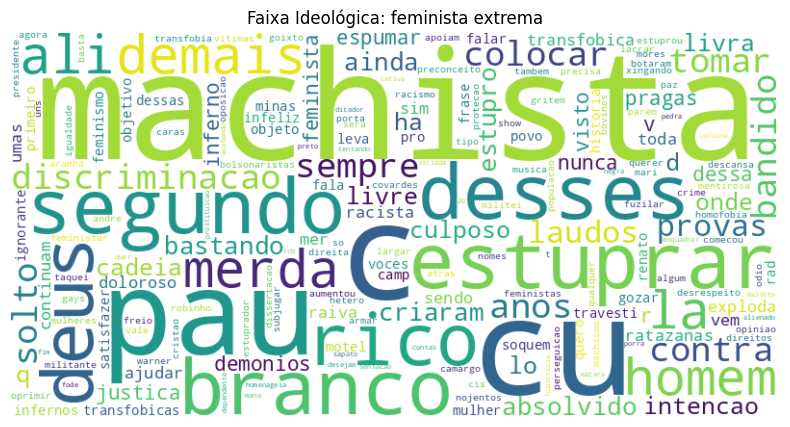

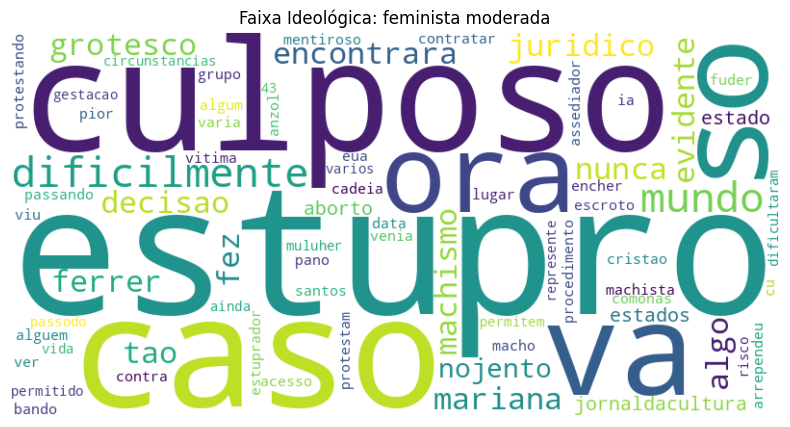

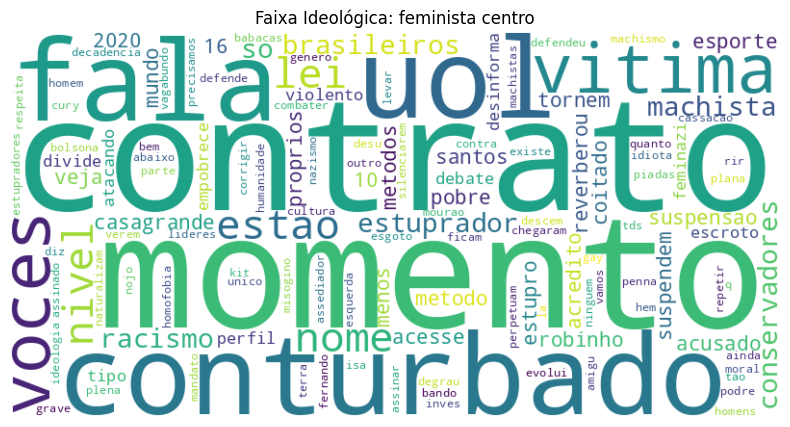

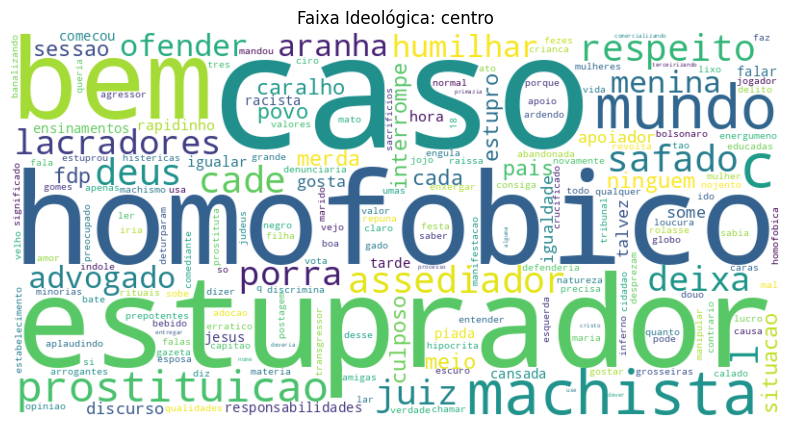

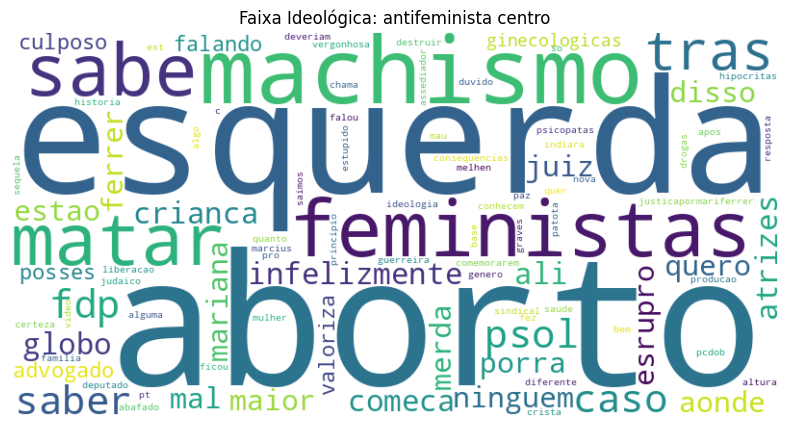

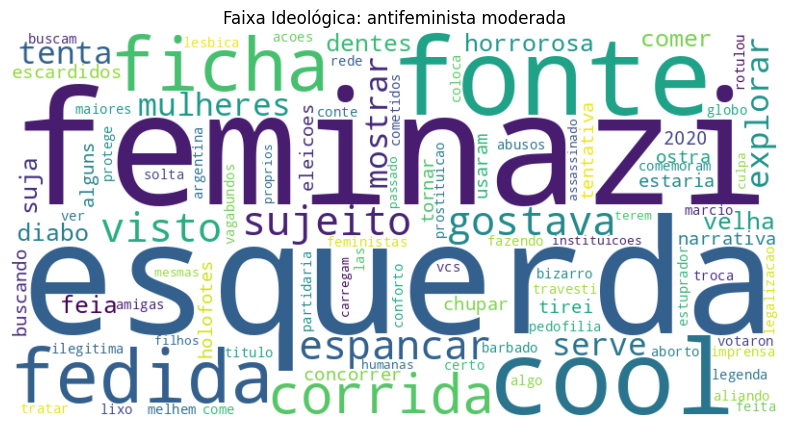

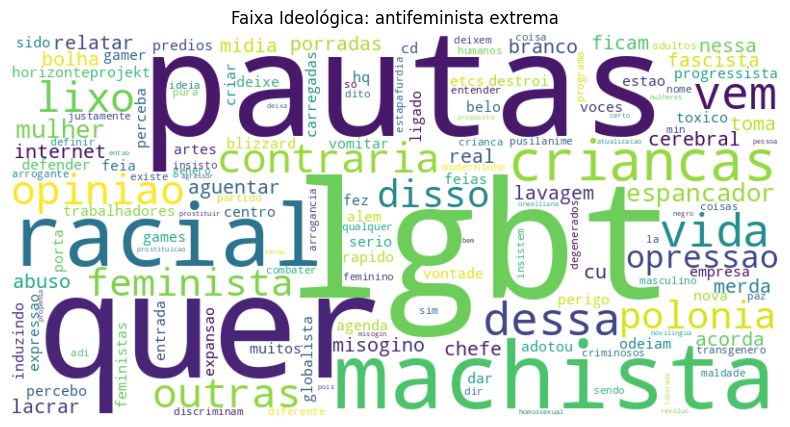

In [ ]:
# word cloud

import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
from wordcloud import WordCloud

import re
import unidecode
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('stopwords')
from nltk.corpus import stopwords

# Filtrar os tweets relacionados ao feminismo que são ofensivos
df_offensive = df_feminism[df_feminism['tweet_is_offensive'] == 1]

# Inicializa os recursos de NLP
stop_words_add = ['sobre', 'gente', 'aqui', 'hoje', 'voce', 'vc', 'ne', 
                  'pessoas', 'pra', 'ai', 'bom', 'fazer', 'dia', 
                  'ano', 'vai', 'nada', 'ter', 'vou', 'ate', 'ta', 
                  'ja', 'pq', 'assim', 'nao', 'tudo', 'sao', 'acho', 'tbm', 'sei',
                  "de", "a", "o", "e", "do", "da", "em", "um", "para", "com", "é", 
                  "não", "que", "por", "na", "os", "no", "se", "as", "dos", "como", 
                  "mas", "foi", "ao", "isso", "me", "uma", "ele", "cara", "h", "n"]
stop_words = set(stopwords.words('portuguese') + stop_words_add)

# Preprocessamento
def preprocess_tweet(tweet):
    tweet = re.sub(r'\bk+\b', '', tweet)
    tweet = re.sub(r'\bhaha+\b', '', tweet)
    tweet = re.sub(r'\s+', ' ', tweet).strip()
    tweet = re.sub(r'http\S+|@\S+|RT', '', tweet)
    tweet = re.sub(r'\W', ' ', tweet)
    tweet = tweet.lower()
    tweet = unidecode.unidecode(tweet)
    tokens = [word for word in tweet.split() if word not in stop_words]
    return ' '.join(tokens)

df_offensive['processed_tweet'] = df_offensive['tweet_text'].astype(str).apply(preprocess_tweet)

# Contar as palavras mais comuns por faixa ideológica
def contar_palavras(series):
    words = series.str.cat(sep=' ').split()
    return words

# Aplicar a contagem de palavras por faixa ideológica
palavras_comuns_por_faixa = df_offensive.groupby('user_ideology_classification')['processed_tweet'].apply(contar_palavras)
palavras_comuns_por_faixa = {key: Counter(value) for key, value in palavras_comuns_por_faixa.items()}

# Definindo a ordem desejada das faixas ideológicas
ordem_faixas = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Gerar e exibir as nuvens de palavras na ordem especificada
for faixa in ordem_faixas:
    if faixa in palavras_comuns_por_faixa:
        palavras = palavras_comuns_por_faixa[faixa]
        if palavras:  # Gera a nuvem de palavras apenas se houver palavras na faixa
            wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(palavras)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation="bilinear")
            plt.axis("off")
            plt.title(f"Faixa Ideológica: {faixa}")
            plt.show()


In [ ]:
# textos (amostra de 5 por faixa)

pd.set_option('display.max_colwidth', None)

ordem_faixas = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

df_offensive = df_offensive[~df_offensive.user_ideology_classification.isna()]

df_offensive['ideology_classification'] = pd.Categorical(
    df_offensive['user_ideology_classification'], 
    categories=ordem_faixas, 
    ordered=True
)

df_offensive_sorted = df_offensive.sort_values(by='ideology_classification')

df_print = pd.DataFrame()

for ideology in df_offensive_sorted.user_ideology_classification.dropna().unique():
    df_print = pd.concat([df_print, df_offensive_sorted[df_offensive_sorted.user_ideology_classification == ideology][['processed_tweet', 'user_ideology_classification']].drop_duplicates().head(5)])

df_print

,processed_tweet,user_ideology_classification
39153,machista mulher historia objeto satisfazer homem objetivo ali leva la pro motel gozar,feminista extrema
14573,algum cristao porta estuprador rico branco cis hetero xingando so vale perseguicao vitimas,feminista extrema
14422,tomar cu bandido branco rico sempre solto c provas laudos absolvido bastando ainda criaram estupro culposo onde ha intencao d estuprar livra lo cadeia q deus livre desses demonios justica,feminista extrema
14329,covardes botaram mari mentirosa gritem nomes desses nojentos andre camargo aranha estuprou,feminista extrema
13013,agora colocar contra racismo homofobia machismo segundo bovinos bolsonaristas querer lacrar t,feminista extrema
14584,dificilmente mundo juridico encontrara algo grotesco decisao estupro culposo caso mariana ferrer nunca machismo fez tao evidente nojento jornaldacultura,feminista moderada
14520,estupro culposo ora ora data venia va encher cu anzol,feminista moderada
3187,pior ver bando macho escroto passando pano machista arrependeu va fuder,feminista moderada
38622,mentiroso eua acesso procedimento varia estado estado comonas circunstancias permitido 43 estados so permitem aborto caso gestacao represente risco vida muluher passodo varios estados dificultaram ainda aborto,feminista moderada
7431,alguem viu algum grupo cristao protestando santos ia contratar estuprador so protestam contra vitima,feminista moderada


In [ ]:
# quem fala sobre feminismo?

# Filtrar os tweets relacionados ao feminismo
df_feminism = df[df['tweet_feminist_related'] == True]

# Contagem total de tweets por faixa ideológica
total_tweets_by_ideology = df.groupby('user_ideology_classification').size()

# Contagem de tweets feministas por faixa ideológica
feminist_tweets_by_ideology = df_feminism.groupby('user_ideology_classification').size()

# Calcular a porcentagem de tweets feministas por faixa ideológica
percentage_feminist_tweets = round((feminist_tweets_by_ideology / total_tweets_by_ideology) * 100, 2)

# Exibir o resultado
percentage_feminist_tweets = percentage_feminist_tweets.sort_index()
percentage_feminist_tweets


user_ideology_classification
antifeminista centro      1.94
antifeminista extrema     2.69
antifeminista moderada    2.59
centro                    1.00
feminista centro          2.35
feminista extrema         4.18
feminista moderada        4.06
dtype: float64

#### Opiniões

In [ ]:
# opinioes

from collections import Counter
import ast

# Extrair e contar palavras relacionadas ao feminismo por faixa ideológica
def count_feminist_words(group):
    words = Counter()
    for words_list in group['tweet_feminist_words'].dropna():
        words.update(ast.literal_eval(words_list))
    return words

feminist_words_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_feminist_words)


/tmp/ipykernel_201729/321841783.py:13: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
# Top topicos feministas

from collections import Counter
import ast
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Extrair e contar palavras relacionadas ao feminismo por faixa ideológica
def count_feminist_words(group):
    words = Counter()
    for words_list in group['tweet_feminist_words'].dropna():
        words.update(ast.literal_eval(words_list))
    return words

# Obter a contagem das palavras por faixa ideológica
feminist_words_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_feminist_words)

# Transformar a contagem em um formato que possa ser usado para visualização
common_words = {ideology: counts.most_common(8) for ideology, counts in feminist_words_by_ideology.items()}

# Transformar o dicionário em um DataFrame
rows = []
for ideology, words in common_words.items():
    for word, freq in words:
        rows.append({'ideology': ideology, 'word': word, 'frequency': freq})

df_visualization = pd.DataFrame(rows)

# Definir a ordem das ideologias (da mais feminista para a mais antifeminista)
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Reordenar o DataFrame de visualização com base nessa ordem
df_visualization['ideology'] = pd.Categorical(df_visualization['ideology'], categories=ordered_ideologies, ordered=True)
df_visualization = df_visualization.sort_values('ideology')

# Criar subplots com 3 colunas e ajustar o número de linhas dinamicamente
num_ideologies = len(ordered_ideologies)
rows = (num_ideologies // 3) + (1 if num_ideologies % 3 != 0 else 0)

fig = make_subplots(rows=rows, cols=3, subplot_titles=ordered_ideologies, vertical_spacing=0.3)

# Adicionar um lollipop chart para cada ideologia, ordenando as palavras por frequência decrescente
for i, ideology in enumerate(ordered_ideologies):
    subset = df_visualization[df_visualization['ideology'] == ideology].sort_values(by='frequency', ascending=False)
    row = i // 3 + 1
    col = i % 3 + 1
    fig.add_trace(
        go.Scatter(x=subset['word'], y=subset['frequency'],
                   mode='markers+lines',
                   line=dict(color='gray', width=1),
                   marker=dict(color='blue', size=8),
                   name=ideology),
        row=row, col=col
    )

# Atualizar layout do gráfico e definir limites dos eixos Y
fig.update_layout(
    height=rows * 250, width=1200,
    title_text="Top 5 Palavras por Faixa Ideológica",
    showlegend=False
)

# Definir os limites dos eixos Y para todos os subplots
fig.update_yaxes(range=[-1, 200], title_text="Frequência")
fig.update_xaxes(title_text="Palavras")

# Mostrar o gráfico
fig.show()


/tmp/ipykernel_201729/3325865057.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



/tmp/ipykernel_201729/1318910535.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_201729/1318910535.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



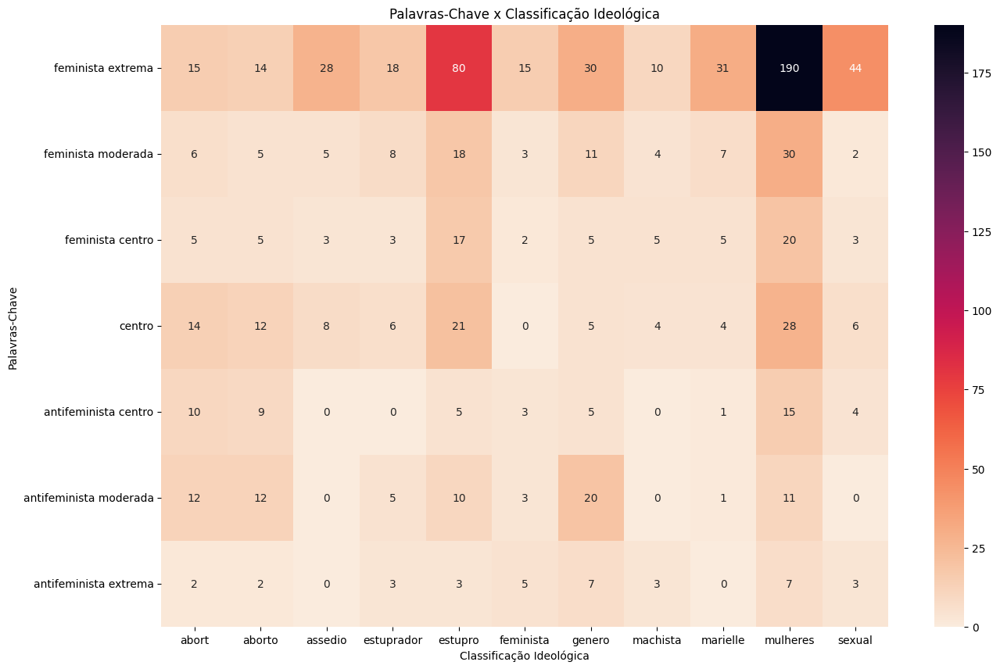

In [ ]:
# Contagem de palavras

from sklearn.feature_extraction.text import CountVectorizer
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Ordem das ideologias
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

df_feminism['tweet_text_clean'] = df_feminism.tweet_text.apply(preprocess_tweet)
df_feminism['tweet_feminist_words_clean'] = df_feminism['tweet_feminist_words'].astype(str).str.replace('[', '').str.replace(']', '').str.replace("'", '').str.replace(',', '')

# Passo 1: Vetorizar as palavras-chave
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_feminism['tweet_feminist_words_clean'].fillna(''))

# Passo 2: Criar um DataFrame das palavras-chave com as ideologias como índice
keywords_df = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out(), index=df_feminism['user_ideology_classification'])

# Passo 3: Agrupar as frequências das palavras-chave por ideologia
keywords_by_ideology = keywords_df.groupby('user_ideology_classification').sum()

# Passo 4: Reordenar o DataFrame de acordo com a ordem das ideologias
keywords_by_ideology = keywords_by_ideology.reindex(ordered_ideologies)

# Passo 5: Filtrar palavras-chave que aparecem em pelo menos um determinado número de registros
min_occurrence = 4
keywords_filtered = keywords_by_ideology.loc[:, (keywords_by_ideology > 2).sum(axis=0) >= min_occurrence]

# Verificar se a matriz não está vazia antes de criar o heatmap
if not keywords_filtered.empty:
    # Passo 6: Criar um heatmap para visualizar a distribuição das palavras-chave por ideologia
    plt.figure(figsize=(15, 10))
    sns.heatmap(keywords_filtered, cmap="rocket_r", annot=True, fmt="d")
    plt.title("Palavras-Chave x Classificação Ideológica")
    plt.xlabel("Classificação Ideológica")
    plt.ylabel("Palavras-Chave")
    plt.show()
else:
    print("Nenhuma palavra-chave suficiente para criar o heatmap após a filtragem.")


/tmp/ipykernel_201729/1479381620.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_201729/1479381620.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



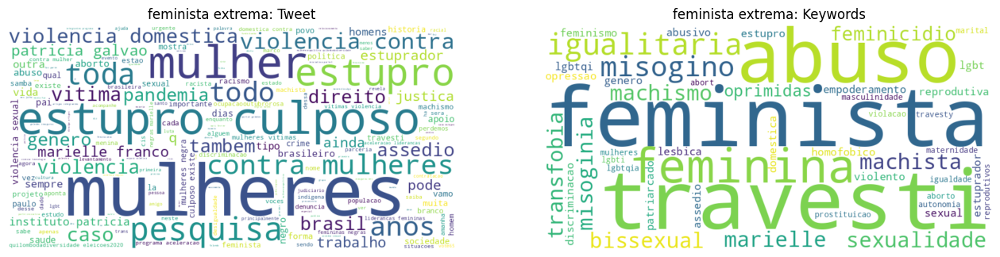

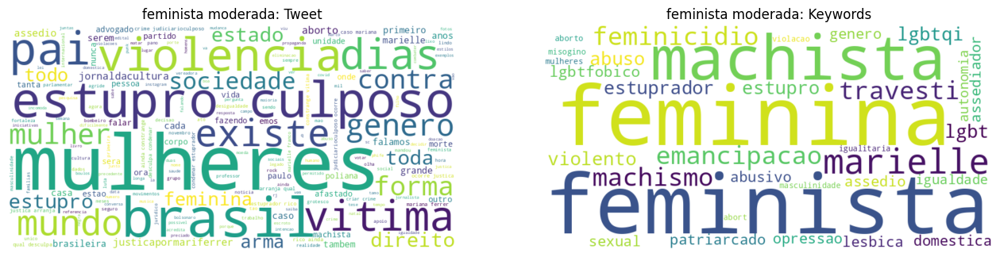

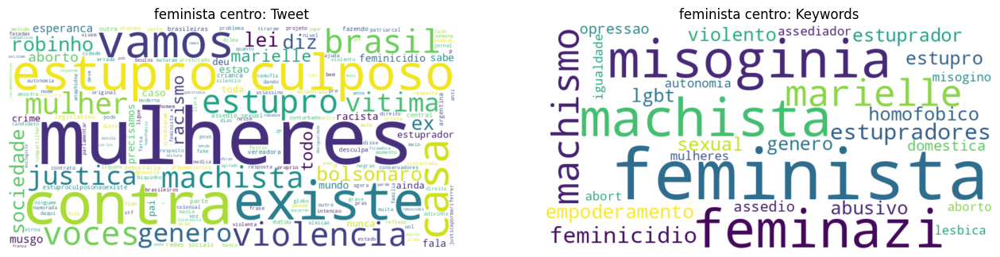

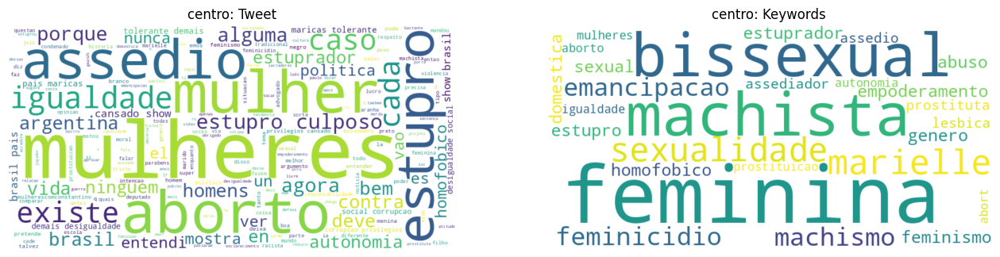

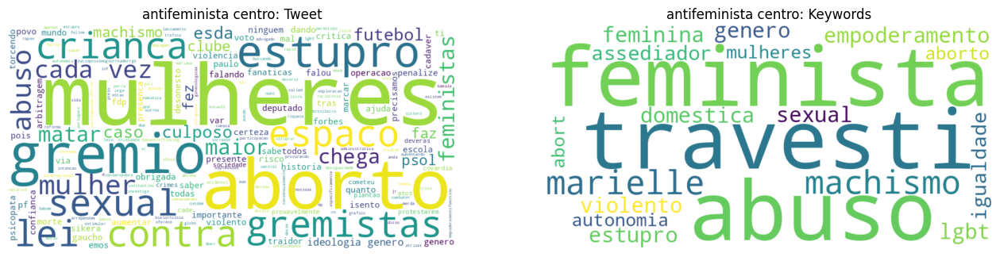

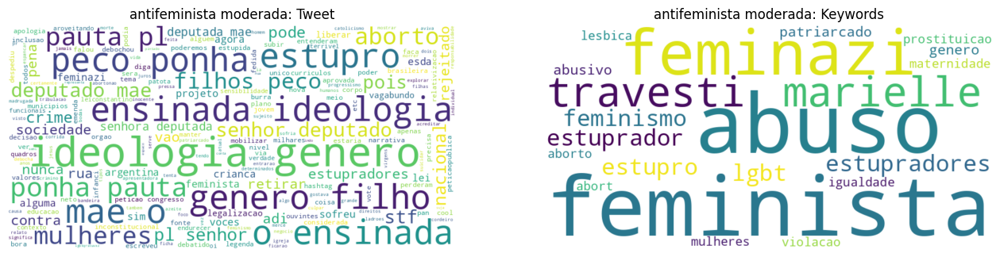

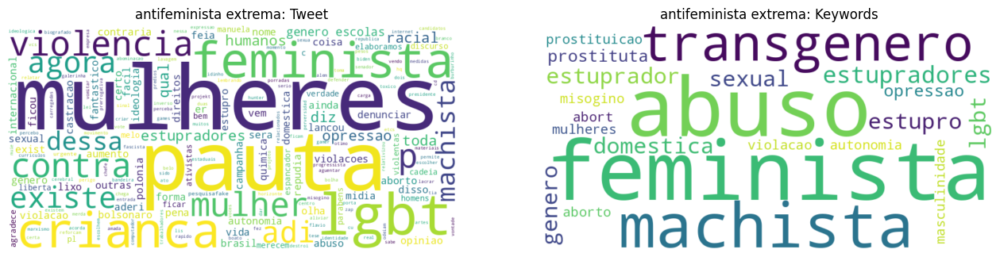

In [ ]:
# Word Cloud: Tweet x Keywords

df_feminism['tweet_text_clean'] = df_feminism.tweet_text.apply(preprocess_tweet)
df_feminism['tweet_feminist_words_clean'] = df_feminism['tweet_feminist_words'].astype(str).str.replace('[', '').str.replace(']', '').str.replace("'", '').str.replace(',', '')


from wordcloud import WordCloud
import matplotlib.pyplot as plt
import ast
import pandas as pd

# Função para gerar uma nuvem de palavras a partir de uma lista de palavras
def generate_wordcloud_from_list(words_list, ax, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(words_list))
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Função para gerar uma nuvem de palavras a partir de um texto completo
def generate_wordcloud_from_text(text, ax, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(title)

# Definir a ordem das ideologias (da mais feminista para a mais antifeminista)
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Filtrando os dados por faixa ideológica e gerando as nuvens de palavras
for ideology in ordered_ideologies:
    # Filtrar os tweets pela ideologia atual
    df_subset = df_feminism[df_feminism['user_ideology_classification'] == ideology]
    
    # Nuvem de palavras para as keywords (tweet_feminist_words)
    keywords_list = []
    for words in df_subset['tweet_feminist_words'].dropna():
        keywords = ast.literal_eval(words)
        # Normalizar palavras: remover espaços, converter para minúsculas, e remover duplicatas
        keywords_normalized = [word.strip().lower() for word in keywords]
        keywords_list.extend(keywords_normalized)
    
    # Remover duplicatas na lista final
    keywords_list = list(set(keywords_list))
    
    if keywords_list:
        fig, axs = plt.subplots(1, 2, figsize=(16, 8))
        
        # Nuvem de palavras para o texto completo do tweet (tweet_text_clean)
        generate_wordcloud_from_text(" ".join(df_subset['tweet_text_clean'].str.replace('quer', '').dropna()), axs[0], f'{ideology}: Tweet')
        
        # Nuvem de palavras para as keywords
        generate_wordcloud_from_list(keywords_list, axs[1], f'{ideology}: Keywords')

        plt.show()


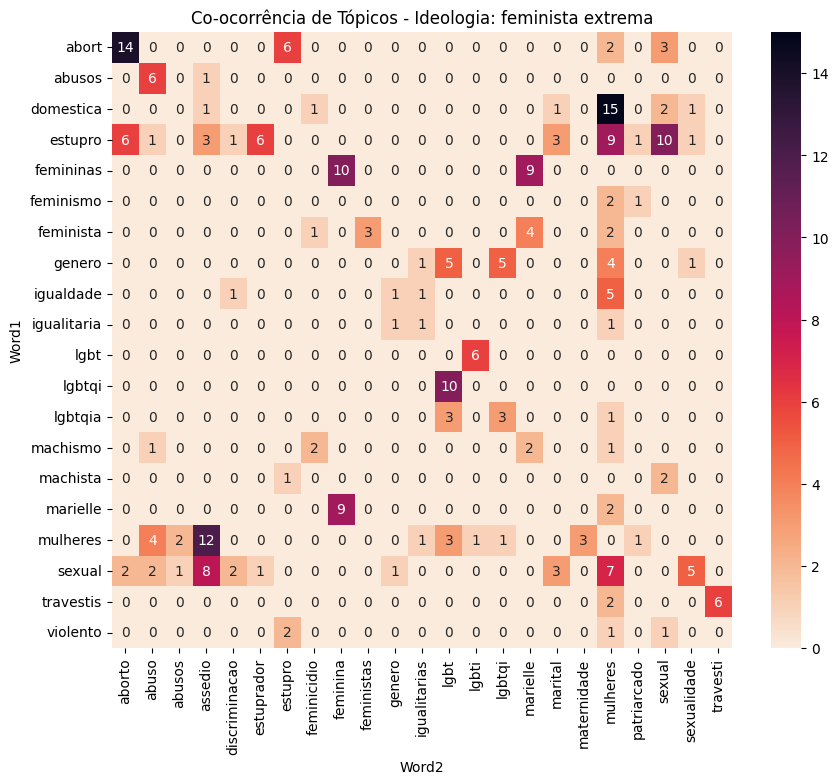

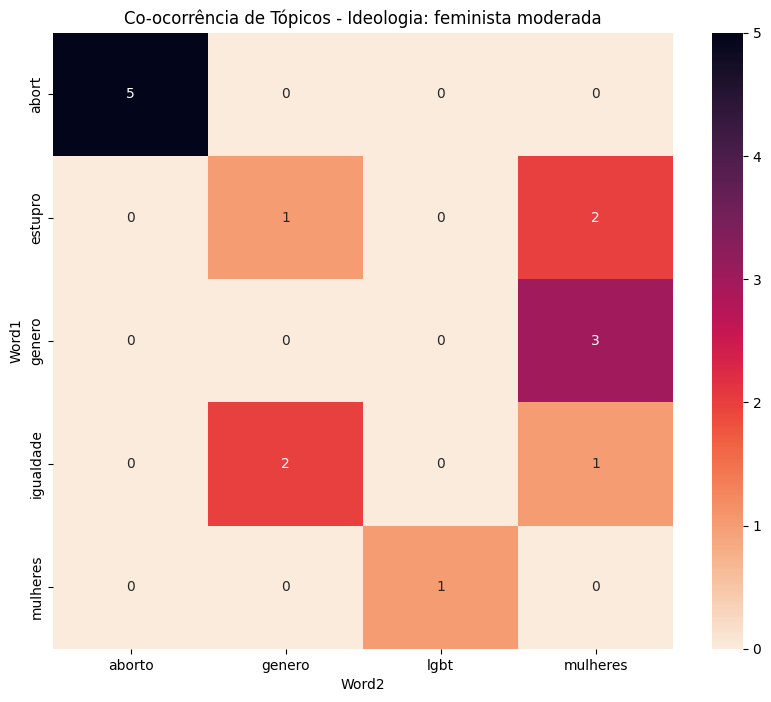

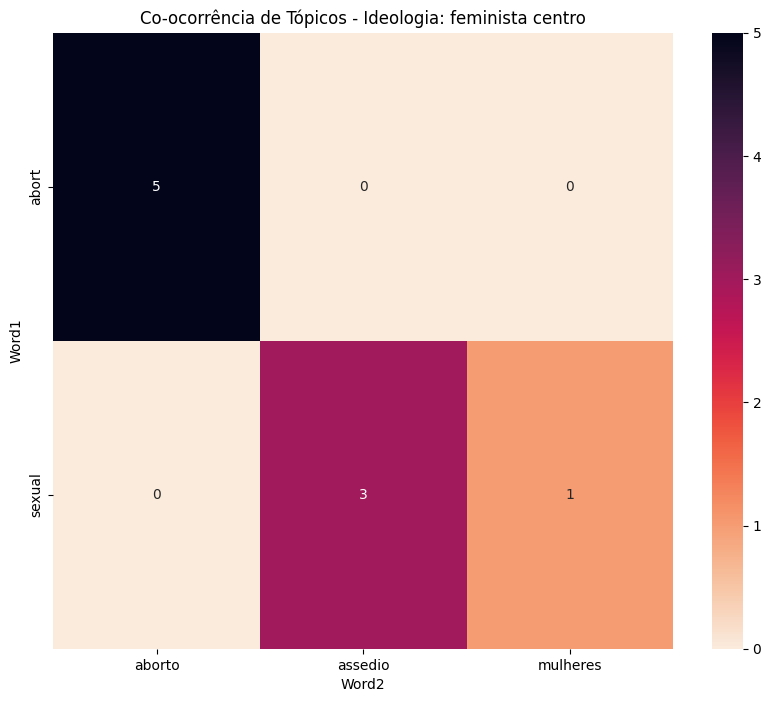

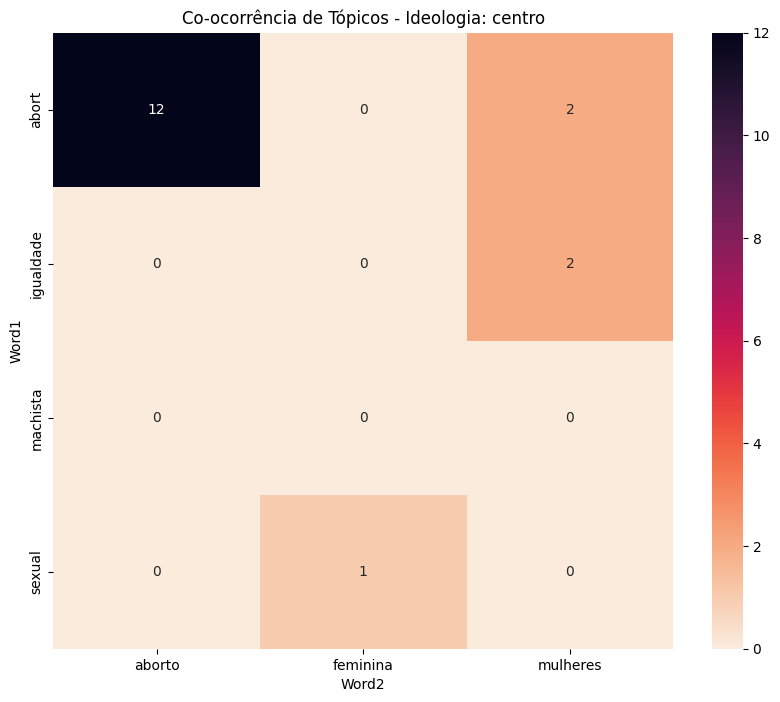

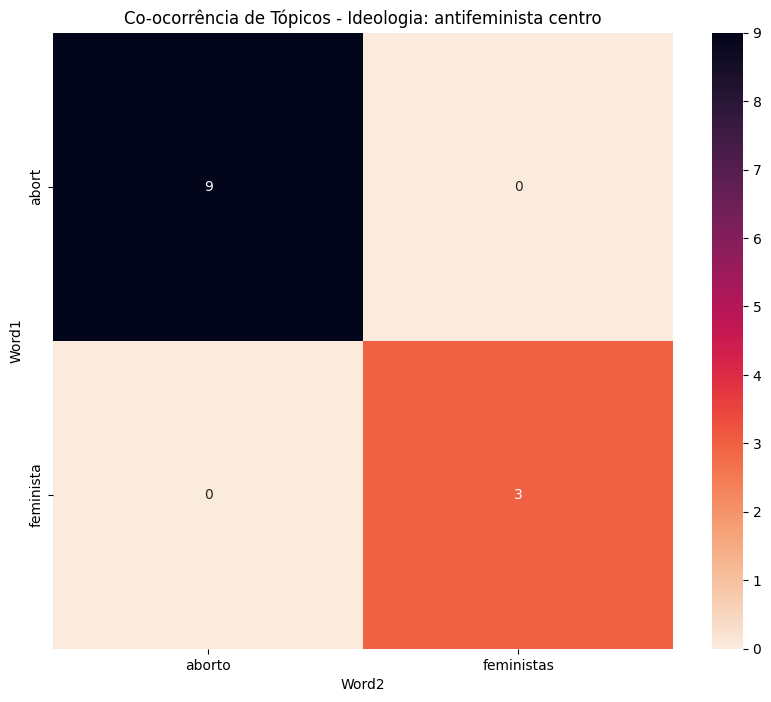

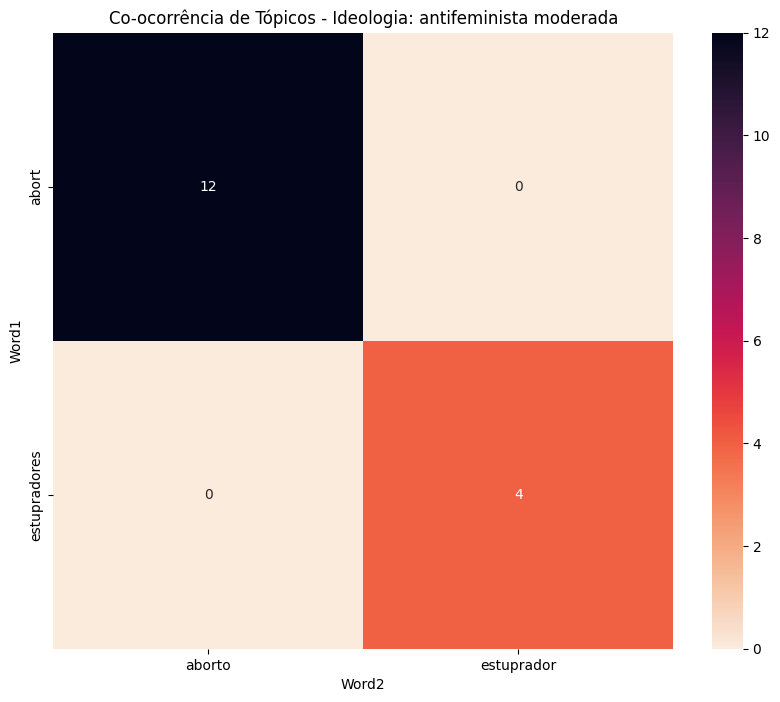

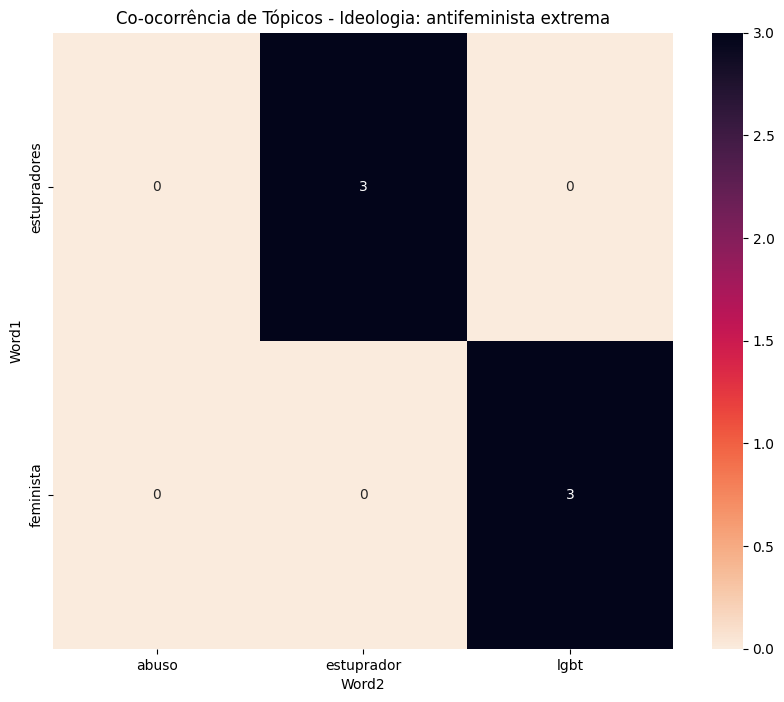

In [ ]:
# Correlação entre tópicos

from itertools import combinations
from collections import Counter
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Função ajustada para converter strings em listas de palavras
def process_feminist_words(val):
    if isinstance(val, str):
        return val.split()  # Dividindo a string em uma lista de palavras
    return []

# Função para calcular co-ocorrência de palavras em uma lista de palavras
def compute_co_occurrence(words_list):
    co_occurrence_counts = Counter()
    for words in words_list:
        if len(words) > 1:
            for pair in combinations(words, 2):
                co_occurrence_counts[frozenset(pair)] += 1
    return co_occurrence_counts

# Criando dicionário para armazenar as co-ocorrências por faixa ideológica
co_occurrence_by_ideology = {}

# Definindo a ordem das ideologias
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Processando co-ocorrências para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    group = df_feminism[df_feminism['user_ideology_classification'] == ideology]
    words_list = group['tweet_feminist_words_clean'].dropna().apply(process_feminist_words)
    words_list = words_list.dropna().tolist()  # Filtrando apenas as listas válidas
    co_occurrence_by_ideology[ideology] = compute_co_occurrence(words_list)

# Transformando o dicionário de co-ocorrências em dataframes
co_occurrence_dfs = {}
for ideology, co_occurrence in co_occurrence_by_ideology.items():
    if co_occurrence:  # Verifica se existem co-ocorrências
        co_occurrence_df = pd.DataFrame(
            [(list(pair)[0], list(pair)[1], count) for pair, count in co_occurrence.items()],
            columns=['Word1', 'Word2', 'Count']
        )
        co_occurrence_df = co_occurrence_df.pivot(index='Word1', columns='Word2', values='Count').fillna(0)

        # Filtrando palavras que têm pelo menos 2 co-ocorrências
        co_occurrence_df = co_occurrence_df.loc[(co_occurrence_df.sum(axis=1) > 2), (co_occurrence_df.sum(axis=0) > 2)]

        co_occurrence_dfs[ideology] = co_occurrence_df

# Visualizando a co-ocorrência para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in co_occurrence_dfs and not co_occurrence_dfs[ideology].empty:
        plt.figure(figsize=(10, 8))
        sns.heatmap(co_occurrence_dfs[ideology], annot=True, cmap='rocket_r')
        plt.title(f"Co-ocorrência de Tópicos - Ideologia: {ideology}")
        plt.show()
    else:
        print(f"Sem dados suficientes para gerar heatmap para a ideologia: {ideology}")


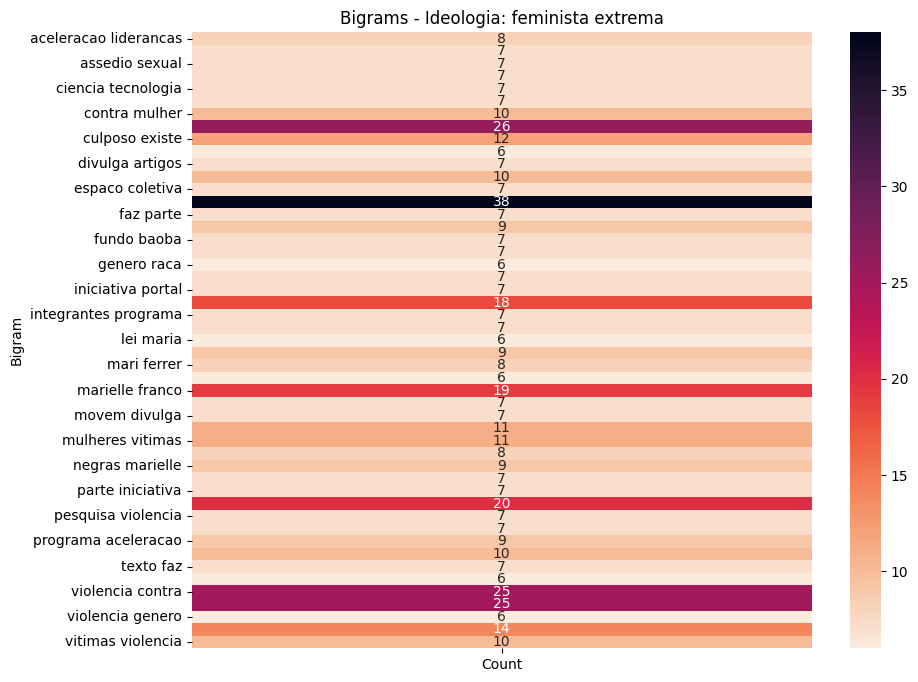

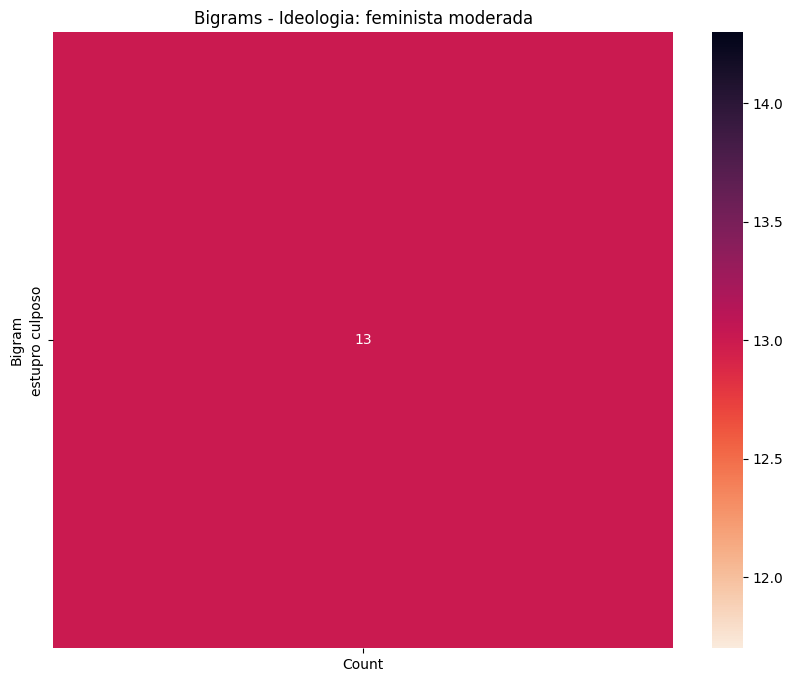

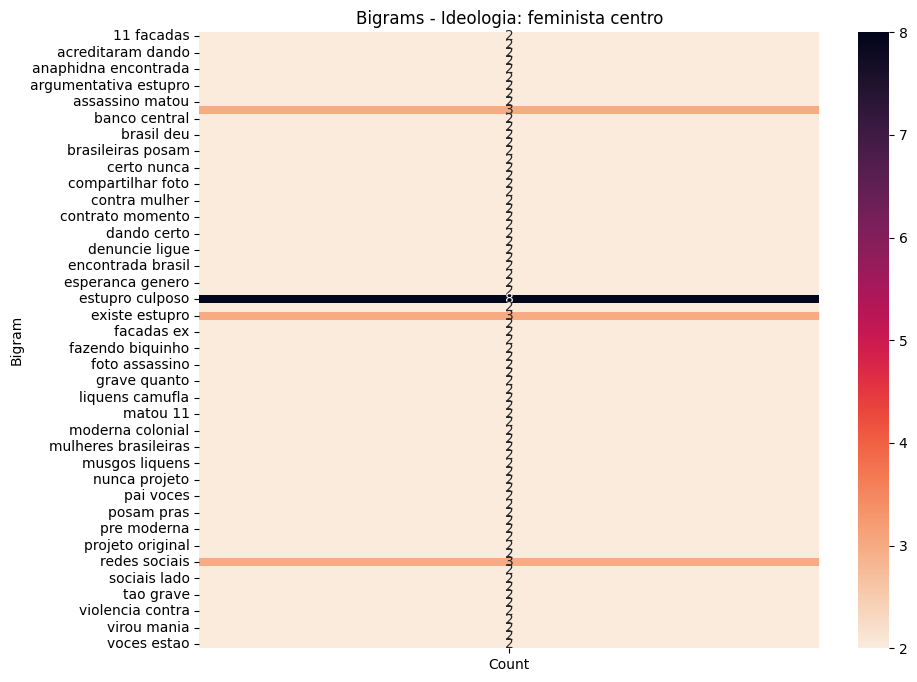

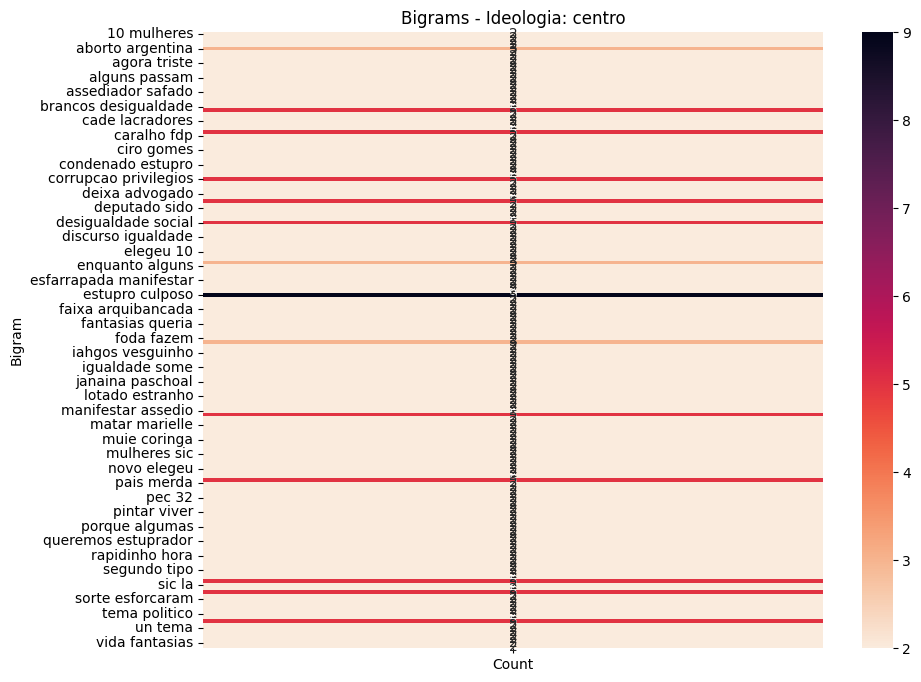

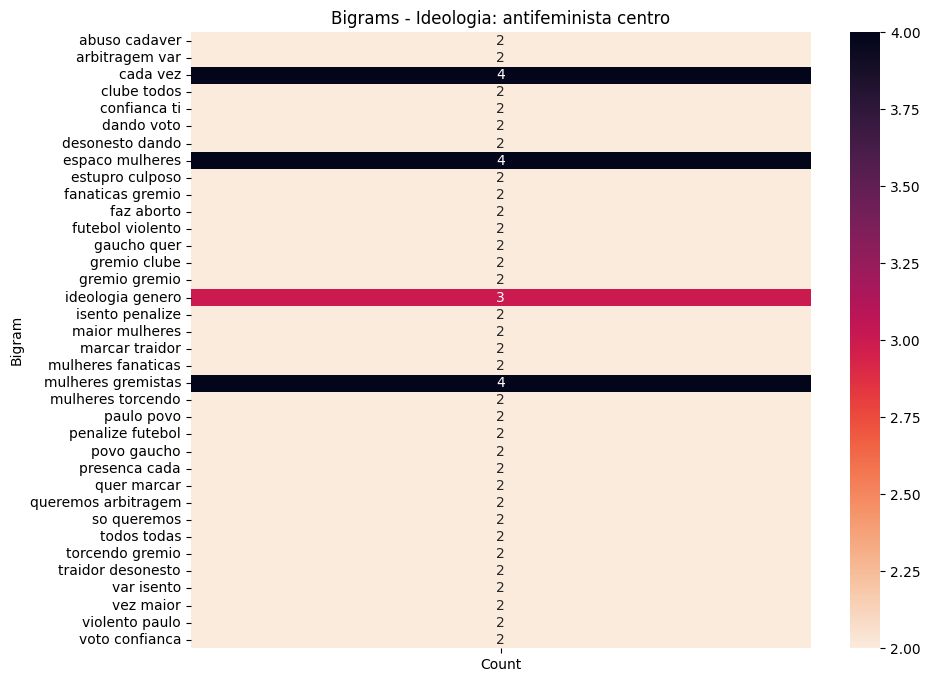

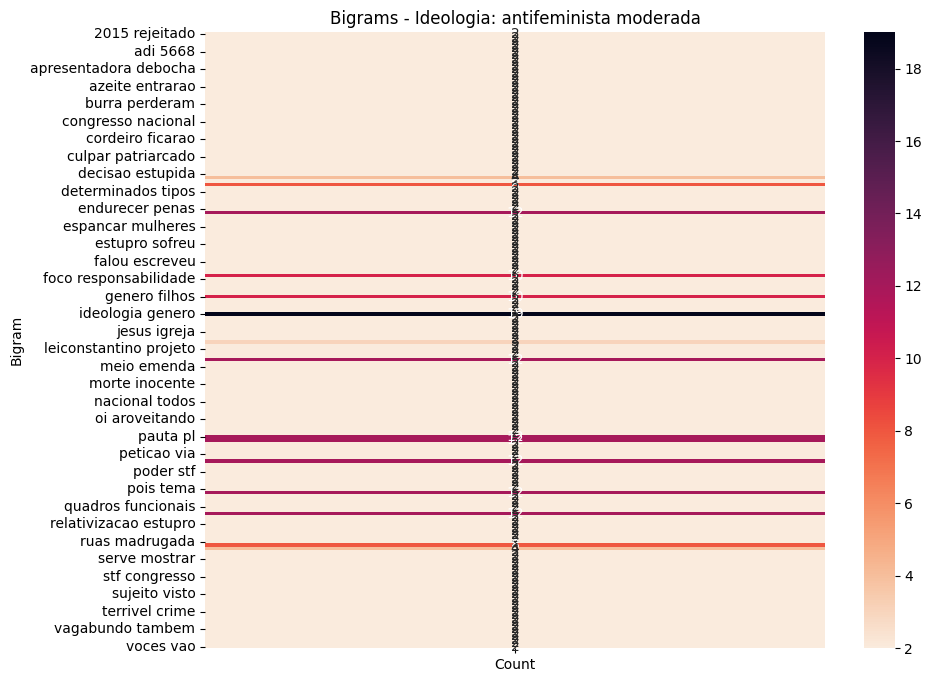

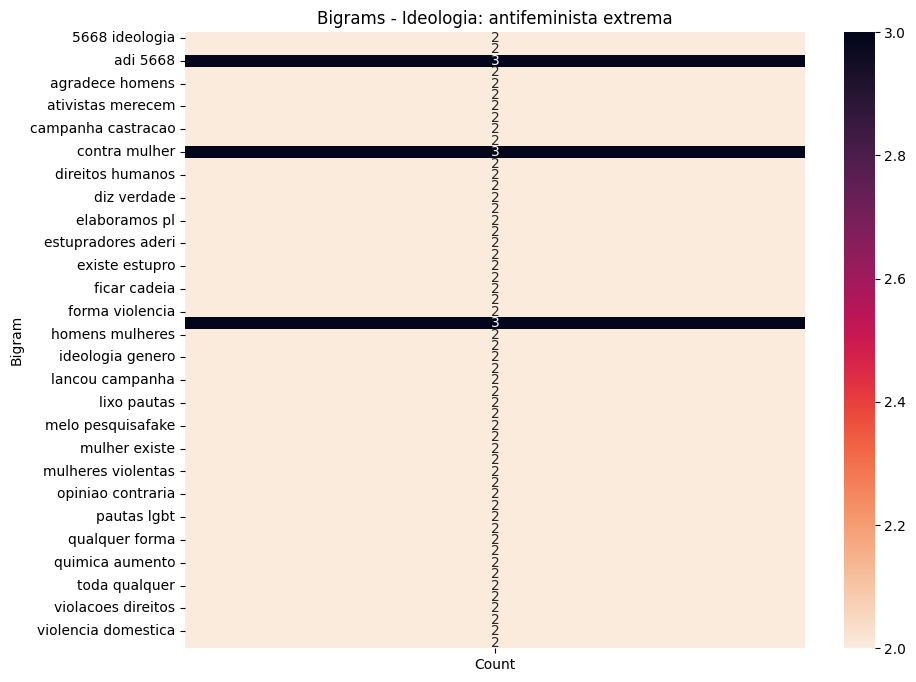

In [ ]:
# Correlação entre palavras do tweet (completo)

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

# Função para gerar bigrams a partir de textos
def generate_bigrams(text):
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words=None)
    X = vectorizer.fit_transform(text)
    bigrams = vectorizer.get_feature_names_out()
    bigram_counts = X.toarray().sum(axis=0)
    return dict(zip(bigrams, bigram_counts))

# Criando dicionário para armazenar os bigrams por faixa ideológica
bigrams_by_ideology = {}

# Definindo a ordem das ideologias
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Processando bigrams para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    group = df_feminism[df_feminism['user_ideology_classification'] == ideology]
    text_data = group['tweet_text_clean'].dropna().tolist()
    bigrams_by_ideology[ideology] = generate_bigrams(text_data)

# Transformando o dicionário de bigrams em dataframes
bigram_dfs = {}
for ideology, bigrams in bigrams_by_ideology.items():
    bigram_df = pd.DataFrame(list(bigrams.items()), columns=['Bigram', 'Count'])
    if ideology in ['feminista extrema', 'feminista moderada']:
        bigram_df = bigram_df[bigram_df['Count'] > 5]
    else:
        bigram_df = bigram_df[bigram_df['Count'] > 1]
    if not bigram_df.empty:
        bigram_dfs[ideology] = bigram_df.set_index('Bigram')

# Visualizando os bigrams para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in bigram_dfs and not bigram_dfs[ideology].empty:
        plt.figure(figsize=(10, 8))
        sns.heatmap(bigram_dfs[ideology], annot=True, cmap='rocket_r', fmt="d")
        plt.title(f"Bigrams - Ideologia: {ideology}")
        plt.show()
    else:
        print(f"Sem dados suficientes para gerar heatmap para a ideologia: {ideology}")


#### Hashtags

/tmp/ipykernel_201729/380011051.py:17: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



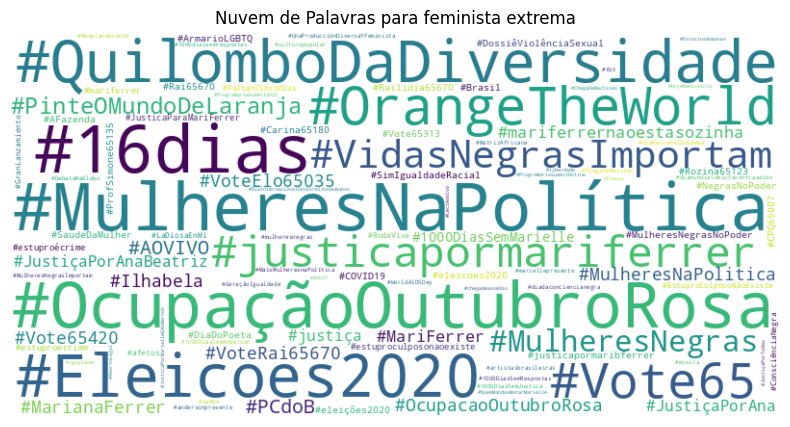

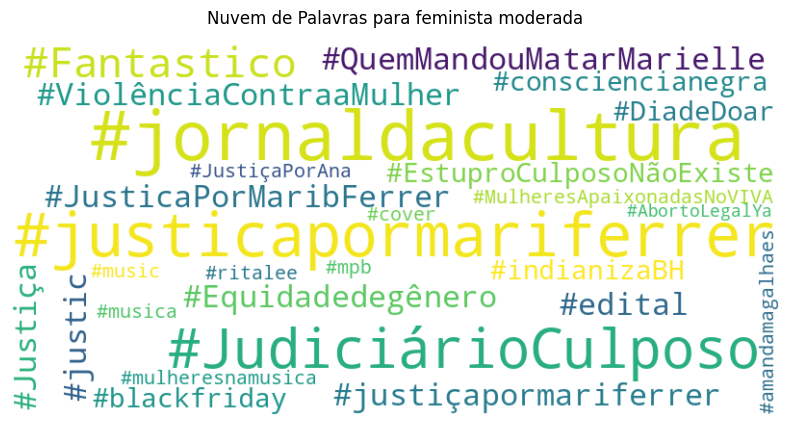

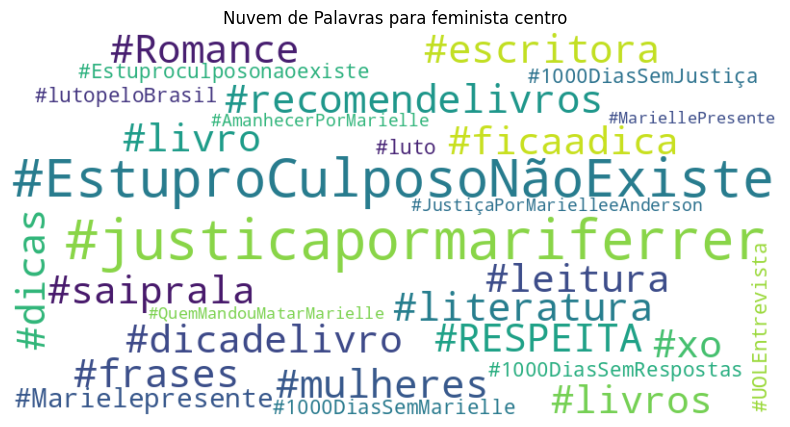

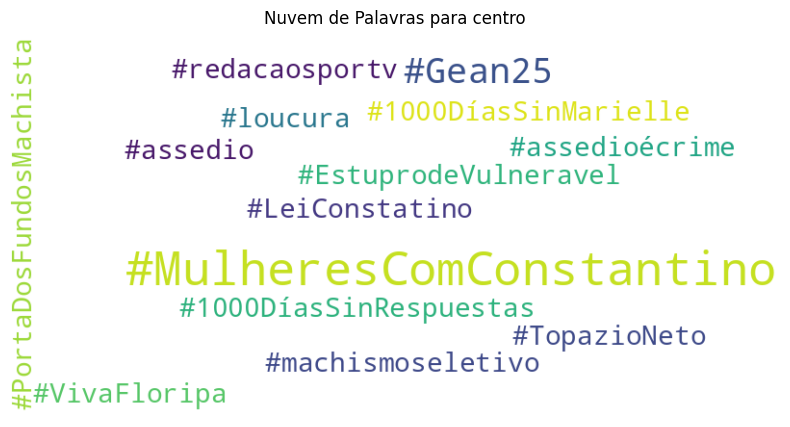

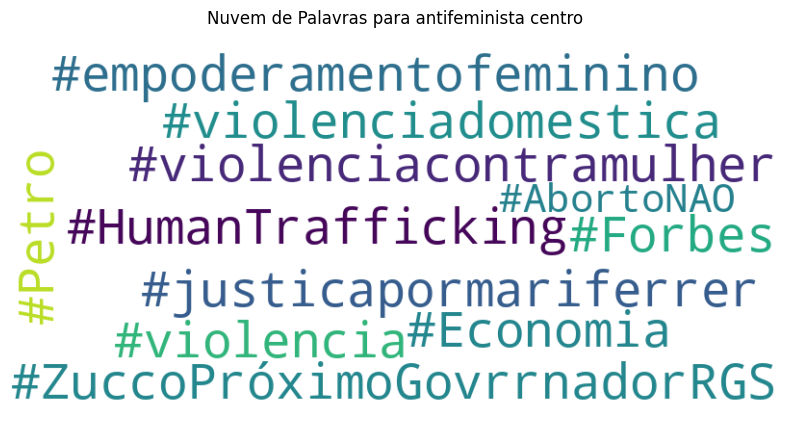

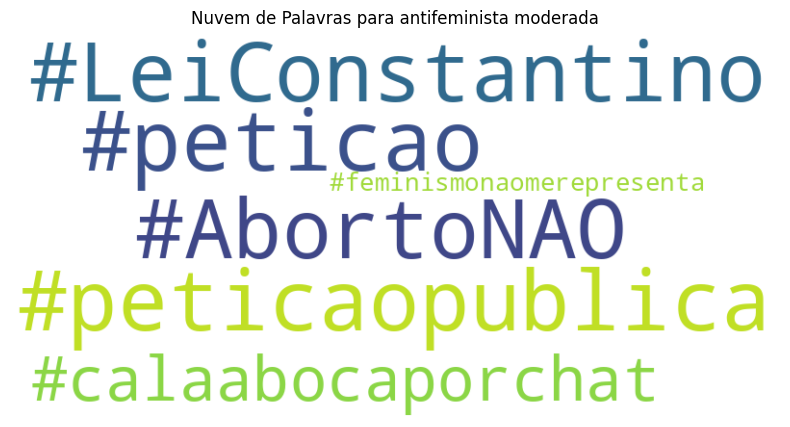

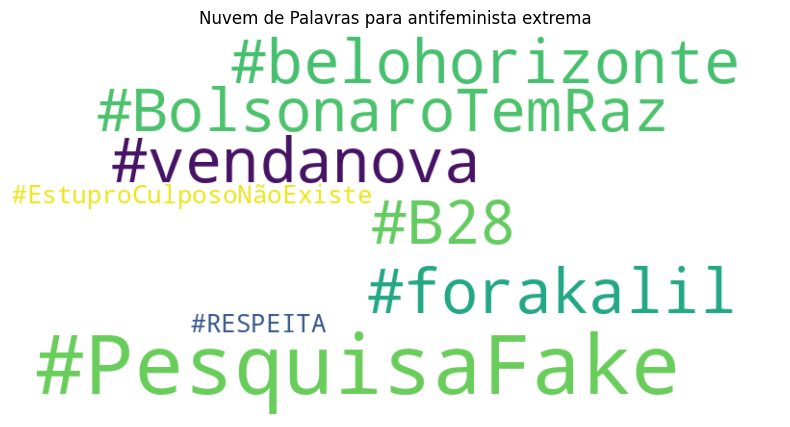

In [ ]:
# Word Cloud

from collections import Counter
import ast

# Função para contar hashtags por faixa ideológica
def count_hashtags(group):
    hashtags = Counter()
    for hashtags_list in group['tweet_hashtags'].dropna():
        # Verifica se a string não está vazia e se é uma string, então faz a conversão
        if isinstance(hashtags_list, str) and hashtags_list != '[]':
            hashtags.update(ast.literal_eval(hashtags_list))
        elif isinstance(hashtags_list, list):
            hashtags.update(hashtags_list)
    return hashtags

hashtags_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_hashtags)

# Exibindo os resultados
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Ordem das ideologias conforme solicitado
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Gerando nuvens de palavras para cada faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in hashtags_by_ideology:
        hashtags = hashtags_by_ideology[ideology]
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(hashtags)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Nuvem de Palavras para {ideology}')
        plt.axis('off')
        plt.show()


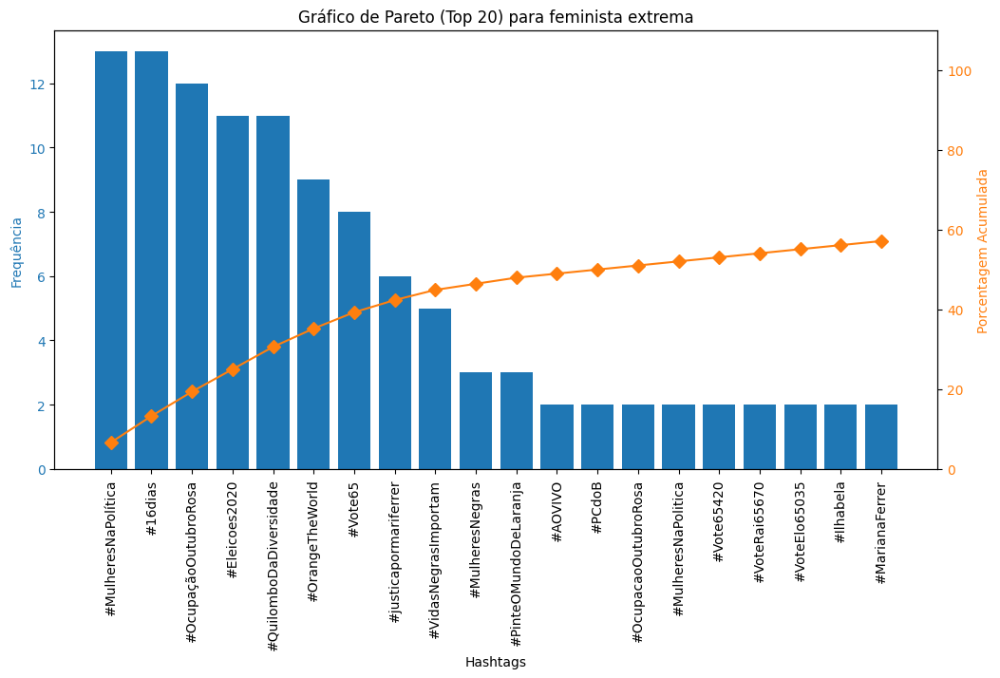

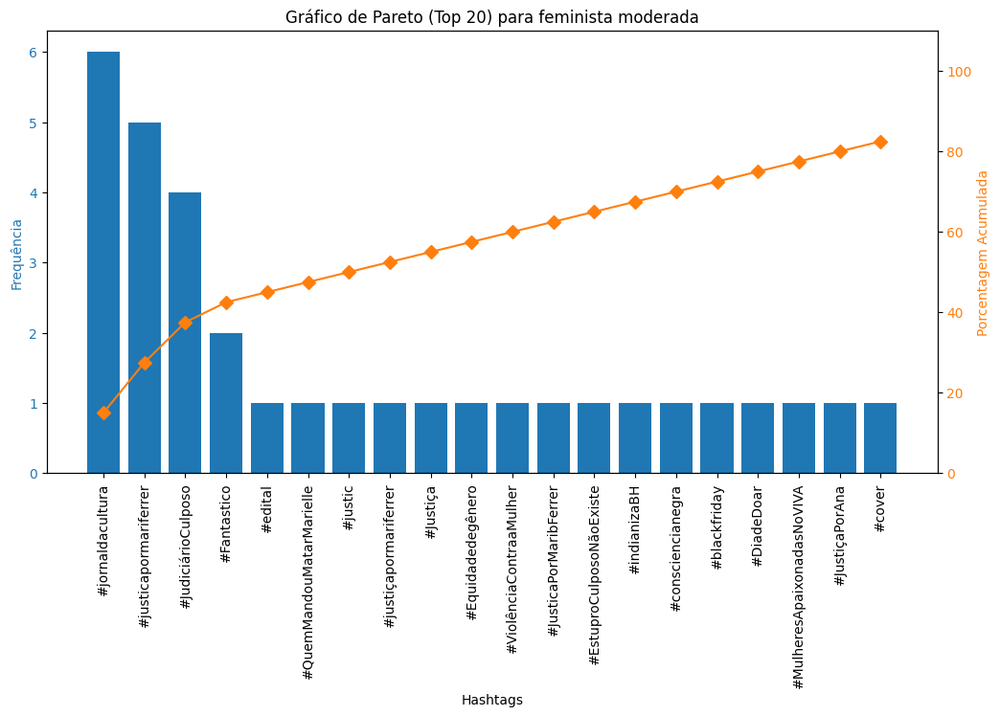

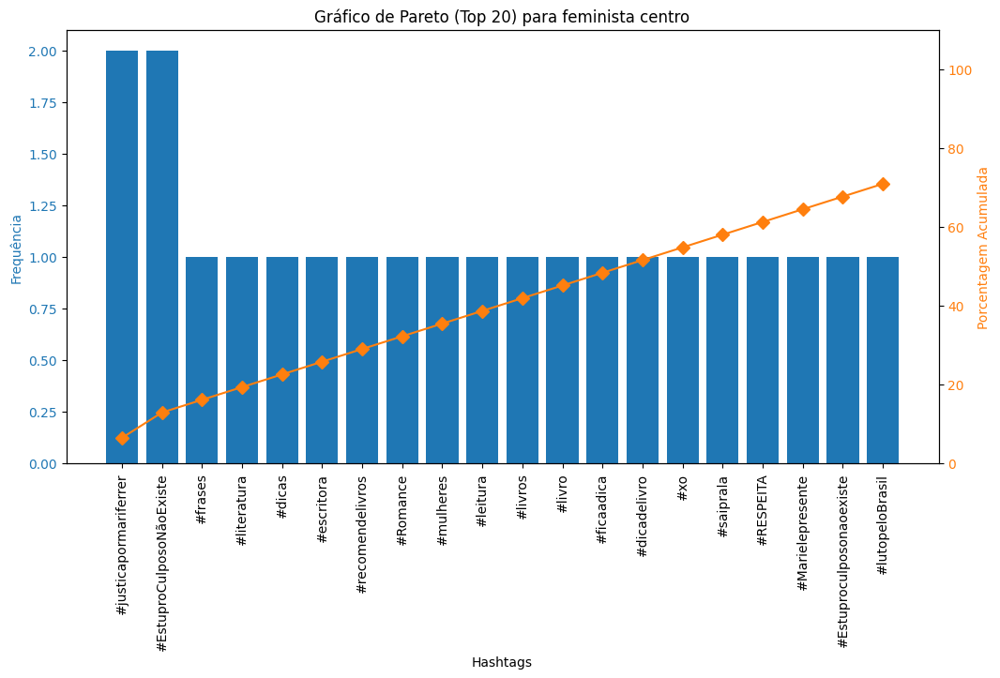

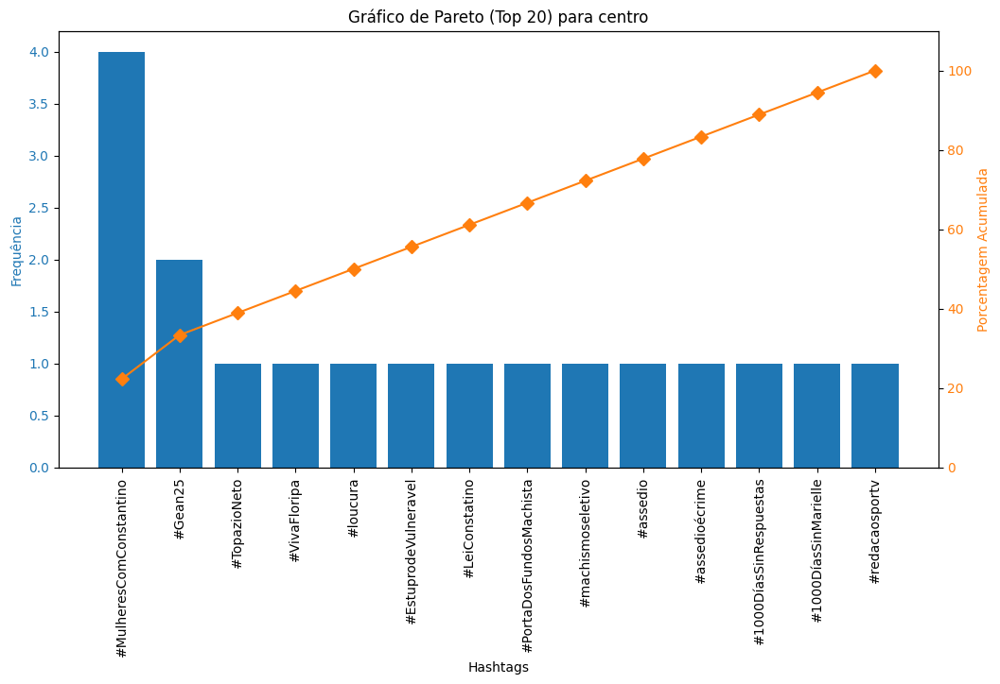

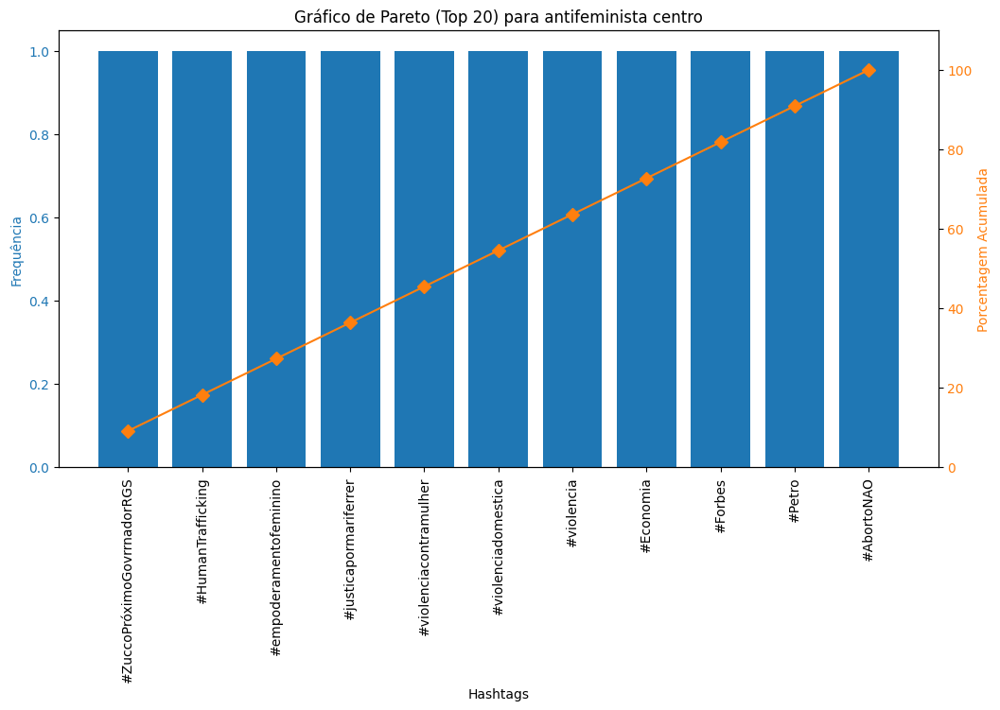

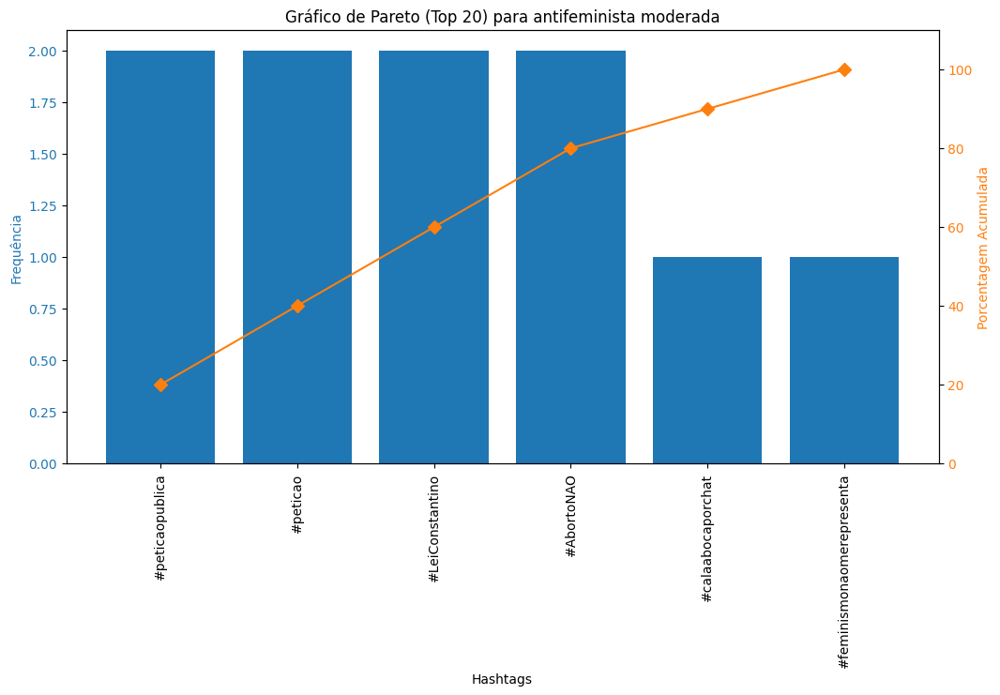

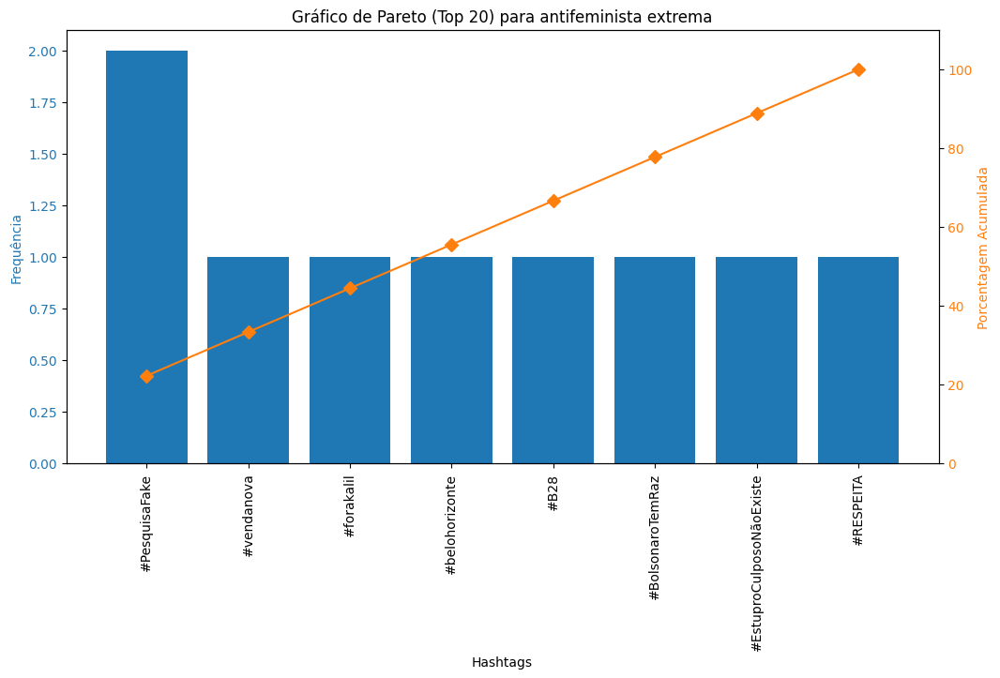

In [ ]:
# Pareto Hashtags

import matplotlib.pyplot as plt

# Gerando gráfico de Pareto para cada faixa ideológica na ordem especificada, mostrando apenas o top 10
for ideology in ordered_ideologies:
    if ideology in hashtags_by_ideology:
        hashtags = hashtags_by_ideology[ideology]
        total_counts = sum(hashtags.values())  # Somando todas as hashtags, não apenas as top 10
        
        hashtags_sorted = hashtags.most_common(20)  # Mostrando apenas as top 10 hashtags
        
        if hashtags_sorted:
            labels, counts = zip(*hashtags_sorted)
            
            # Calculando a porcentagem acumulada considerando o total
            cum_percentage = [sum(counts[:i+1])/total_counts * 100 for i in range(len(counts))]
            
            # Plotando o gráfico de Pareto
            fig, ax1 = plt.subplots(figsize=(12, 6))

            ax1.bar(labels, counts, color='C0')
            ax1.set_xlabel('Hashtags')
            ax1.set_ylabel('Frequência', color='C0')
            ax1.tick_params(axis='y', labelcolor='C0')
            plt.xticks(rotation=90)

            ax2 = ax1.twinx()
            ax2.plot(labels, cum_percentage, color='C1', marker='D', ms=7)
            ax2.set_ylabel('Porcentagem Acumulada', color='C1')
            ax2.tick_params(axis='y', labelcolor='C1')
            ax2.set_ylim([0, 110])

            plt.title(f'Gráfico de Pareto (Top 20) para {ideology}')
            plt.show()


#### Menções

In [ ]:
# @s

from collections import Counter
import ast

# Função para contar menções por faixa ideológica
def count_mentions(group):
    mentions = Counter()
    for mentions_list in group['tweet_mentions'].dropna():
        # Verifica se a string não está vazia e se é uma string, então faz a conversão
        if isinstance(mentions_list, str) and mentions_list != '[]':
            mentions.update(ast.literal_eval(mentions_list))
        elif isinstance(mentions_list, list):
            mentions.update(mentions_list)
    return mentions

# Agrupando por faixa ideológica e contando as menções
mentions_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_mentions)


/tmp/ipykernel_201729/4018206354.py:18: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



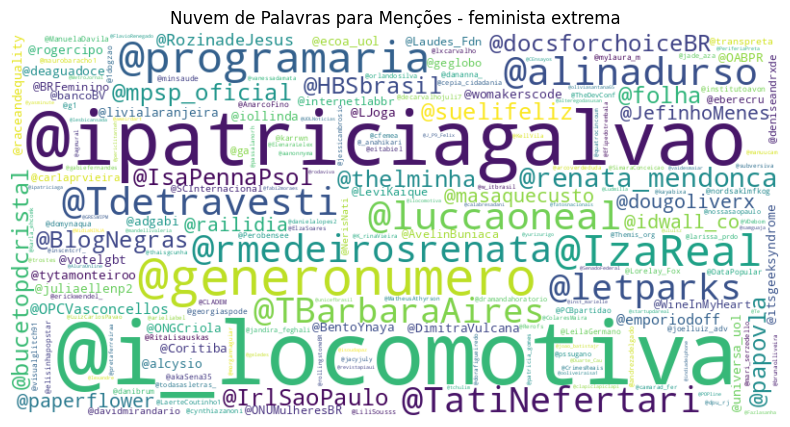

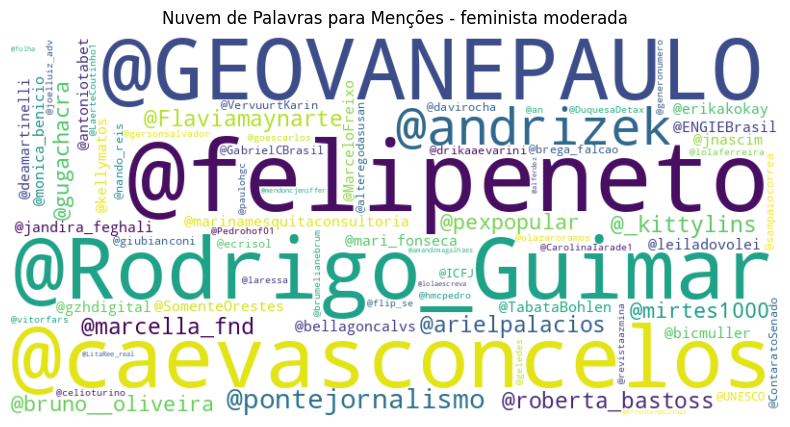

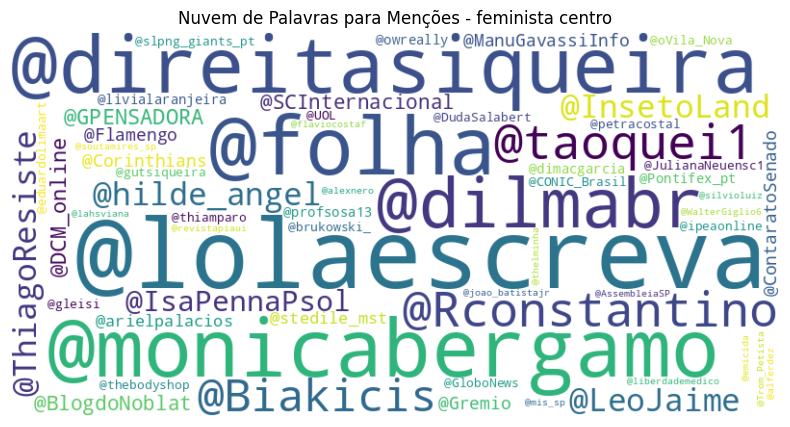

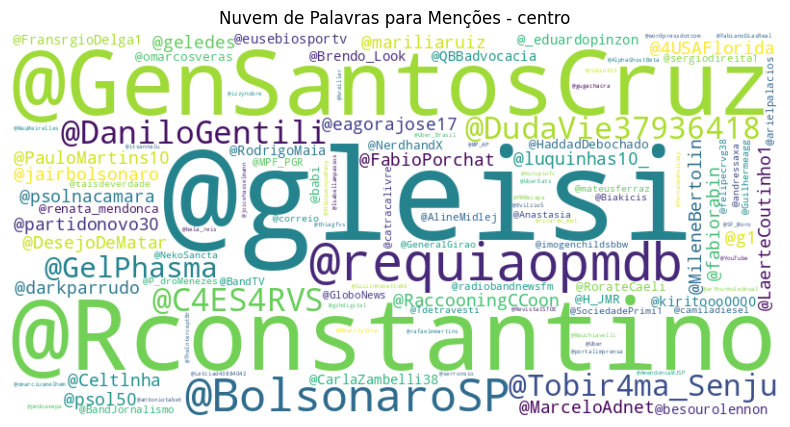

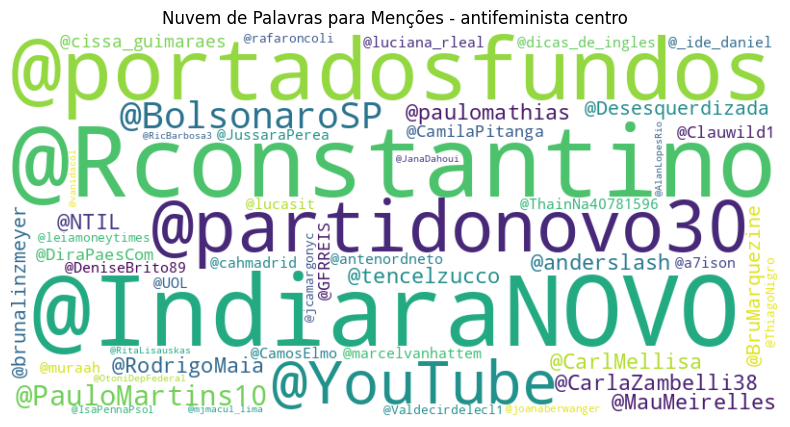

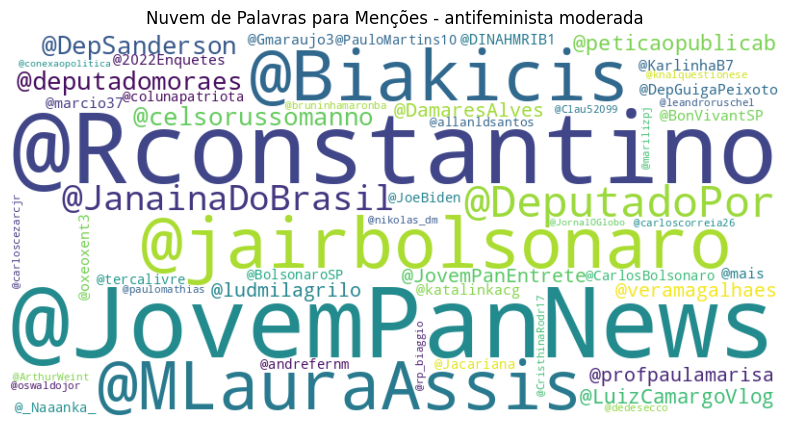

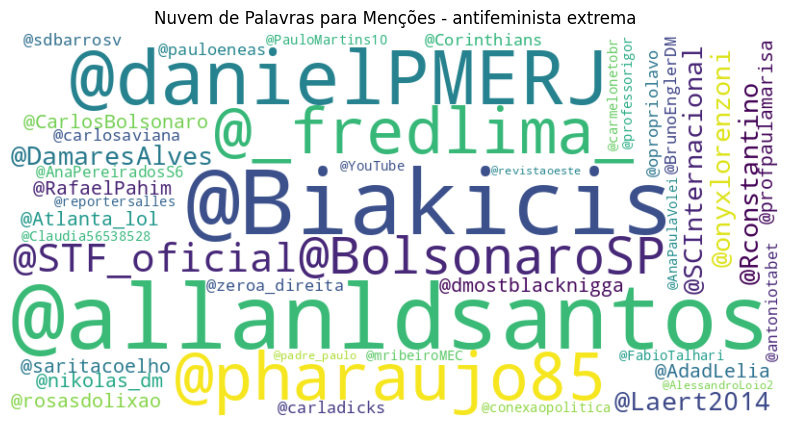

In [ ]:
# Word Cloud @s

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Gerando nuvens de palavras para menções por faixa ideológica na ordem especificada
for ideology in ordered_ideologies:
    if ideology in mentions_by_ideology:
        mentions = mentions_by_ideology[ideology]
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(mentions)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Nuvem de Palavras para Menções - {ideology}')
        plt.axis('off')
        plt.show()


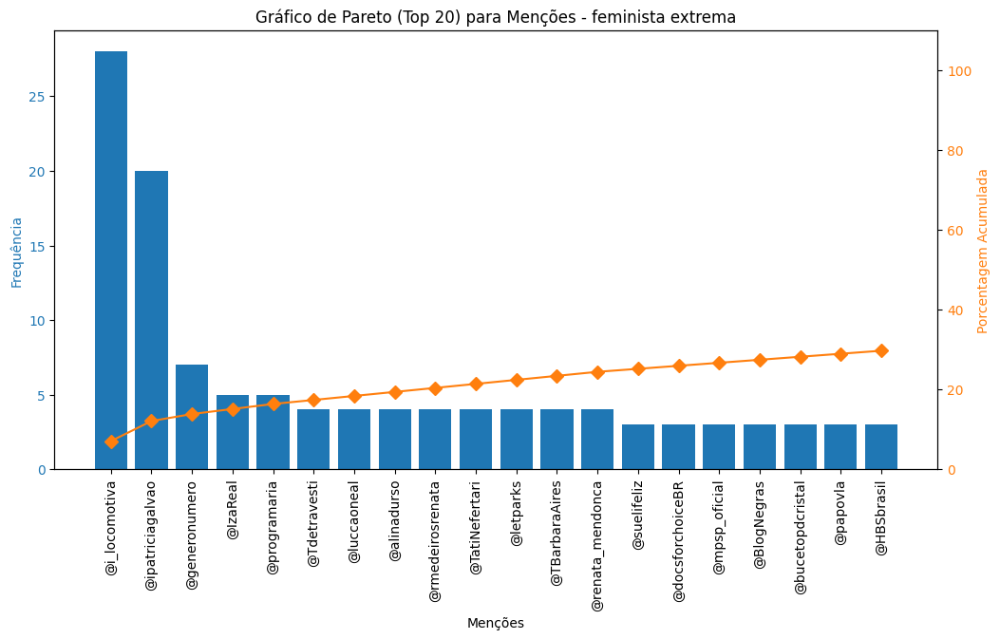

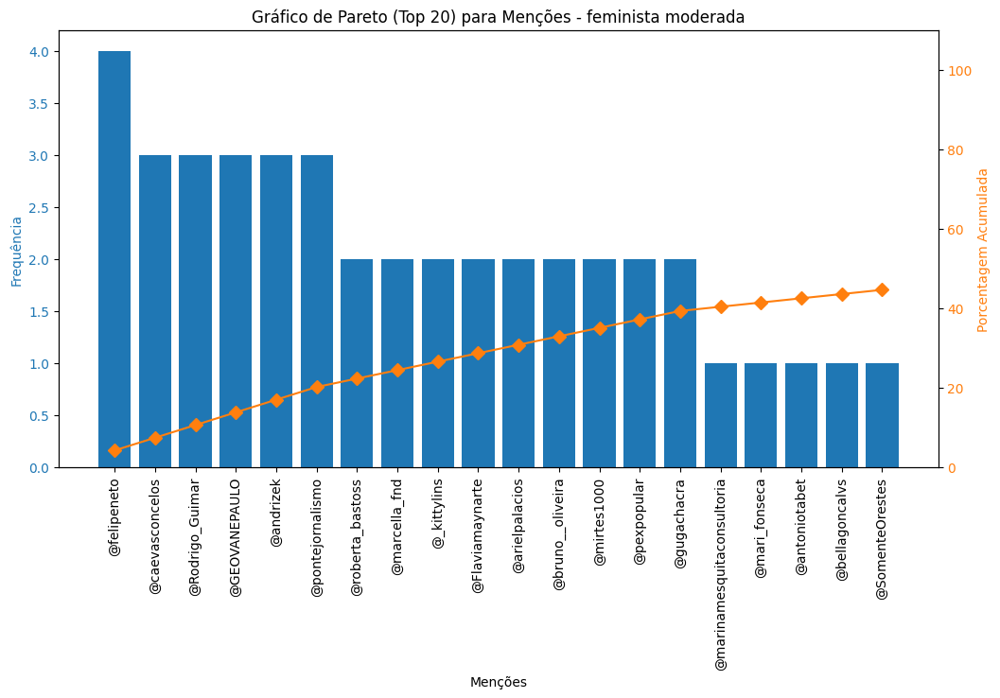

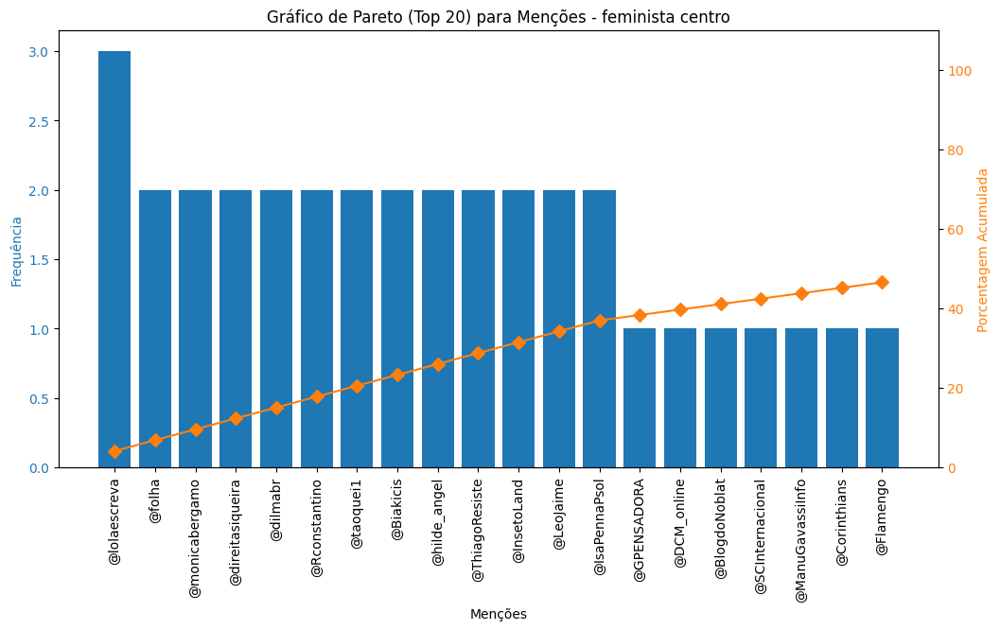

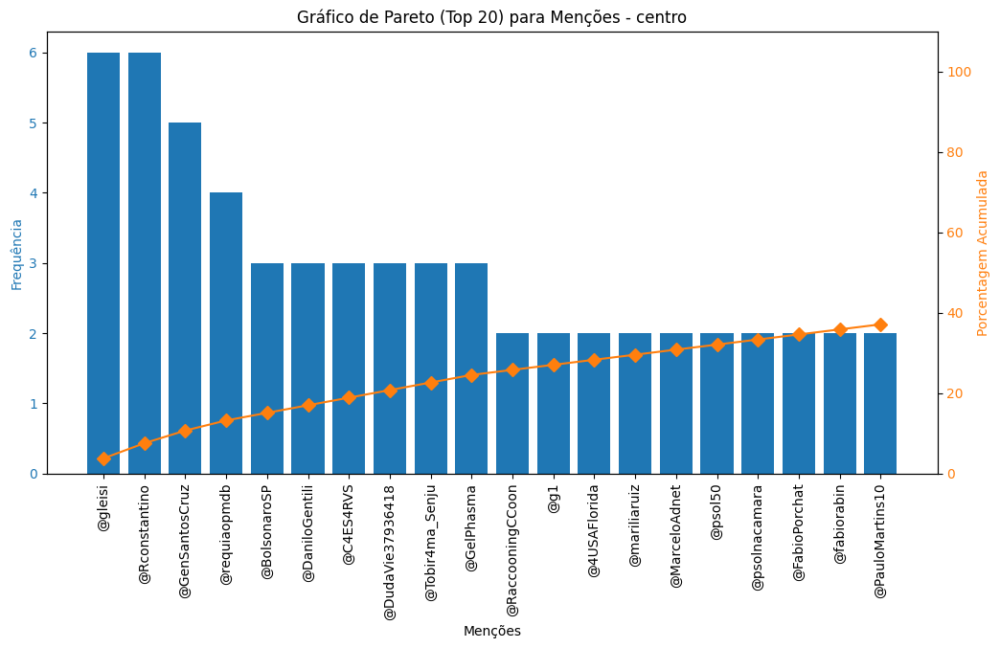

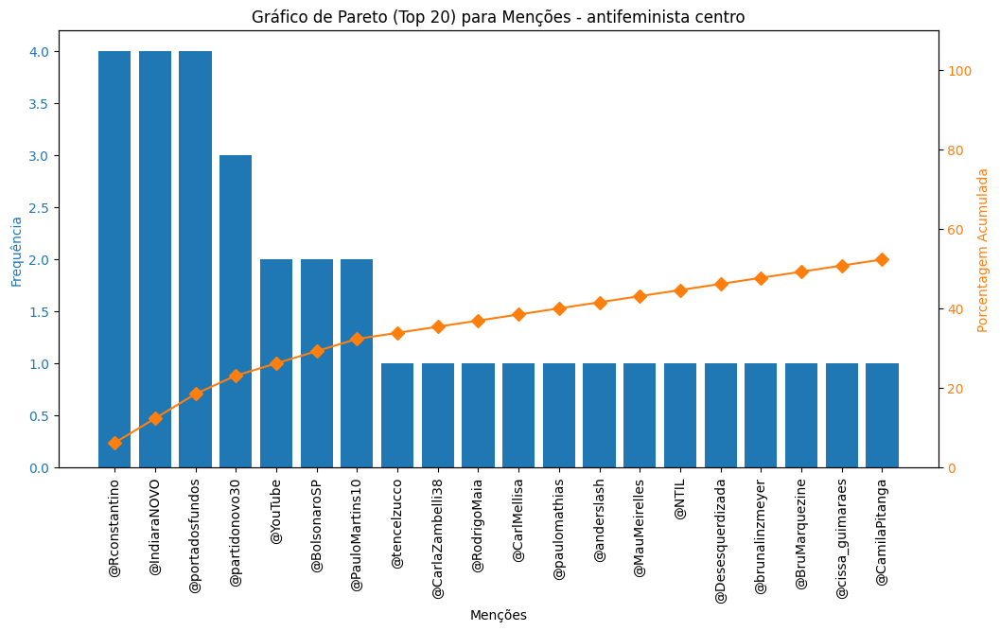

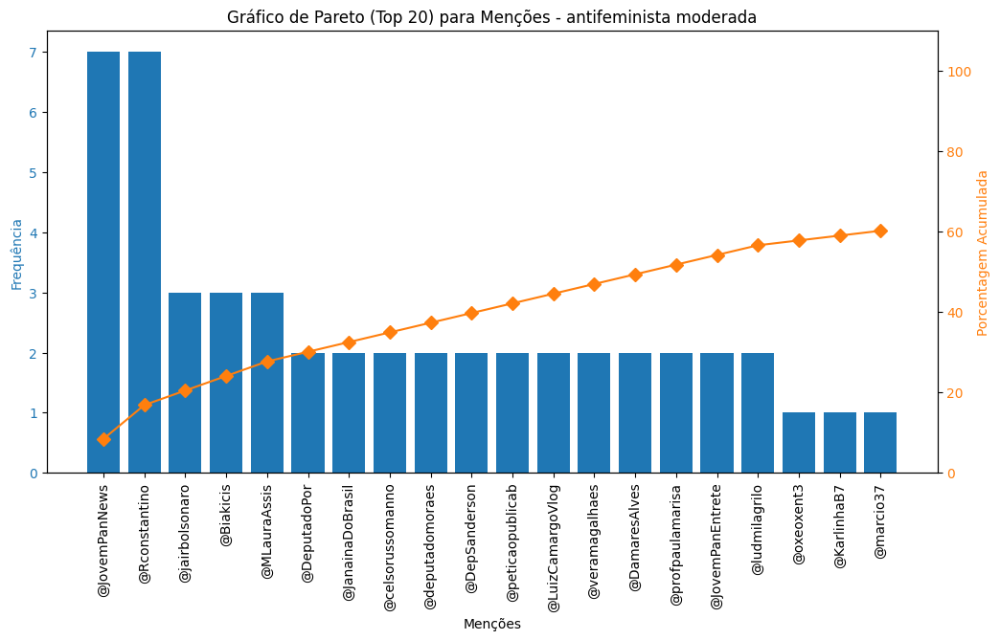

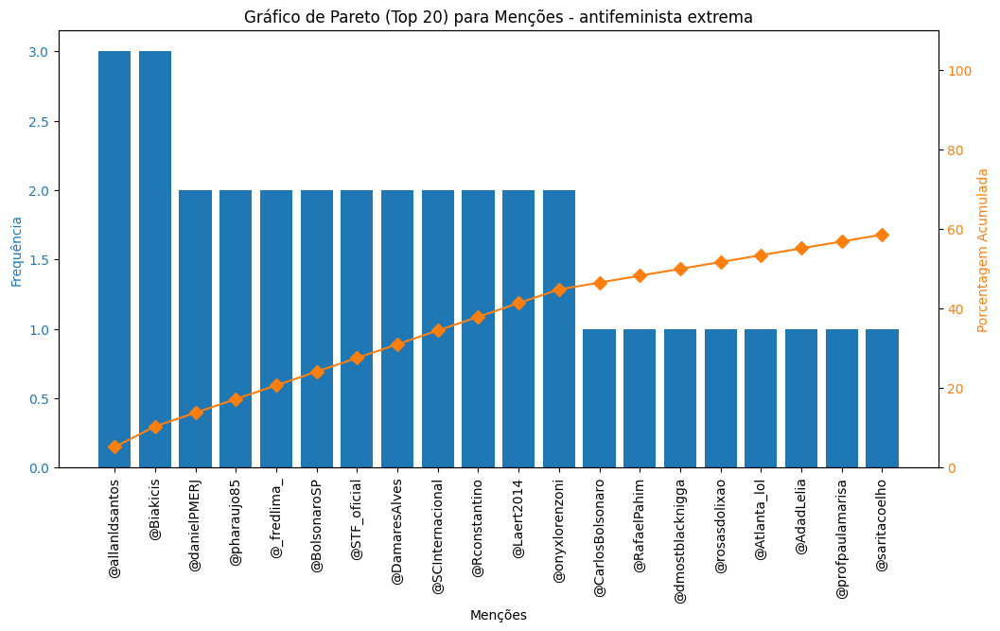

In [ ]:
# Pareto Menções

import matplotlib.pyplot as plt

# Gerando gráfico de Pareto para menções em cada faixa ideológica na ordem especificada, mostrando apenas o top 10
for ideology in ordered_ideologies:
    if ideology in mentions_by_ideology:
        mentions = mentions_by_ideology[ideology]
        total_counts = sum(mentions.values())  # Somando todas as menções, não apenas as top 10
        
        mentions_sorted = mentions.most_common(20)  # Mostrando apenas as top 10 menções
        
        if mentions_sorted:
            labels, counts = zip(*mentions_sorted)
            
            # Calculando a porcentagem acumulada considerando o total
            cum_percentage = [sum(counts[:i+1])/total_counts * 100 for i in range(len(counts))]
            
            # Plotando o gráfico de Pareto
            fig, ax1 = plt.subplots(figsize=(12, 6))

            ax1.bar(labels, counts, color='C0')
            ax1.set_xlabel('Menções')
            ax1.set_ylabel('Frequência', color='C0')
            ax1.tick_params(axis='y', labelcolor='C0')
            plt.xticks(rotation=90)

            ax2 = ax1.twinx()
            ax2.plot(labels, cum_percentage, color='C1', marker='D', ms=7)
            ax2.set_ylabel('Porcentagem Acumulada', color='C1')
            ax2.tick_params(axis='y', labelcolor='C1')
            ax2.set_ylim([0, 110])

            plt.title(f'Gráfico de Pareto (Top 20) para Menções - {ideology}')
            plt.show()


#### Emojis

In [ ]:
# emojis

from collections import Counter
import regex as re  # Usando 'regex' para suporte avançado a emojis

# Função para remover modificadores de tons de pele e outros símbolos
def remove_modifiers(emoji):
    # Remove todos os modificadores de tons de pele e outros símbolos combinados
    return re.sub(r'[\U0001F3FB-\U0001F3FF\U0001F3A0-\U0001F3F0\U00002600-\U000026FF]', '', emoji)

# Função para contar emojis por faixa ideológica
def count_emojis(group):
    emojis = Counter()
    emoji_pattern = re.compile(r'\X', re.UNICODE)
    
    for emojis_list in group['tweet_emojis'].dropna():
        if isinstance(emojis_list, str) and emojis_list.strip():
            found_emojis = [char for char in emoji_pattern.findall(emojis_list)]
            # Filtra emojis vazios
            found_emojis = [emoji for emoji in found_emojis if emoji.strip()]
            emojis.update(found_emojis)
    
    return emojis

# Agrupando por faixa ideológica e contando os emojis
emojis_by_ideology = df_feminism.groupby('user_ideology_classification').apply(count_emojis)

# Exibindo os resultados
# emojis_by_ideology


/tmp/ipykernel_201729/1834264059.py:26: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [ ]:
# emojis mais usados em tweets

import plotly.graph_objects as go
import re
from collections import Counter

# Ordem das ideologias conforme solicitado
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Função para extrair emojis usando regex que separa corretamente os emojis
def extract_emojis(text):
    emoji_pattern = re.compile(r'[\U0001F600-\U0001F64F'
                               r'\U0001F300-\U0001F5FF'
                               r'\U0001F680-\U0001F6FF'
                               r'\U0001F1E0-\U0001F1FF'
                               r'\U00002702-\U000027B0'
                               r'\U000024C2-\U0001F251'
                               r'\U0001F900-\U0001F9FF'
                               r'\U0000200D-\U0001F3FB-\U0001F3FF]', flags=re.UNICODE)
    return emoji_pattern.findall(text)

# Função para calcular a porcentagem de tweets em que cada emoji aparece
def calculate_emoji_percentage(df, ideology):
    # Filtrando os tweets da ideologia específica
    tweets = df[df['user_ideology_classification'] == ideology]
    total_tweets = len(tweets)
    
    emoji_counts = Counter()
    for tweet_emojis in tweets['tweet_emojis'].dropna():
        if isinstance(tweet_emojis, str) and tweet_emojis.strip():
            # Extrair cada emoji individualmente
            emoji_list = set(extract_emojis(tweet_emojis))
            emoji_counts.update(emoji_list)  # Contagem por tweet
    
    # Calculando a porcentagem de tweets que contêm cada emoji
    emoji_percentages = {emoji: (count / total_tweets) * 100 for emoji, count in emoji_counts.items()}
    return emoji_percentages

# Gerar gráficos de barras para cada faixa ideológica
for ideology in ordered_ideologies:
    emoji_percentages = calculate_emoji_percentage(df_feminism, ideology)
    
    if emoji_percentages:  # Verifica se há emojis para a ideologia
        sorted_emojis = sorted(emoji_percentages.items(), key=lambda item: item[1], reverse=True)
        top_10_emojis = sorted_emojis[:10]
        
        if top_10_emojis:
            labels, percentages = zip(*top_10_emojis)

            # Formatar os valores para exibir com uma casa decimal e símbolo de porcentagem
            formatted_percentages = [f'{p:.1f}%' for p in percentages]

            # Criar o gráfico de barras com Plotly
            fig = go.Figure([go.Bar(x=labels, y=percentages, text=formatted_percentages, textposition='auto')])

            fig.update_layout(
                title=f'Emojis mais usados - {ideology}',
                xaxis_title='Emojis',
                yaxis_title='Porcentagem de Tweets (%)',
                showlegend=False
            )

            fig.show()


In [ ]:
# tweets mais numerosos

import plotly.graph_objects as go

# Ordem das ideologias conforme solicitado
ordered_ideologies = [
    'feminista extrema', 
    'feminista moderada', 
    'feminista centro', 
    'centro', 
    'antifeminista centro', 
    'antifeminista moderada', 
    'antifeminista extrema'
]

# Função para calcular a porcentagem de tweets em que cada emoji aparece
def calculate_emoji_percentage(emojis_by_ideology, total_tweets):
    emoji_percentages = {emoji: (count / total_tweets) * 100 for emoji, count in emojis_by_ideology.items()}
    return emoji_percentages

# Gerar gráficos de Pareto para cada faixa ideológica
for ideology in ordered_ideologies:
    if ideology in emojis_by_ideology:
        emojis = emojis_by_ideology[ideology]
        total_tweets = sum(emojis.values())  # Calcular o número total de tweets na faixa ideológica

        if emojis:  # Verifica se há emojis para a ideologia
            # Calcular as porcentagens de cada emoji
            emoji_percentages = calculate_emoji_percentage(emojis, total_tweets)
            labels, percentages = zip(*sorted(emoji_percentages.items(), key=lambda item: item[1], reverse=True))

            # Calculando a porcentagem acumulada
            cum_percentage = [sum(percentages[:i+1]) for i in range(len(percentages))]

            # Criar o gráfico de Pareto com Plotly
            fig = go.Figure()

            # Adicionar o gráfico de barras para as porcentagens
            fig.add_trace(go.Bar(x=labels, y=percentages, text=[f'{p:.1f}%' for p in percentages], textposition='auto', name='Porcentagem de Tweets'))

            # Adicionar o gráfico de linha para a porcentagem acumulada
            fig.add_trace(go.Scatter(x=labels, y=cum_percentage, mode='lines+markers', name='Porcentagem Acumulada', yaxis='y2'))

            # Configurar layout com dois eixos y
            fig.update_layout(
                title=f'Gráfico de Pareto para Emojis - {ideology}',
                xaxis_title='Emojis',
                yaxis_title='Porcentagem de Tweets (%)',
                yaxis2=dict(
                    title='Porcentagem Acumulada',
                    overlaying='y',
                    side='right',
                    range=[0, 110]
                ),
                showlegend=False
            )

            fig.show()


#### Extra 1: Análise de sentimentos e feminismo

In [ ]:
# Aplicar uma análise de sentimento ao texto dos tweets para entender o tom geral dos tweets relacionados ao feminismo em cada faixa ideológica.

from transformers import pipeline

# Carregar o pipeline de análise de sentimentos usando um modelo multilíngue
sentiment_analyzer = pipeline("sentiment-analysis", model="nlptown/bert-base-multilingual-uncased-sentiment")

# Função para aplicar a análise de sentimentos e converter estrelas para categorias detalhadas
def get_detailed_sentiment(text):
    result = sentiment_analyzer(text)[0]
    stars = int(result['label'].split()[0])  # Extrai o número de estrelas
    if stars == 1:
        return 'muito negativo'
    elif stars == 2:
        return 'negativo'
    elif stars == 3:
        return 'neutro'
    elif stars == 4:
        return 'positivo'
    elif stars == 5:
        return 'muito positivo'

# Aplicando a função de sentimento para cada linha no DataFrame
df_feminism['tweet_sentiment'] = df_feminism['tweet_text_clean'].apply(get_detailed_sentiment)

# Verificando as primeiras linhas para garantir que a nova coluna foi adicionada corretamente
df_feminism[['tweet_text_clean', 'tweet_sentiment']].head()


/home/mindera/Documents/Mestrado/twitter_handler/myenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

2024-08-31 10:43:25.746041: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-31 10:43:25.756629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-31 10:43:25.769508: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-31 10:43:25.773173: E external/local

,tweet_text_clean,tweet_sentiment
25,violencia genero alem ciencia tecnologia desenvolvimento economico comunicacao arte memoria violencia contra populacao lgbtqi violencia racial maiores informacoes acesse,muito negativo
39,unico relacionamento abusivo aceito,muito negativo
40,unico relacionamento abusivo aceito,muito negativo
46,tema ic foco mulheres sirias olha la instagram,muito negativo
119,feminicidio mulher assassinada brutalmente ex companheiro jogador milionario queria pagar pensao filho corpo encontrado estao fazendo piada vida piada,muito negativo


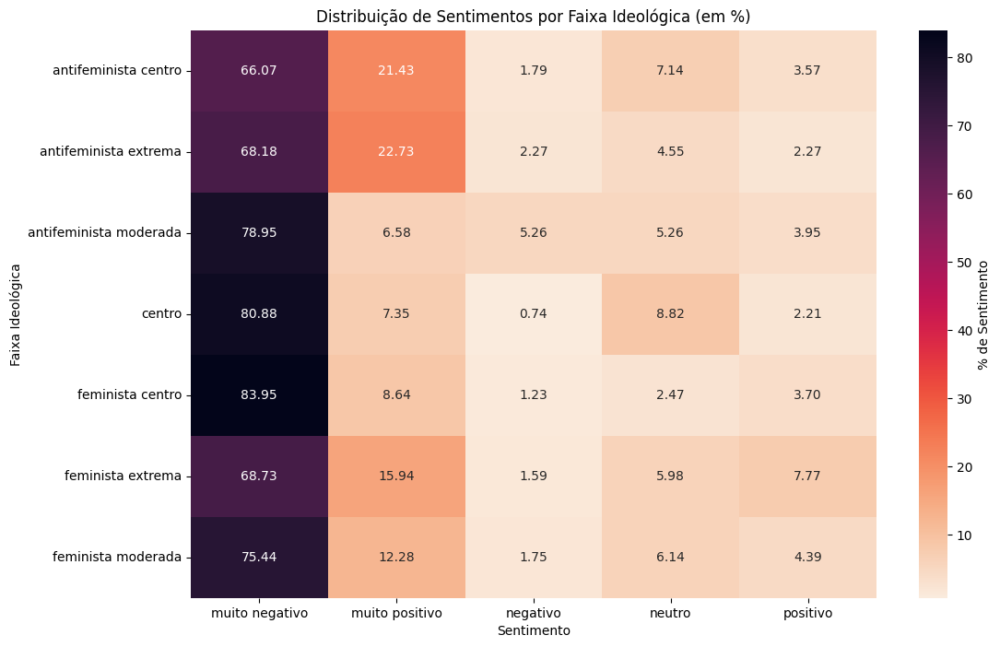

In [ ]:
# Agrupando por faixa ideológica e sentimento, e contando o número de tweets em cada grupo
sentiment_distribution = df_feminism.groupby(['user_ideology_classification', 'tweet_sentiment']).size().unstack(fill_value=0)

# Calculando a proporção de cada sentimento dentro de cada faixa ideológica
sentiment_proportion = sentiment_distribution.div(sentiment_distribution.sum(axis=1), axis=0)

import matplotlib.pyplot as plt
import seaborn as sns

# Arredondando os valores para 2 casas decimais e convertendo para porcentagem (0-100)
sentiment_proportion_rounded = (sentiment_proportion * 100).round(2)

# Criando o heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(sentiment_proportion_rounded, annot=True, cmap='rocket_r', fmt='.2f', cbar_kws={'label': '% de Sentimento'})

plt.title('Distribuição de Sentimentos por Faixa Ideológica (em %)')
plt.xlabel('Sentimento')
plt.ylabel('Faixa Ideológica')
plt.show()



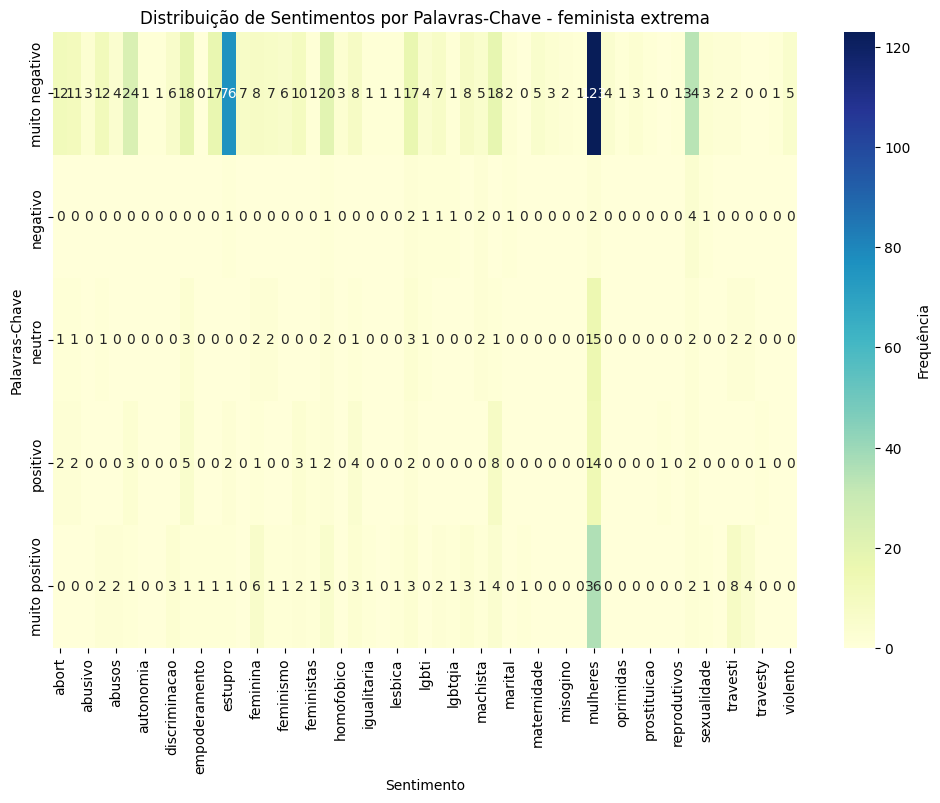

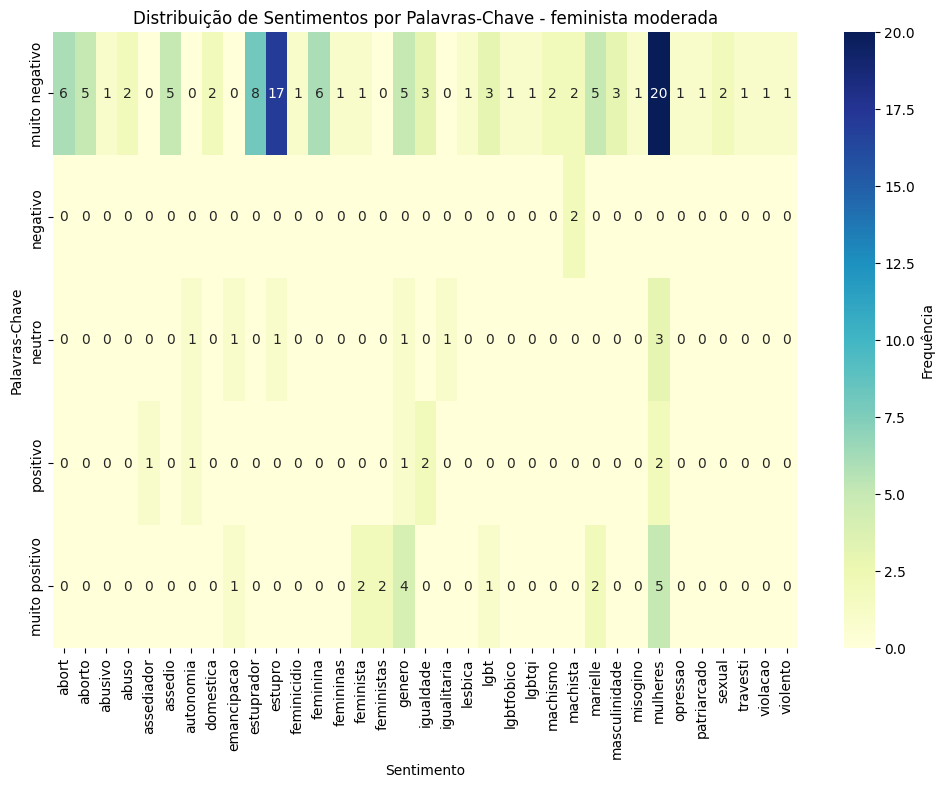

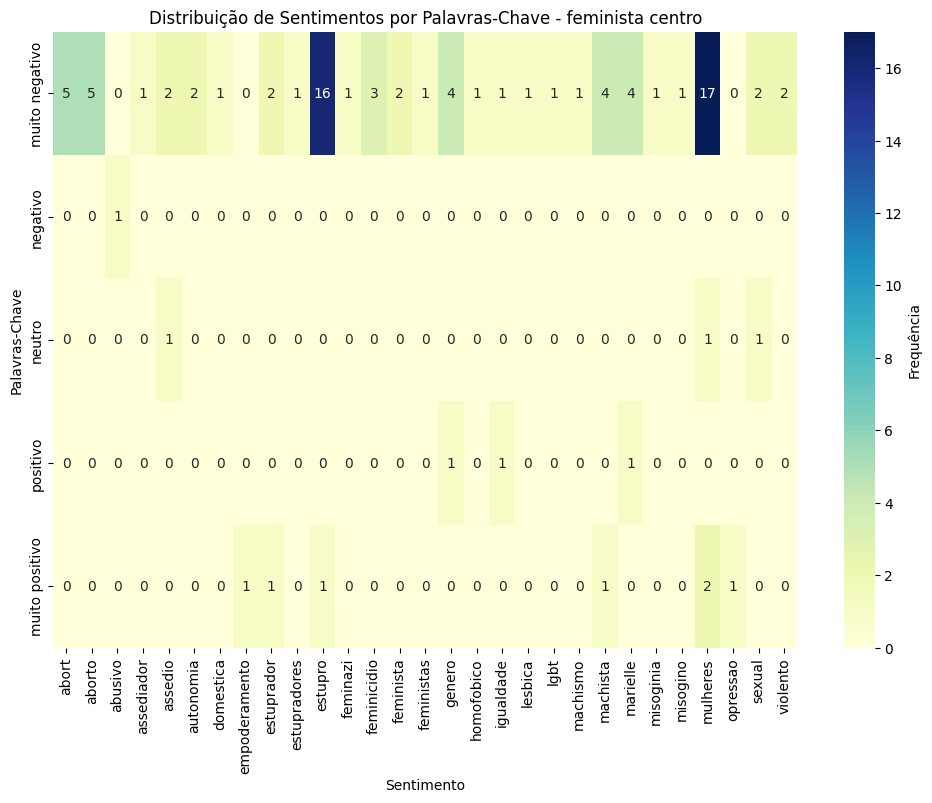

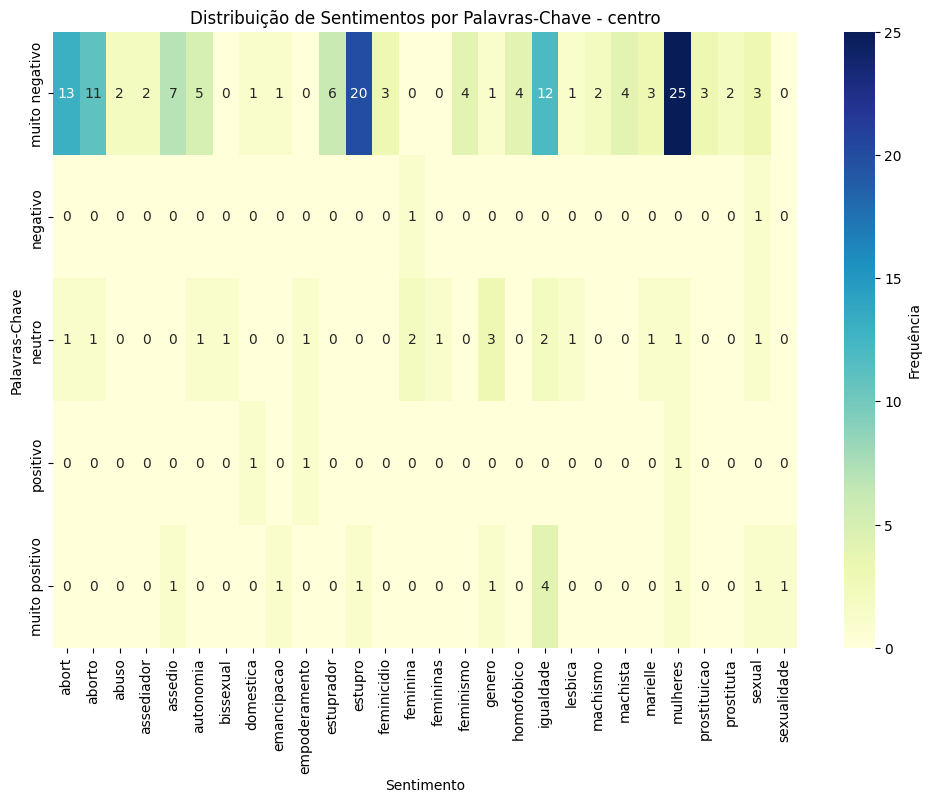

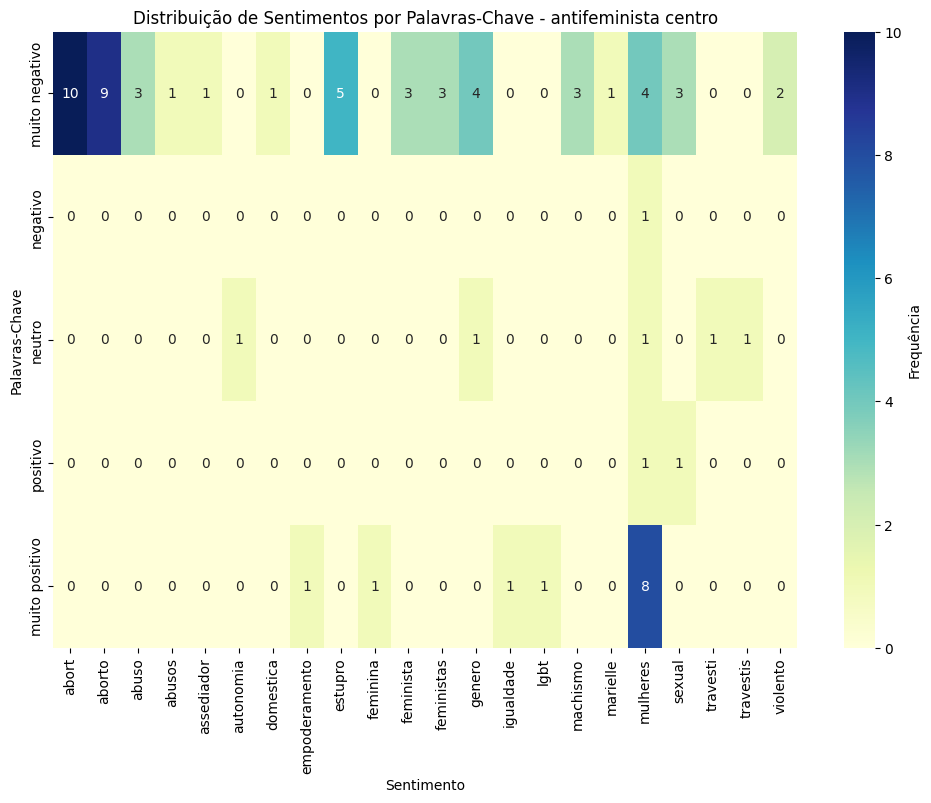

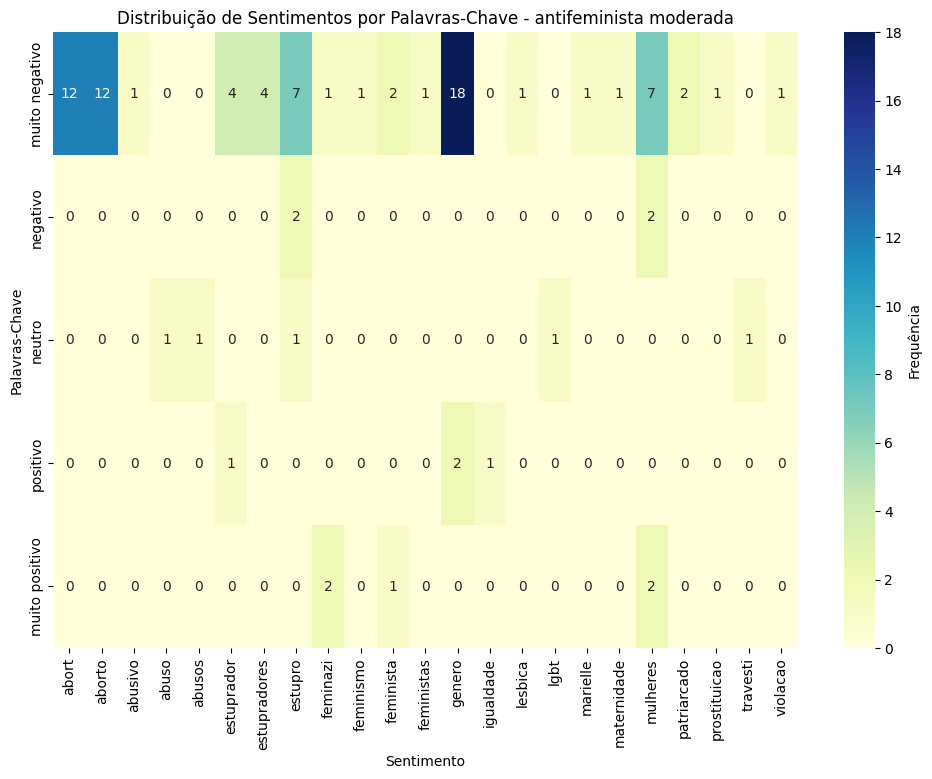

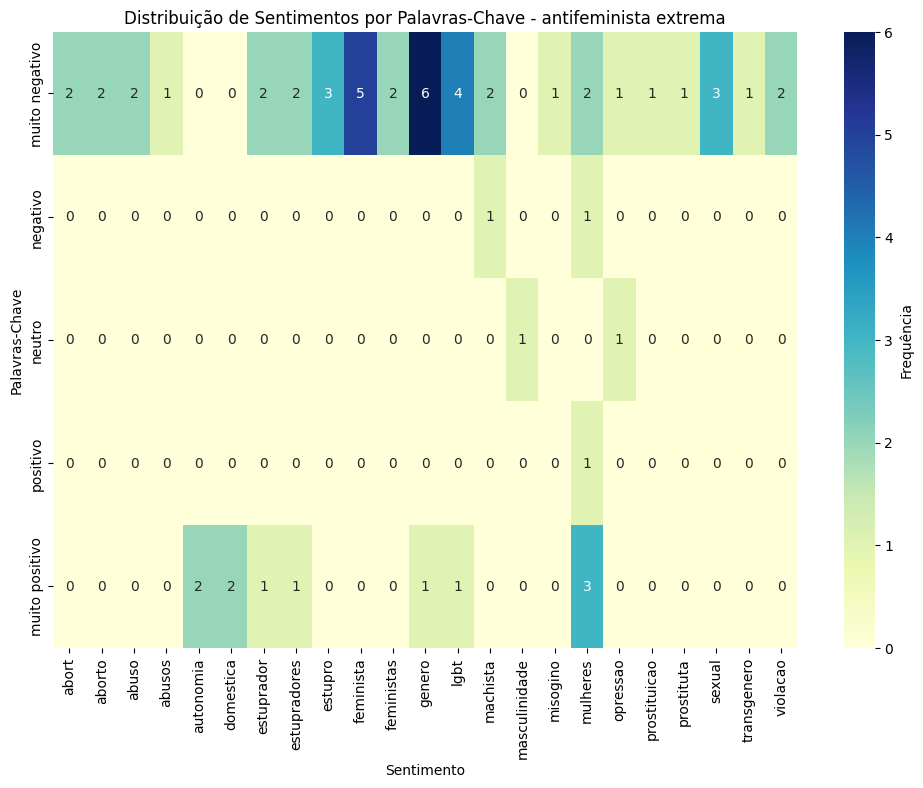

In [ ]:
# sentimento por faixa ideologica e keywords
import warnings
warnings.filterwarnings("ignore")

import ast
from collections import Counter

# Função para descompactar listas de palavras-chave e associá-las a sentimentos e faixas ideológicas
def extract_keywords_and_sentiments(row):
    try:
        keywords = ast.literal_eval(row['tweet_feminist_words'])  # Converte string de lista para lista
    except:
        keywords = []
    sentiment = row['tweet_sentiment']
    ideology = row['user_ideology_classification']
    return [(keyword, sentiment, ideology) for keyword in keywords]

# Aplicando a função a cada linha do dataframe
keywords_sentiments_ideology = df_feminism.apply(extract_keywords_and_sentiments, axis=1)

# Descompactando a lista de listas
flat_list = [item for sublist in keywords_sentiments_ideology for item in sublist]

# Criando um novo dataframe para análise
df_keywords_sentiments = pd.DataFrame(flat_list, columns=['keyword', 'sentiment', 'ideology']).dropna()

# Visualizando as primeiras linhas do novo dataframe
# df_keywords_sentiments.head()

# Contando a frequência de cada palavra-chave por sentimento e faixa ideológica
keyword_sentiment_count = df_keywords_sentiments.groupby(['ideology', 'sentiment', 'keyword']).size().unstack(fill_value=0)

# Exibindo as primeiras linhas do resultado
# keyword_sentiment_count.head()

ordered_ideologies = ['feminista extrema', 
                      'feminista moderada', 
                      'feminista centro', 
                      'centro', 
                      'antifeminista centro', 
                      'antifeminista moderada', 
                      'antifeminista extrema']

# Selecionando uma faixa ideológica para análise detalhada
for selected_ideology in ordered_ideologies:
    min_value = 0

    if selected_ideology in ['feminista extrema', 'feminista moderada']:
        min_value = 10

    min_value = 0

    # Filtrando os dados para a faixa ideológica selecionada
    filtered_data = keyword_sentiment_count.loc[selected_ideology]

    # Filtrando as palavras-chave que aparecem pelo menos uma vez
    filtered_data_nonzero = filtered_data.loc[:, (filtered_data > min_value).any(axis=0)]

    # Reordenando o índice para que os sentimentos fiquem do mais negativo para o mais positivo
    ordered_sentiments = ['muito negativo', 'negativo', 'neutro', 'positivo', 'muito positivo']

    # Reordenando os sentimentos e preenchendo os que estão faltando com zeros
    for sentiment in ordered_sentiments:
        if sentiment not in filtered_data_nonzero.index:
            filtered_data_nonzero.loc[sentiment] = 0

    # Reordenando o DataFrame para garantir que os sentimentos apareçam na ordem correta
    filtered_data_nonzero = filtered_data_nonzero.reindex(ordered_sentiments)

    # Criando o heatmap com o eixo Y ordenado do mais negativo para o mais positivo
    plt.figure(figsize=(12, 8))
    sns.heatmap(filtered_data_nonzero, annot=True, cmap='YlGnBu', fmt='d', cbar_kws={'label': 'Frequência'})

    plt.title(f'Distribuição de Sentimentos por Palavras-Chave - {selected_ideology}')
    plt.xlabel('Sentimento')
    plt.ylabel('Palavras-Chave')
    plt.show()






In [ ]:
# Quais são os tweets dos antifeministas que são positivos e sobre feminista(s)?

df_feminism[(df_feminism['tweet_feminist_words_clean'].str.contains('feminista', case=False, na=False)) & 
            (df_feminism['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)) & 
            (df_feminism['tweet_sentiment'].str.contains('positivo', case=False, na=False))][['tweet_text', 'user_ideology_classification', 'tweet_feminist_words_clean', 'tweet_sentiment']]

,tweet_text,user_ideology_classification,tweet_feminist_words_clean,tweet_sentiment
3826,"Qual é a lógica feminista em querer ganhar relevância mostrando o corpo? Se são tão capazes assim, mostrem seus valores intrínsecos!",antifeminista moderada,feminista,muito positivo


#### Extra 2: Distribuição temporal

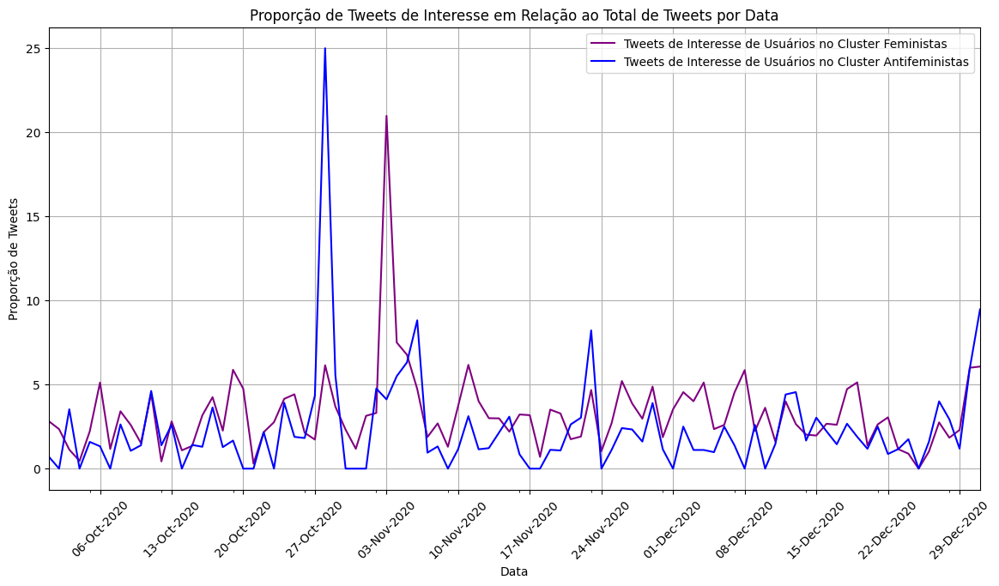

In [ ]:
# Analisar a distribuição temporal dos tweets para identificar picos de atividade e ver se estão relacionados a eventos específicos.

import pandas as pd
import matplotlib.pyplot as plt

# Passo 1: Converter a coluna 'tweet_created_at' para o formato datetime
df['tweet_created_at'] = pd.to_datetime(df['tweet_created_at'])

# Passo 2: Filtrar apenas os tweets feministas
df_feminism['tweet_created_at'] = pd.to_datetime(df_feminism['tweet_created_at'])

# Passo 3: Contagem de todos os tweets por data
total_tweets_per_day = df.set_index('tweet_created_at').resample('D').size()

# Passo 4: Contagem de tweets feministas por data
feminist_tweets_per_day = df_feminism.set_index('tweet_created_at').resample('D').size()

# Passo 5: Calcular a proporção de tweets feministas em relação ao total de tweets por data
proportion_feminist_tweets_per_day = feminist_tweets_per_day / total_tweets_per_day

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Passo 1: Converter a coluna 'tweet_created_at' para o formato datetime
df['tweet_created_at'] = pd.to_datetime(df['tweet_created_at'])

# Passo 2: Filtrar apenas os tweets feministas
df_feminism['tweet_created_at'] = pd.to_datetime(df_feminism['tweet_created_at'])

# Passo 3: Contagem de todos os tweets por data
total_tweets_per_day = df.set_index('tweet_created_at').resample('D').size()

# Passo 4: Filtrar os tweets de usuários feministas e antifeministas
df_feminist_users = df_feminism[df_feminism['user_ideology_classification'].str.contains('feminista', case=False, na=False)]
df_antifeminist_users = df_feminism[df_feminism['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)]

df_feminist_users_tt = df[df['user_ideology_classification'].str.contains('feminista', case=False, na=False)].set_index('tweet_created_at').resample('D').size()
df_antifeminist_users_tt = df[df['user_ideology_classification'].str.contains('antifeminista', case=False, na=False)].set_index('tweet_created_at').resample('D').size()

# Passo 5: Contagem de tweets feministas por data para cada grupo
feminist_users_tweets_per_day = df_feminist_users.set_index('tweet_created_at').resample('D').size()
antifeminist_users_tweets_per_day = df_antifeminist_users.set_index('tweet_created_at').resample('D').size()

# Passo 6: Calcular a proporção de tweets feministas em relação ao total de tweets por data para cada grupo
proportion_feminist_users_tweets_per_day = round(feminist_users_tweets_per_day / df_feminist_users_tt * 100, 2)
proportion_antifeminist_users_tweets_per_day = round(antifeminist_users_tweets_per_day / df_antifeminist_users_tt * 100, 2)

# Passo 7: Plotar as proporções ao longo do tempo
plt.figure(figsize=(14, 7))

# Linha para todos os tweets feministas
# (proportion_feminist_tweets_per_day*100).plot(label='Todos os Tweets de Interesse', color='green')

# Linha para tweets de usuários feministas
proportion_feminist_users_tweets_per_day.plot(label='Tweets de Interesse de Usuários no Cluster Feministas', color='purple')

# Linha para tweets de usuários antifeministas
proportion_antifeminist_users_tweets_per_day.plot(label='Tweets de Interesse de Usuários no Cluster Antifeministas', color='blue')

# Ajustes no eixo X para exibir corretamente as datas
plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(interval=1))  # Mostra as semanas
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d-%b-%Y'))  # Formato de data dia-mês-ano

plt.title('Proporção de Tweets de Interesse em Relação ao Total de Tweets por Data')
plt.xlabel('Data')
plt.ylabel('Proporção de Tweets')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)  # Rotaciona as datas para melhor visualização
plt.show()



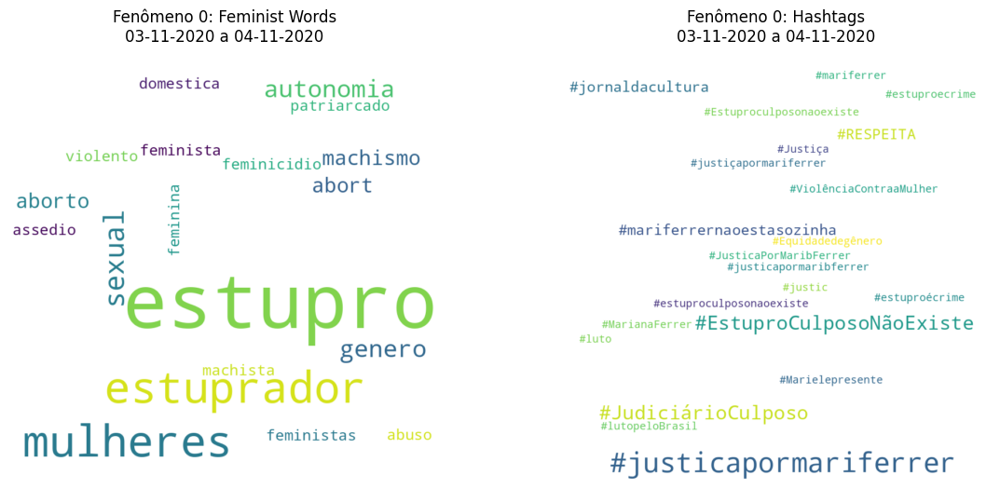

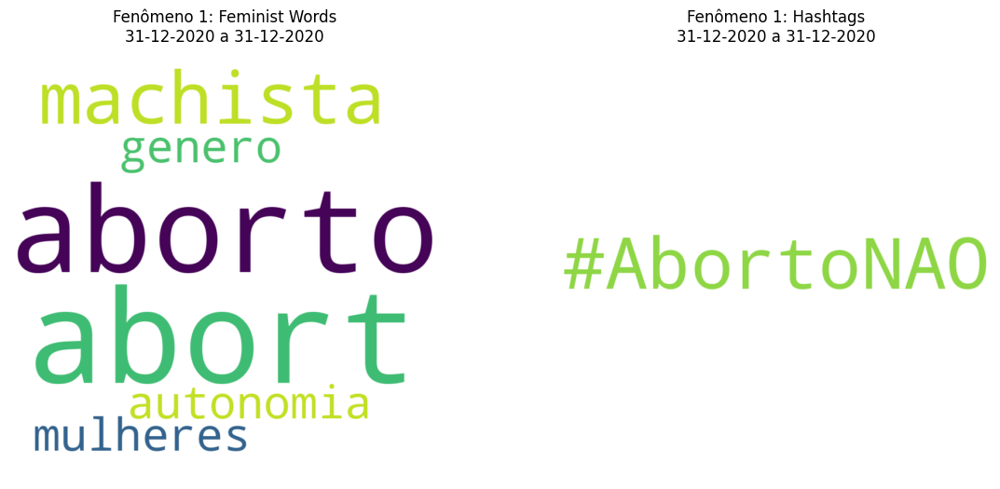

In [ ]:
# keywords e hashtags por dia fora da curva

from scipy.signal import find_peaks

# Identificando picos no gráfico de proporção de tweets feministas
peaks, _ = find_peaks(proportion_feminist_tweets_per_day, distance=5, height=0.1)  # Ajuste o valor de `height` conforme necessário

# Obter as datas correspondentes aos picos
# Filtrar os dias em que a proporção de tweets feministas é maior que 0.25
days_above_threshold = proportion_feminist_tweets_per_day[proportion_feminist_tweets_per_day > 0.06]

# Exibir os resultados
# days_above_threshold

import pandas as pd

# Considerando que 'days_above_threshold' é a série com as datas filtradas
# Criando um DataFrame para facilitar o processamento
df_above_threshold = days_above_threshold.reset_index()

# Criando uma coluna para identificar grupos de dias consecutivos
df_above_threshold['group'] = (df_above_threshold['tweet_created_at'].diff().dt.days > 1).cumsum()

# Agrupando por esses grupos
groups = df_above_threshold.groupby('group')['tweet_created_at'].apply(list)

# print(groups)

from collections import Counter

# Analisando os tópicos para cada grupo de dias consecutivos
# for i, days in groups.items():
#     # Filtrar os tweets desses dias
#     df_group = df_feminism[df_feminism['tweet_created_at'].dt.date.isin(pd.to_datetime(days).date)]
    
#     # Contar as palavras relacionadas ao feminismo
#     feminist_words = Counter()
#     for words_list in df_group['tweet_feminist_words_clean'].dropna():
#         words = words_list.split()  # Dividindo as palavras na string
#         feminist_words.update(words)
    
#     # Contar as hashtags mais usadas
#     hashtags = Counter()
#     for hashtags_list in df_group['tweet_hashtags'].dropna():
#         hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
    
#     # Exibir os tópicos principais para o grupo
#     print(f"Fenômeno {i}:")
#     print("Palavras feministas mais comuns:", feminist_words.most_common(10))
#     print("Hashtags mais comuns:", hashtags.most_common(10))
#     print("\n")

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Função para criar e exibir as nuvens de palavras
def create_wordclouds(feminist_words, hashtags, phenomenon_number, days):
    # Criando a word cloud para feminist_words
    wordcloud_feminist_words = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(feminist_words)
    
    # Criando a word cloud para hashtags
    wordcloud_hashtags = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(hashtags)
    
    # Plotando as word clouds lado a lado
    plt.figure(figsize=(14, 6))

    # Word cloud para feminist_words
    plt.subplot(1, 2, 1)
    plt.imshow(wordcloud_feminist_words, interpolation='bilinear')
    plt.title(f'Fenômeno {phenomenon_number}: Feminist Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
    plt.axis('off')

    # Word cloud para hashtags
    plt.subplot(1, 2, 2)
    plt.imshow(wordcloud_hashtags, interpolation='bilinear')
    plt.title(f'Fenômeno {phenomenon_number}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
    plt.axis('off')

    plt.show()

# Gerando as word clouds para cada fenômeno
for i, days in groups.items():
    # Filtrar os tweets desses dias
    df_group = df_feminism[df_feminism['tweet_created_at'].dt.date.isin(pd.to_datetime(days).date)]
    
    # Contar as palavras relacionadas ao feminismo
    feminist_words = Counter()
    for words_list in df_group['tweet_feminist_words_clean'].dropna():
        words = words_list.split()  # Dividindo as palavras na string
        feminist_words.update(words)
    
    # Contar as hashtags mais usadas
    hashtags = Counter()
    for hashtags_list in df_group['tweet_hashtags'].dropna():
        hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
    
    # Criar e exibir as word clouds para o fenômeno atual
    create_wordclouds(feminist_words, hashtags, i, days)




In [ ]:
tweets_filtrados[tweets_filtrados['tweet_text'].str.lower().str.contains('intercept')]['user_ideology_classification']

14885    centro
15447    centro
Name: user_ideology_classification, dtype: object


Fenômeno 1 (2020-10-28 a 2020-10-28):
Hashtags mais numerosas: []


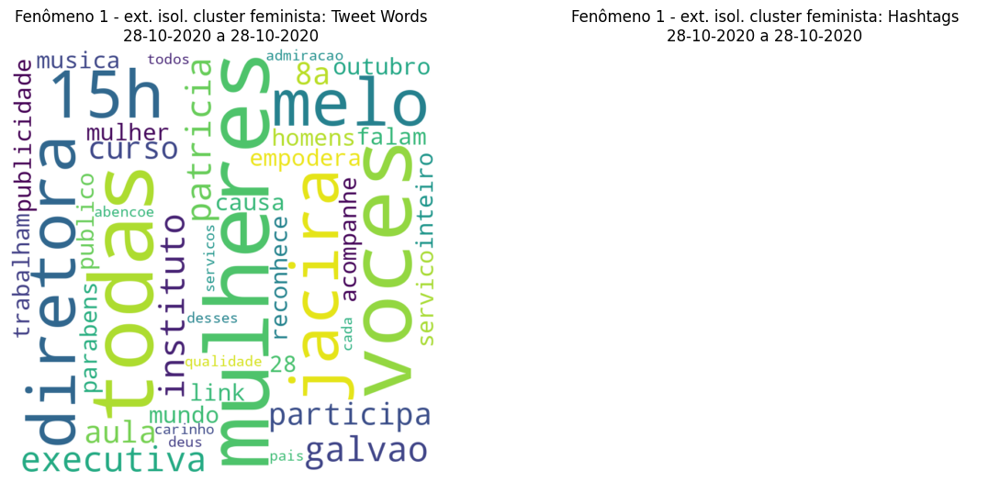

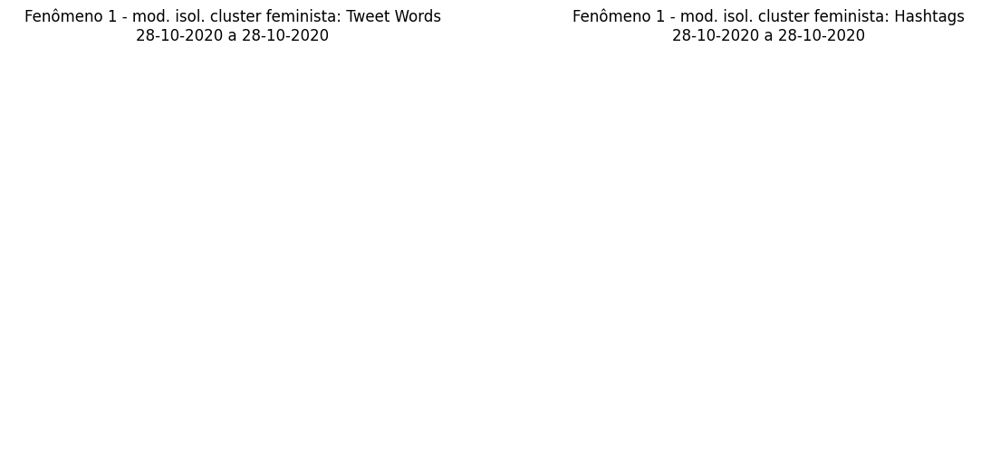

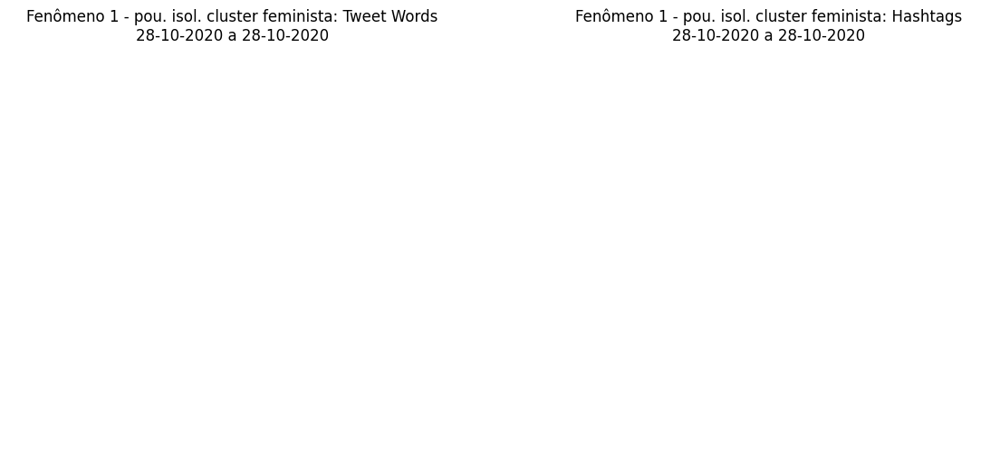

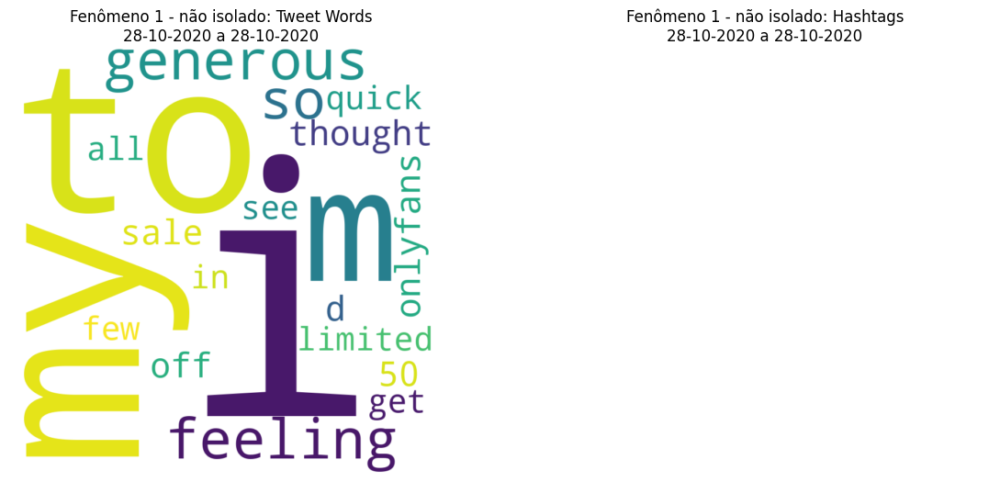

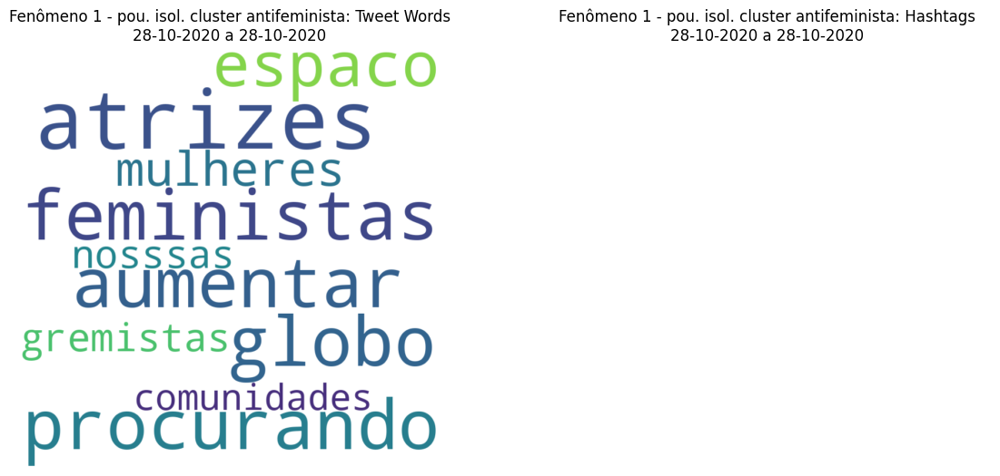

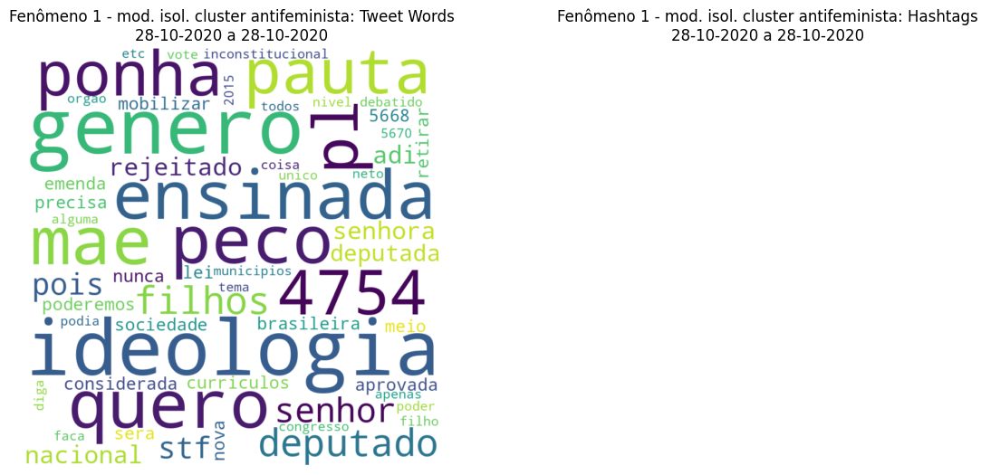

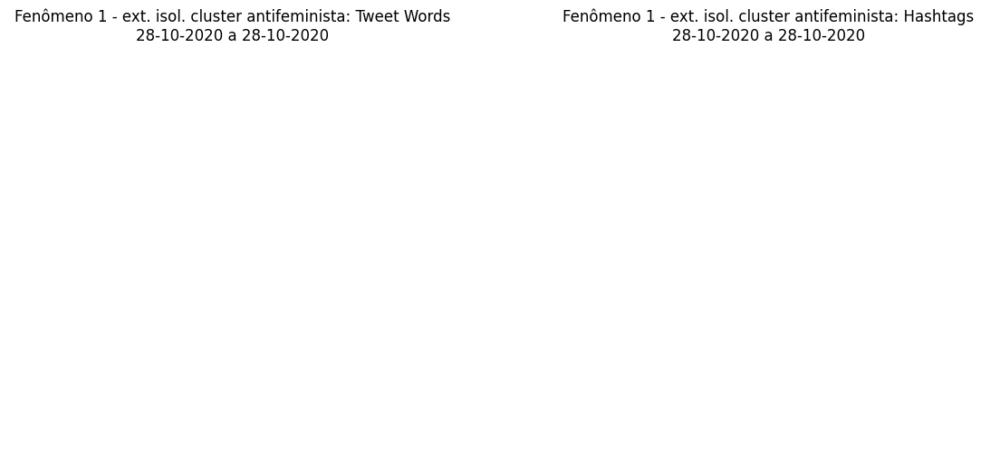

,tweet_text,user_ideology_classification
11830,"RT @Desesquerdizada: As atrizes ""feministas"" da Globo como @brunalinzmeyer, @BruMarquezine, @cissa_guimaraes, @CamilaPitanga, @DiraPaesCom,…",antifeminista centro
12232,Estamos procurando aumentar o espaço das mulheres gremistas em nosssas comunidades ! https://t.co/ihDLHr1FOJ,antifeminista centro
12276,"@deputadomoraes *""Senhor Deputado, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada
12275,"@deputadomoraes *""Senhor Deputado, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada
12274,"@celsorussomanno \n*""Senhor Deputado, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada
12273,"@celsorussomanno \n*""Senhor Deputado, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada
12271,"""Senhora Deputada, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"". Vote não!",antifeminista moderada
12270,"""Senhora Deputada, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"". Vote não!",antifeminista moderada
12268,"@JanainaDoBrasil \n""Senhora Deputada, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada
12267,"@JanainaDoBrasil \n""Senhora Deputada, sou mãe e NÃO QUERO que seja ensinada a ideologia de gênero para meus filhos, peço que ponha em Pauta o PL 4754"".",antifeminista moderada



Fenômeno 2 (2020-11-03 a 2020-11-05):
Hashtags mais numerosas: ['#justicapormariferrer', '#EstuproCulposoNãoExiste', '#JudiciárioCulposo', '#RESPEITA', '#jornaldacultura', '#MarianaFerrer', '#mariferrernaoestasozinha', '#justicapormaribferrer', '#justic', '#justiçapormariferrer', '#Marielepresente', '#Estuproculposonaoexiste', '#lutopeloBrasil', '#luto', '#estuproculposonaoexiste', '#estuproécrime', '#estuproecrime', '#mariferrer', '#Justiça', '#Equidadedegênero', '#ViolênciaContraaMulher', '#JusticaPorMaribFerrer', '#JusticaParaMariFerrer']


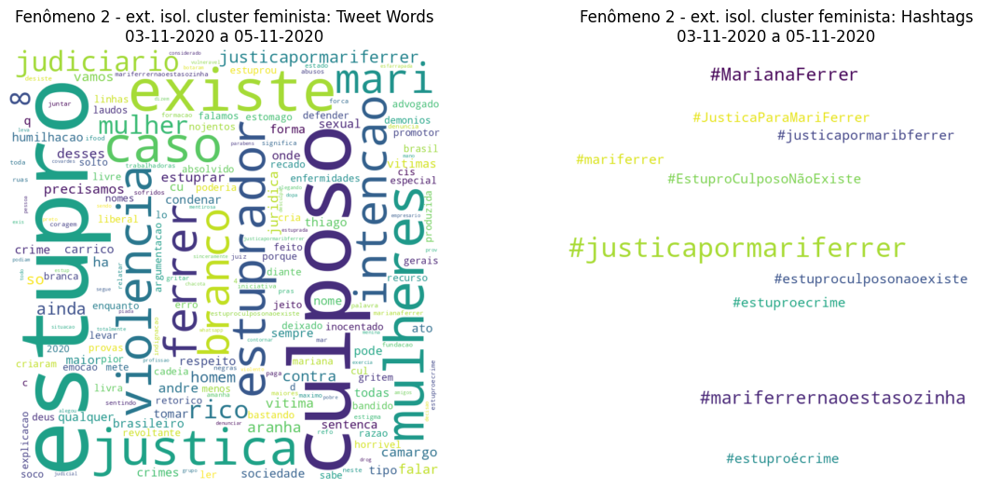

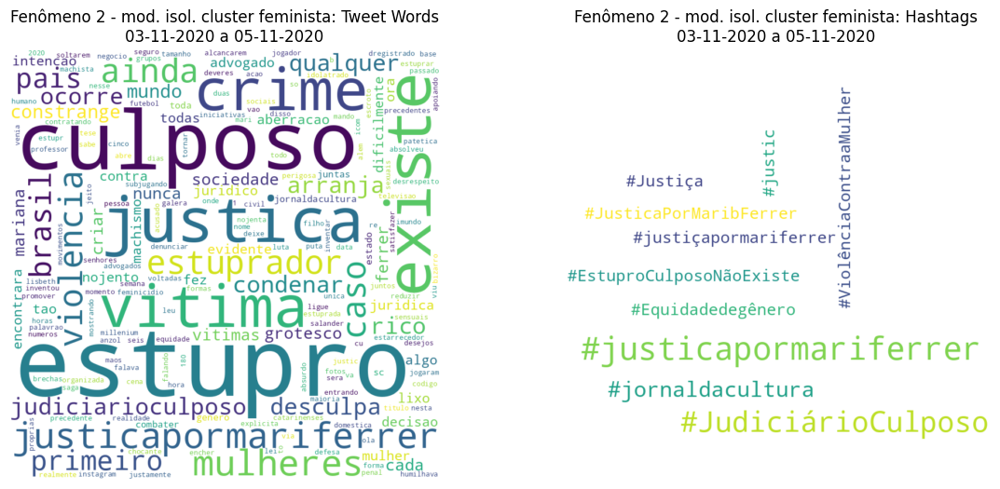

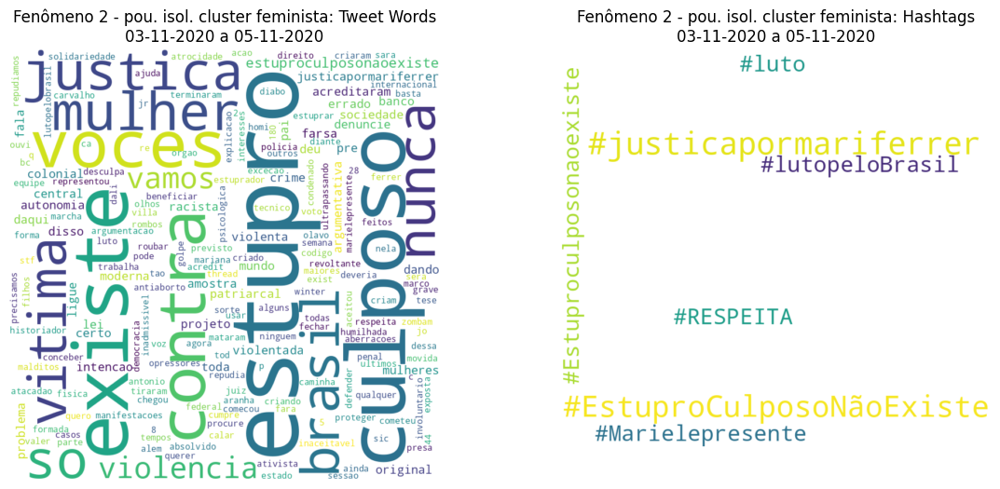

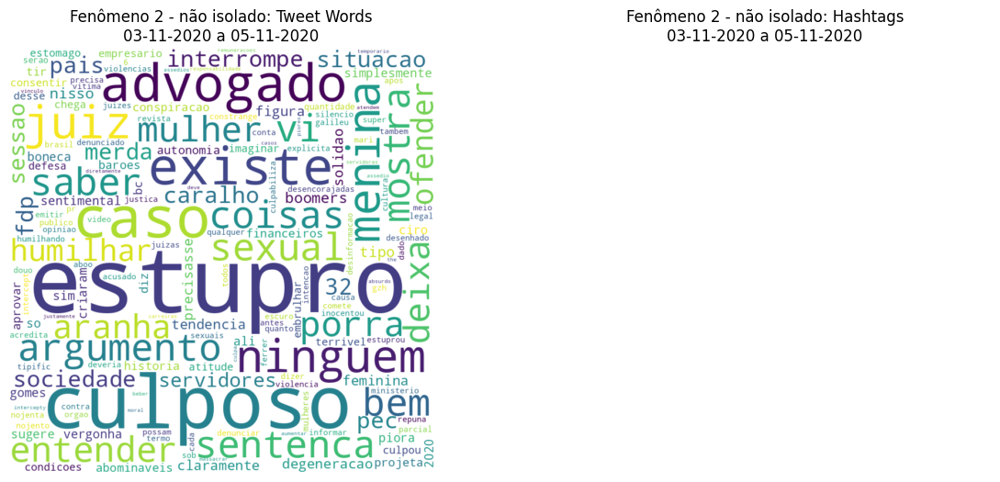

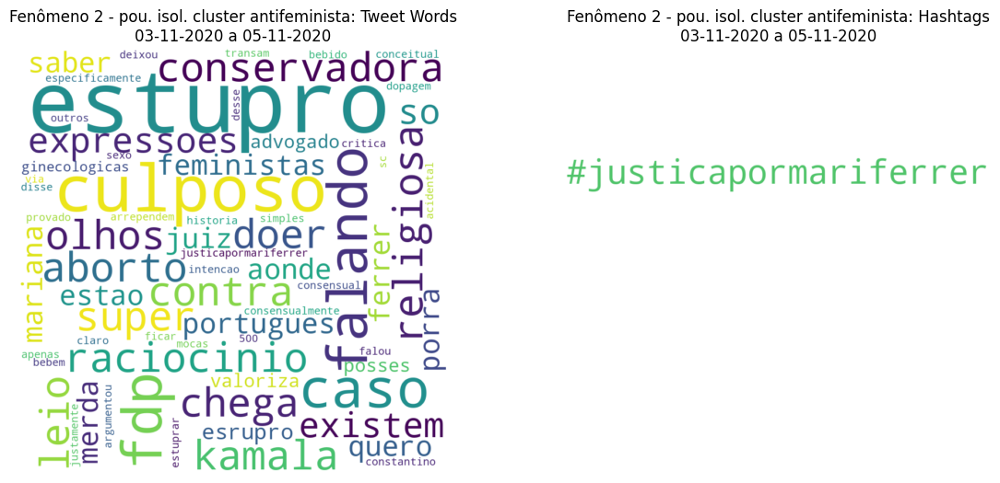

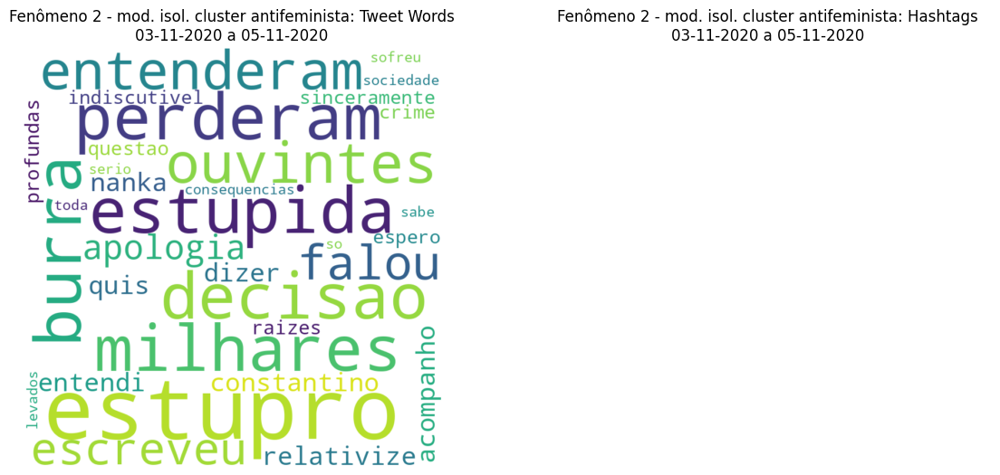

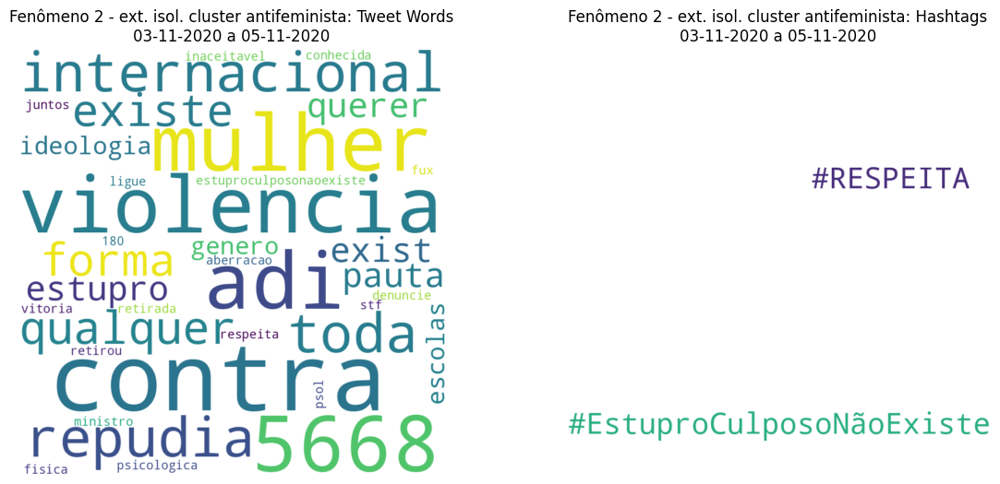

,tweet_text,user_ideology_classification
15202,"@CamosElmo @DeniseBrito89 @Rconstantino Mas ele deixou claro que não estava falando especificamente desse caso. O constantino falou apenas das moças que bebem, transam consensualmente e se arrependem depois. Essa história de dopagem já é outros 500... se ficar provado, estupro. Simples assim",antifeminista centro
14495,"Quero saber aonde estão as feministas sobre o caso da Mariana Ferrer ???? \nPorra juiz de merda "" esrupro culposo"" e o advogado FDP falando que ela valoriza as posses ""ginecológicas""?? \nFDP #justicapormariferrer",antifeminista centro
14274,"@Clauwild1 Pelo raciocínio a Kamala é contra o aborto, super religiosa e conservadora. \nChega a doer os olhos quando leio isso!!!",antifeminista centro
14942,"Em SC, “estupro culposo”. Sem intenção de estuprar? Acidental? https://t.co/GJSzbiUq36 via @YouTube",antifeminista centro
15207,"@ThainNa40781596 @a7ison @muraah @PauloMartins10 @Rconstantino Ele argumentou justamente que SE tivesse bebido e o sexo fosse consensual, não seria estupro. A crítica era conceitual.",antifeminista centro
...,...,...
14418,"RT @_kittylins: Estupro é a ação que tem por base a intenção de satisfazer seus desejos sexuais subjugando a vítima, onde que existe estupr…",feminista moderada
15076,"‘É muito comum a sociedade reviolentar as vítimas de violência sexual’ - “Sempre há uma narrativa de desconstrução da vítima”, aponta Laina Crisóstomo, da ONG Tamo Juntas. Por @caevasconcelos (https://t.co/tGlmtcsQEF)",feminista moderada
14319,RT @bicmuller: O precedente de “estupro culposo” e a cena patética do advogado de defesa do acusado mostrando fotos sensuais do Instagram d…,feminista moderada
14415,"RT @jnascim: ""Estupro culposo"" é violência explícita e nojenta contra a mulher no Brasil, por @kellymatos via @gzhdigital https://t.co/mUoe…",feminista moderada



Fenômeno 3 (2020-12-30 a 2020-12-31):
Hashtags mais numerosas: ['#AbortoNAO', '#AbortoLegalYa']


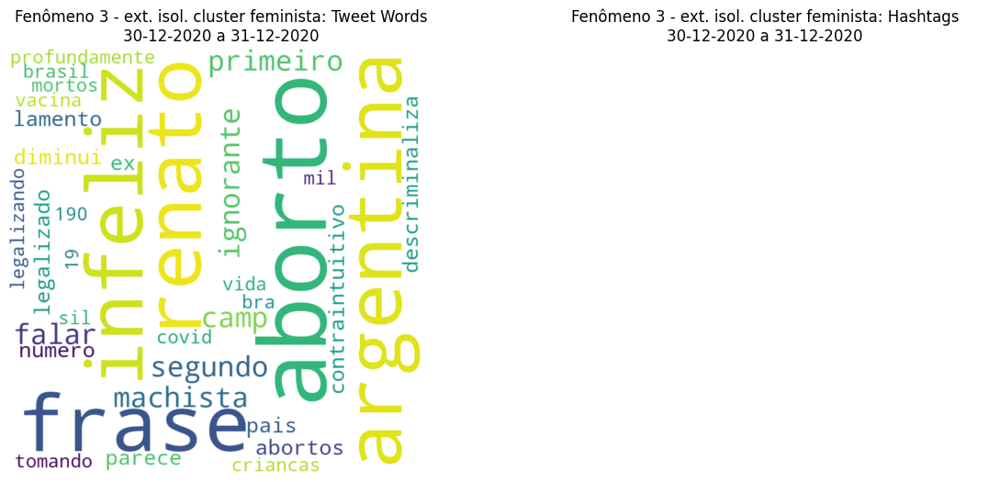

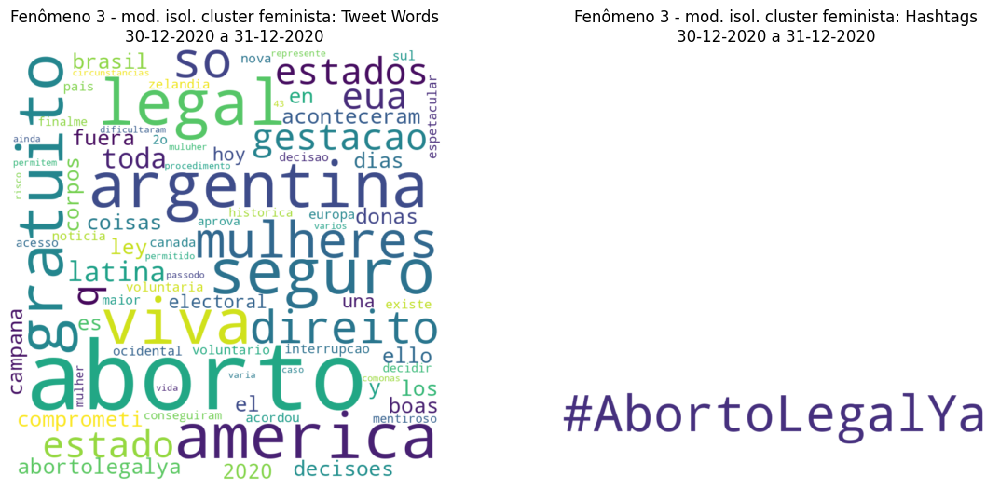

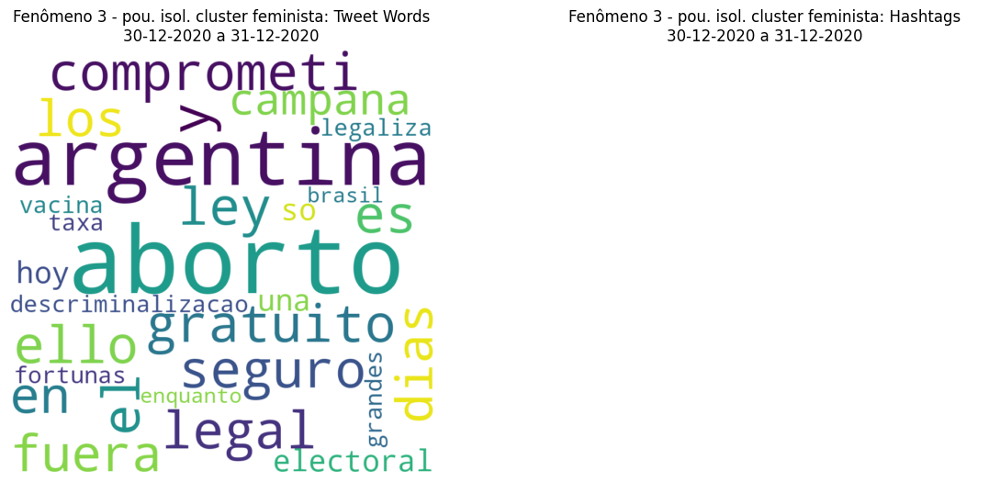

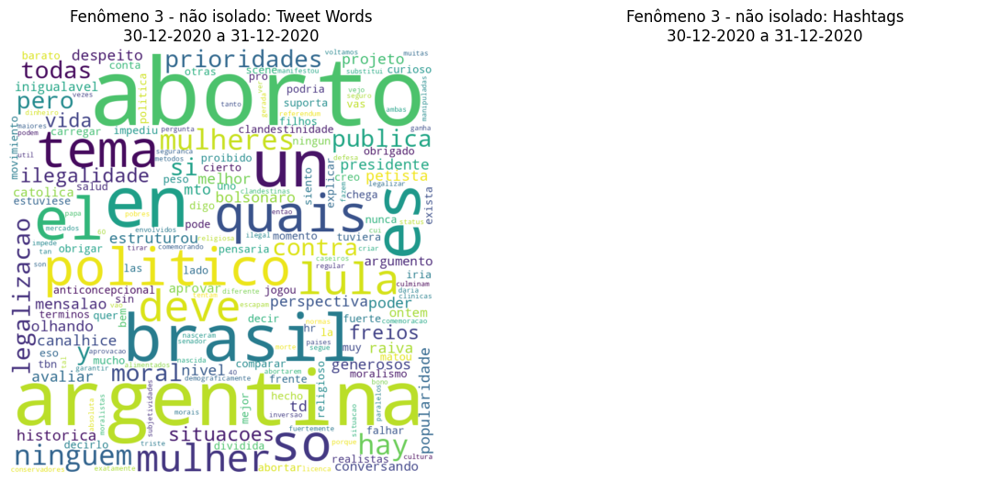

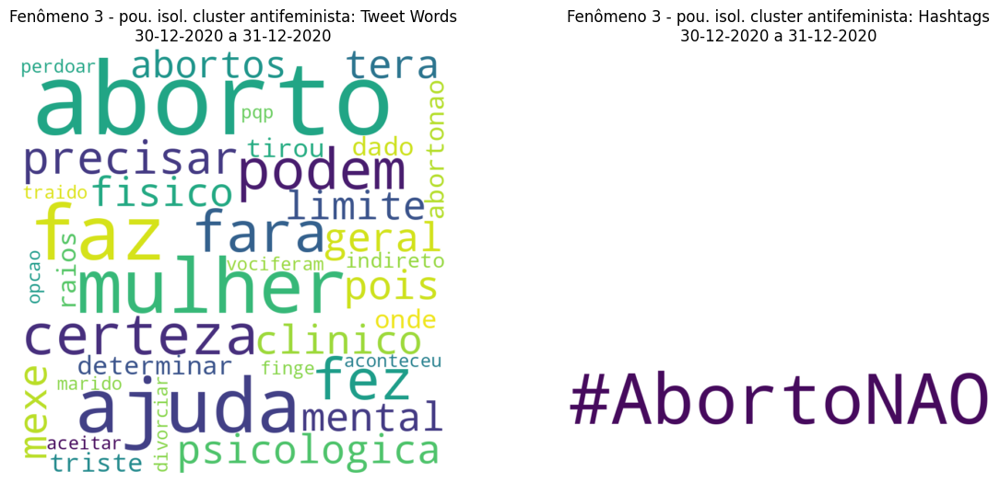

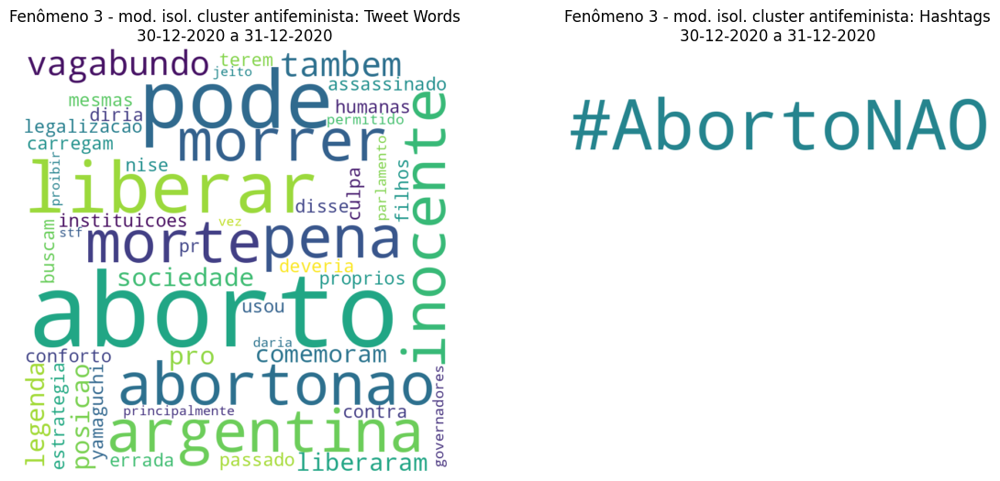

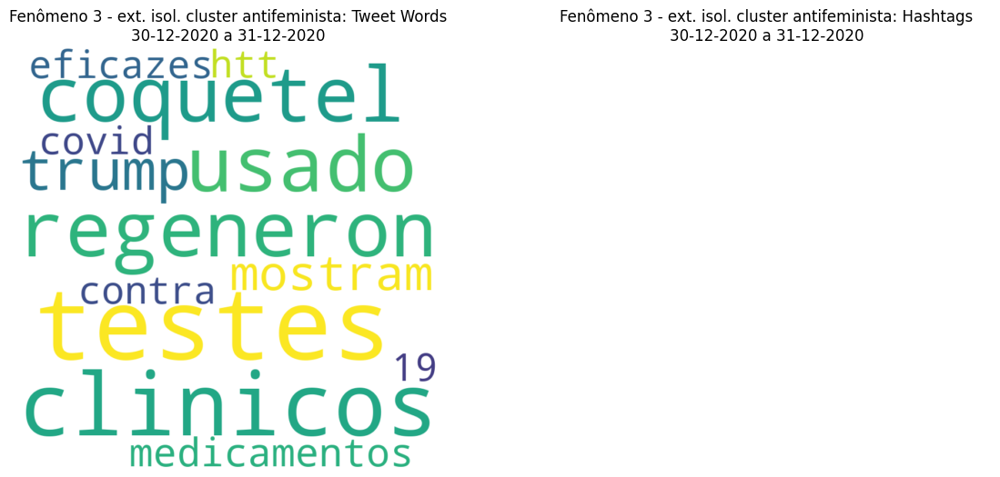

,tweet_text,user_ideology_classification
39005,"@RicBarbosa3 @RitaLisauskas De onde raios você tirou esse dado?! Como se faz um aborto indireto? “Mais vociferam”, MAS",antifeminista centro
39148,"@vanidacol @JanaDahoui É opção do marido traído perdoar e aceitar, mas pra que se divorciar né... faz um aborto e finge que nada aconteceu. PqP",antifeminista centro
38552,"@AlanLopesRio @mjmacul_lima A mulher que fez ou fará um aborto, podem ter certeza que ela vai precisar de ajuda psicológica, ajuda de um clínico geral, pois aborto mexe com o físico e mental de uma mulher.\nEla terá um limite de abortos pra fazer?\nQuem vai determinar isso?\nTriste . https://t.co/G4F77yaMfB",antifeminista centro
38755,Não!!! #AbortoNAO,antifeminista centro
39069,"RT @revistaoeste: Testes clínicos com o Regeneron, coquetel usado por Trump, mostram que os medicamentos são eficazes contra a covid-19 htt…",antifeminista extrema
38759,RT @Biakicis: Essa é a sociedade Argentina pró aborto. E a legenda é sua. https://t.co/csn23ielJb,antifeminista moderada
38758,@leandroruschel Minha posição é #AbortoNAO,antifeminista moderada
38932,"RT @bruninhamaronba: Se liberaram o aborto, tem que liberar a pena de morte.\nSe inocente pode morrer.\nVagabundo também pode.",antifeminista moderada
38945,"RT @nikolas_dm: Se liberar o aborto, tem que liberar a pena de morte. Se inocente pode morrer, vagabundo também pode.",antifeminista moderada
38859,É isso! #AbortoNAO https://t.co/f6wdkmOHHS,antifeminista moderada


In [ ]:
from collections import Counter
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Função para filtrar tweets por data e encontrar as hashtags mais numerosas
def filtrar_tweets_por_data_e_hashtags(df, start_date, end_date, top_n=50):
    # Convertendo strings de data para objetos datetime.date
    start_date = pd.to_datetime(start_date).date()
    end_date = pd.to_datetime(end_date).date()
    
    # Filtrando os tweets por data
    df_filtered = df[
        (df['tweet_created_at'].dt.date >= start_date) &
        (df['tweet_created_at'].dt.date <= end_date) &
        (~df['user_ideology_classification'].isna())
    ]

    palavras_filtro = ['#BNCast2temp', '#AutonomiaEMemoria', '#aVozdeMinasnoSenado', '#Çocorro', '#DireitodeVotodaMulher', '#AutonomiaEMemória']
    filtro = df_filtered['tweet_hashtags'].apply(lambda x: not any(palavra in x for palavra in palavras_filtro))
    df_filtered = df_filtered[filtro]

    filtro = df_filtered['tweet_text_clean'].apply(lambda x: not any(palavra in x for palavra in ['motel']))
    df_filtered = df_filtered[filtro]
        
    # Contando as hashtags mais frequentes
    hashtags_list = df_filtered['tweet_hashtags'].sum()  # Somando as listas de hashtags
    hashtags_counter = Counter(hashtags_list)
    
    # Selecionando as top N hashtags mais frequentes
    top_hashtags = [hashtag for hashtag, _ in hashtags_counter.most_common(top_n)]
    
    return df_filtered, top_hashtags

# Função para criar e exibir as nuvens de palavras por fenômeno e ideologia
def create_wordclouds_by_phenomenon_and_ideology(df, phenomenon_number, start_date, end_date):
    for ideology_key, ideology_name in rename_map.items():
        df_ideology = df[df['user_ideology_classification'] == ideology_key]
        
        # Contar as palavras em tweet_text_clean
        tweet_words = Counter()
        for words_list in df_ideology['tweet_text_clean'].dropna():
            words = words_list.split()  # Dividindo as palavras na string
            tweet_words.update(words)
        
        # Contar as hashtags mais usadas
        hashtags = Counter()
        for hashtags_list in df_ideology['tweet_hashtags'].dropna():
            hashtags.update(hashtags_list)  # Já é uma lista, então apenas atualizamos o Counter
        
        # Criar e exibir as nuvens de palavras
        create_wordclouds(tweet_words, hashtags, phenomenon_number, [start_date, end_date], ideology_name)

# Função para criar e exibir as nuvens de palavras
def create_wordclouds(tweet_words, hashtags, phenomenon_number, days, ideology):
    plt.figure(figsize=(14, 6))

    # Verificar se há palavras para gerar a nuvem de palavras
    if tweet_words:
        wordcloud_tweet_words = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(tweet_words)
        plt.subplot(1, 2, 1)
        plt.imshow(wordcloud_tweet_words, interpolation='bilinear')
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Tweet Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    else:
        plt.subplot(1, 2, 1)
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Tweet Words\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')

    # Verificar se há hashtags para gerar a nuvem de palavras
    if hashtags:
        wordcloud_hashtags = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(hashtags)
        plt.subplot(1, 2, 2)
        plt.imshow(wordcloud_hashtags, interpolation='bilinear')
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    else:
        plt.subplot(1, 2, 2)
        plt.title(f'Fenômeno {phenomenon_number} - {ideology}: Hashtags\n{days[0].strftime("%d-%m-%Y")} a {days[-1].strftime("%d-%m-%Y")}')
        plt.axis('off')
    
    plt.show()

# Definindo as datas dos fenômenos
fenomenos = [
    # ('2020-10-07', '2020-10-07'),  # Fenômeno 0
    # ('2020-10-17', '2020-10-17'),  # Fenômeno 1
    ('2020-10-28', '2020-10-28'),  # Fenômeno 2
    ('2020-11-03', '2020-11-05'),  # Fenômeno 3
    # ('2020-11-11', '2020-11-14'),  # Fenômeno 4
    ('2020-12-30', '2020-12-31'),  # Fenômeno 5
]

# Analisando os fenômenos
for i, (data_inicio, data_fim) in enumerate(fenomenos):
    tweets_filtrados, top_hashtags = filtrar_tweets_por_data_e_hashtags(df_feminism, data_inicio, data_fim)
    
    print(f"\nFenômeno {i + 1} ({data_inicio} a {data_fim}):")
    print(f"Hashtags mais numerosas: {top_hashtags}")
    
    # Criar e exibir as nuvens de palavras por fenômeno e ideologia na ordem de rename_map
    create_wordclouds_by_phenomenon_and_ideology(tweets_filtrados, i + 1, pd.to_datetime(data_inicio).date(), pd.to_datetime(data_fim).date())

    display(tweets_filtrados[['tweet_text', 'user_ideology_classification']].sort_values('user_ideology_classification'))


Mesmo caso do encontrado entre os tweets de influencers, com a diferença que aqui temos apenas dois picos; com o primeiro sendo bem mais destacado que o segundo.

O primeiro, mais numeroso, trata da questão mari ferrer; o segundo, da descriminalização do aborto na Argentina.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Definindo as datas dos fenômenos
fenomenos = [
    # ('2020-10-07', '2020-10-07'),  # Fenômeno 0
    # ('2020-10-17', '2020-10-17'),  # Fenômeno 1
    ('2020-10-28', '2020-10-28'),  # Fenômeno 2
    ('2020-11-03', '2020-11-05'),  # Fenômeno 3
    # ('2020-11-11', '2020-11-14'),  # Fenômeno 4
    ('2020-12-30', '2020-12-31'),  # Fenômeno 5
]

# Dicionário para renomear as faixas ideológicas
rename_map = {
    'feminista extrema': 'ext. isol. cluster feminista',
    'feminista moderada': 'mod. isol. cluster feminista',
    'feminista centro': 'pou. isol. cluster feminista',
    'centro': 'não isolado',
    'antifeminista centro': 'pou. isol. cluster antifeminista',
    'antifeminista moderada': 'mod. isol. cluster antifeminista',
    'antifeminista extrema': 'ext. isol. cluster antifeminista'
}

# Lista ordenada de faixas ideológicas
ordered_ideologies = list(rename_map.keys())

# Função para criar o gráfico único por fenômeno
def plot_tweet_counts_by_ideology(df, phenomenon_number, start_date, end_date):
    # Filtrando os tweets por data
    df_filtered = df[
        (df['tweet_created_at'].dt.date >= start_date) &
        (df['tweet_created_at'].dt.date <= end_date) &
        (~df['user_ideology_classification'].isna())
    ]

    # Contando os tweets por faixa de segmentação
    tweet_counts = df_filtered['user_ideology_classification'].value_counts().reindex(ordered_ideologies).fillna(0)
    
    # Renomeando as faixas ideológicas para exibição
    tweet_counts.index = tweet_counts.index.map(rename_map)

    # Criando o gráfico de barras com Plotly
    fig = go.Figure(data=[
        go.Bar(
            x=tweet_counts.index,
            y=tweet_counts.values,
            text=tweet_counts.values,
            textposition='auto',
            marker_color='darkblue'  # Tom de azul mais escuro
        )
    ])

    # Atualizando o layout do gráfico
    fig.update_layout(
        title_text=f'Contagem de Tweets por Faixa de Segmentação<br> {start_date} a {end_date}',
        xaxis_title='Faixa de Segmentação',
        yaxis_title='Quantidade de Tweets',
        template='plotly_white'
    )

    # Exibindo o gráfico
    fig.show()

# Gerando os gráficos para cada fenômeno
for i, (data_inicio, data_fim) in enumerate(fenomenos):
    plot_tweet_counts_by_ideology(df_feminism, i + 1, pd.to_datetime(data_inicio).date(), pd.to_datetime(data_fim).date())